In [ ]:
import sys
import os
import subprocess
import types
import numpy as np
import imageio
import SimpleITK as sitk
import pandas as pd
import cv2
from skimage.transform import resize

# 1. Mock ProgressBar because it is missing
class MockProgressBar:
    FULL = 'full'
    def __init__(self, n, fmt='full'):
        self.n = n
        self.current = 0
    def __call__(self):
        pass
    def done(self):
        pass

# Inject into sys.modules so 'from ProgressBar import ProgressBar' works
mock_pb_module = types.ModuleType("ProgressBar")
mock_pb_module.ProgressBar = MockProgressBar
sys.modules["ProgressBar"] = mock_pb_module

# 2. Setup TensorFlow 1.x compatibility
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
sys.modules['tensorflow'] = tf

# Add current directory to path to allow importing local modules
current_dir = os.getcwd()
if current_dir not in sys.path:
    sys.path.append(current_dir)

import GAN_tf
import GAN_tf_rgb
print("Setup complete.")

Setup complete.


In [26]:
# !pip install wandb
# ── Combined ACDC + M&M training ────────────────────────────────────────────
acdc_dir       = r"C:/Users/Usuario/Desktop/MRes AI and Machine Learning/MRes_Project/Dataset_2"
mm_training_dir = r"C:/Users/Usuario/Desktop/MRes AI and Machine Learning/MRes_Project/Dataset_1/Training"
mm_csv_path     = r"C:/Users/Usuario/Desktop/MRes AI and Machine Learning/MRes_Project/Dataset_1/211230_M&Ms_Dataset_information_diagnosis_opendataset.csv"

In [27]:
# =============================================================================
# Shared utilities — defined once, used throughout the notebook
# =============================================================================
import json
import random
from collections import Counter
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
from matplotlib.patches import Patch


# ── Frame preprocessing ────────────────────────────────────────────────────

def preprocess_frame(frame, p1, p99, target_size=(128, 128)):
    """Resize + percentile-normalise a 2-D frame to a 3-channel float32 array."""
    fr = cv2.resize(frame.astype(np.float32), (target_size[1], target_size[0]))
    if (p99 - p1) < 1e-7:
        return np.zeros((*target_size, 3), dtype=np.float32)
    fn = np.clip((fr - p1) / (p99 - p1 + 1e-8), 0.0, 1.0)
    return np.stack([fn] * 3, axis=-1)


def flow_to_color(flow_3ch):
    """Convert [dx, dy, mag] to HSV-based RGB for optical flow display."""
    import matplotlib.colors as mcolors
    dx, dy = flow_3ch[..., 0], flow_3ch[..., 1]
    mag, ang = cv2.cartToPolar(dx, dy)
    hsv = np.zeros((*dx.shape, 3), dtype=np.float32)
    hsv[..., 0] = ang / (2 * np.pi)
    hsv[..., 1] = 1.0
    hsv[..., 2] = mag / (np.max(mag) + 1e-8)
    return mcolors.hsv_to_rgb(hsv)


def flow_to_hsv_rgb(flow, mag, ang):
    """Convert optical flow (with pre-computed mag/ang) to HSV-based RGB."""
    import matplotlib.colors as mcolors
    hsv = np.zeros((*mag.shape, 3), dtype=np.float32)
    hsv[..., 0] = ang / (2 * np.pi)
    hsv[..., 1] = 1.0
    hsv[..., 2] = mag / (np.max(mag) + 1e-8)
    return mcolors.hsv_to_rgb(hsv)


# ── TF inference ────────────────────────────────────────────────────────────

def run_tf_inference(images, model_module, ckpt_path, batch_size=16, rescale_aux=False):
    """Run GAN inference; returns (recon_images, recon_aux). rescale_aux=True for RGB model."""
    n = len(images)
    H, W = images.shape[1], images.shape[2]
    tf.reset_default_graph()
    plh_frame       = tf.placeholder(tf.float32, shape=[None, H, W, 3])
    plh_is_training = tf.placeholder(tf.bool)
    plh_dropout     = tf.placeholder_with_default(1.0, shape=())
    scaled          = (plh_frame / 0.5) - 1.0
    out_aux, out_appe = model_module.Generator(scaled, plh_is_training, plh_dropout)
    saver = tf.train.Saver()
    recon_images = np.zeros_like(images)
    recon_aux    = np.zeros_like(images)
    batch_idxs   = np.array_split(np.arange(n), max(1, int(np.ceil(n / batch_size))))
    with tf.Session() as sess:
        saver.restore(sess, ckpt_path)
        print(f"Model loaded from {ckpt_path}")
        for bi, idx in enumerate(batch_idxs):
            pred_appe, pred_aux = sess.run(
                [out_appe, out_aux],
                feed_dict={plh_frame: images[idx], plh_is_training: False, plh_dropout: 1.0}
            )
            recon_images[idx] = np.clip(0.5 * (pred_appe + 1.0), 0.0, 1.0)
            recon_aux[idx] = (np.clip(0.5 * (pred_aux + 1.0), 0.0, 1.0)
                              if rescale_aux else pred_aux)
            if (bi + 1) % 20 == 0 or bi == len(batch_idxs) - 1:
                print(f"  Batch {bi+1}/{len(batch_idxs)} done")
    print("Inference complete.")
    return recon_images, recon_aux


# ── Slice selection ─────────────────────────────────────────────────────────

def _get_z_indices(z_total, slice_mode, n_slices=5):
    """Return list of z-indices for the requested slice_mode."""
    if slice_mode == 'all':
        return list(range(z_total))
    if slice_mode == 'mid1':
        return [z_total // 2]
    if slice_mode == 'mid5':
        if z_total <= n_slices:
            return list(range(z_total))
        center = z_total // 2
        half   = n_slices // 2
        start  = max(0, center - half)
        end    = min(z_total, start + n_slices)
        start  = max(0, end - n_slices)
        return list(range(start, end))
    raise ValueError(f"Unknown slice_mode: {slice_mode!r}.  Use 'all', 'mid1', or 'mid5'.")


# ── Per-slice preprocessing ─────────────────────────────────────────────────


def _preprocess_slice(arr, z_idx, t_in, t_out, target_size, model_type,
                     frame_mode='ed_es'):
    """Return (in_rgb, aux_target) for one z-slice, or None on failure.
    t_in is the input-frame index, t_out the target-frame index.
    aux_target is an optical-flow stack (flow) or the target RGB frame (rgb)."""
    sl = arr[:, z_idx, :, :]
    p1, p99 = np.percentile(sl, 1), np.percentile(sl, 99)
    if model_type == 'flow':
        from data_loader import aspect_preserve_resize as _apr
        def _prep(f):
            fr = _apr(f.astype(np.float32), *target_size)
            if (p99 - p1) < 1e-7:
                return np.zeros((*target_size, 3), dtype=np.float32)
            fn = np.clip((fr - p1) / (p99 - p1 + 1e-8), 0.0, 1.0)
            return np.stack([fn] * 3, axis=-1)
        in_rgb  = _prep(sl[t_in])
        out_rgb = _prep(sl[t_out])
        if frame_mode == 'ed_es' and np.mean(np.abs(out_rgb - in_rgb)) < 0.01:
            return None
        in_g  = (in_rgb[:, :, 0]  * 255).astype(np.uint8)
        out_g = (out_rgb[:, :, 0] * 255).astype(np.uint8)
        try:
            flow = cv2.calcOpticalFlowFarneback(in_g, out_g, None, 0.5, 3, 7, 3, 5, 1.2, 0)
        except Exception:
            return None
        mag, _ = cv2.cartToPolar(flow[..., 0], flow[..., 1])
        return in_rgb, np.dstack((flow, mag))
    else:
        from data_loader_rgb import normalize_frame_to_rgb
        in_rgb  = normalize_frame_to_rgb(sl[t_in],  p1, p99, 0, 0, target_size)
        out_rgb = normalize_frame_to_rgb(sl[t_out], p1, p99, 0, 0, target_size)
        if frame_mode == 'ed_es' and np.mean(np.abs(out_rgb - in_rgb)) < 0.01:
            return None
        return in_rgb, out_rgb


# ── ACDC test-split scanning ────────────────────────────────────────────────

def _scan_acdc_test_split(testing_dir, seed=42):
    """Scan the ACDC testing folder; return (test_set, patient_info) for the standard 38-patient split."""
    group_patients, patient_info = {}, {}
    for p in sorted(os.listdir(testing_dir)):
        p_dir = os.path.join(testing_dir, p)
        if not os.path.isdir(p_dir):
            continue
        cfg = os.path.join(p_dir, 'Info.cfg')
        if not os.path.exists(cfg):
            continue
        info = {}
        with open(cfg, 'r') as f:
            for line in f:
                if ':' in line:
                    k, v = line.strip().split(':', 1)
                    info[k.strip()] = v.strip()
        group = info.get('Group', '')
        if not group:
            continue
        patient_info[p] = info
        group_patients.setdefault(group, []).append(p)
    rng = random.Random(seed)
    test_set = set()
    for grp, pats in sorted(group_patients.items()):
        n_val = {'NOR': 4, 'MINF': 2, 'DCM': 2, 'HCM': 2, 'RV': 2}.get(grp, 2)
        shuffled = pats[:]
        rng.shuffle(shuffled)
        test_set.update(shuffled[n_val:])
    return test_set, patient_info


# ── Unified data loaders ────────────────────────────────────────────────────

def _build_frame_pairs(frame_mode, T, ed_idx, es_idx):
    """Return list of (t_in, t_out) pairs for the chosen frame_mode, or None to skip."""
    if frame_mode == 'next_frame':
        if T < 2:
            return None
        return [(t, t + 1) for t in range(T - 1)]
    if frame_mode == 'next_frame_systole':
        # (t, t+1) over systole; when ES<=ED fall back to frames 0..ES (only ES==0 skipped)
        if ed_idx is None or es_idx is None or es_idx <= 0 or es_idx >= T:
            return None
        return [(t, t + 1) for t in range(ed_idx if ed_idx < es_idx else 0, es_idx)]
    # default: ed_es — input is ES, target is ED
    if ed_idx is None or es_idx is None or ed_idx == es_idx:
        return None
    if es_idx >= T or ed_idx >= T:
        return None
    return [(es_idx, ed_idx)]


def _read_volume_oriented(nii_path):
    """Read a 4D NIfTI, applying orientation + spacing normalisation when
    enabled via set_orientation_normalization / set_spacing_normalization
    (mirrors run_model.py and the official loaders). No-op when disabled."""
    import data_loader_rgb as _dlrgb
    return _dlrgb.load_and_orient_sitk(nii_path)


def _load_acdc_slices(acdc_dir, model_type, slice_mode, n_slices, target_size,
                     seed=42, frame_mode='ed_es'):
    """Load ACDC test data for a given model_type, slice_mode, and frame_mode."""
    testing_dir = os.path.join(acdc_dir, 'database', 'testing')
    test_set, patient_info = _scan_acdc_test_split(testing_dir, seed)
    images, aux_targets, labels, pids, slice_ids = [], [], [], [], []
    for patient_id in sorted(test_set):
        info = patient_info[patient_id]
        try:
            ed_idx, es_idx = int(info['ED']), int(info['ES'])
        except Exception:
            ed_idx, es_idx = None, None
        nii_path = os.path.join(testing_dir, patient_id, f'{patient_id}_4d.nii.gz')
        if not os.path.exists(nii_path):
            continue
        try:
            arr = _read_volume_oriented(nii_path)
        except Exception:
            continue
        if arr.ndim != 4:
            continue
        T, Z = arr.shape[0], arr.shape[1]
        frame_pairs = _build_frame_pairs(frame_mode, T, ed_idx, es_idx)
        if frame_pairs is None:
            continue
        z_indices = [z for z in _get_z_indices(Z, slice_mode, n_slices) if 0 < z < Z - 1]
        for z_idx in z_indices:
            for (t_in, t_out) in frame_pairs:
                result = _preprocess_slice(arr, z_idx, t_in, t_out, target_size, model_type, frame_mode=frame_mode)
                if result is None:
                    continue
                images.append(result[0]); aux_targets.append(result[1])
                labels.append(info['Group']); pids.append(patient_id); slice_ids.append(z_idx)
        if frame_mode == 'next_frame':
            print(f'  {patient_id} ({info["Group"]})  slices={z_indices}  T={T}  pairs={len(frame_pairs)}')
        else:
            print(f'  {patient_id} ({info["Group"]})  slices={z_indices}  ED={ed_idx} ES={es_idx}')
    return np.array(images), np.array(aux_targets), labels, pids, slice_ids


def _load_mm_slices(mm_dir, csv_path, model_type, slice_mode, n_slices, target_size,
                    frame_mode='ed_es'):
    """Load M&M test data for a given model_type, slice_mode, and frame_mode."""
    df_labels = pd.read_csv(csv_path)
    lookup = {row['External code']: (int(row['ED']), int(row['ES']), row['Pathology'])
              for _, row in df_labels.iterrows()}
    sa_files = sorted(f for f in os.listdir(mm_dir)
                      if f.endswith('_sa.nii.gz') and not f.endswith('_sa_gt.nii.gz'))
    print(f'M&M: found {len(sa_files)} subjects')
    images, aux_targets, labels, pids, slice_ids = [], [], [], [], []
    for fname in sa_files:
        subject_id = fname.replace('_sa.nii.gz', '')
        if subject_id not in lookup:
            continue
        ed_idx, es_idx, pathology = lookup[subject_id]
        try:
            arr = _read_volume_oriented(os.path.join(mm_dir, fname))
        except Exception:
            continue
        if arr.ndim != 4:
            continue
        T, Z = arr.shape[0], arr.shape[1]
        frame_pairs = _build_frame_pairs(frame_mode, T, ed_idx, es_idx)
        if frame_pairs is None:
            continue
        z_indices = [z for z in _get_z_indices(Z, slice_mode, n_slices) if 0 < z < Z - 1]
        for z_idx in z_indices:
            for (t_in, t_out) in frame_pairs:
                result = _preprocess_slice(arr, z_idx, t_in, t_out, target_size, model_type, frame_mode=frame_mode)
                if result is None:
                    continue
                images.append(result[0]); aux_targets.append(result[1])
                labels.append(pathology); pids.append(subject_id); slice_ids.append(z_idx)
        if frame_mode == 'next_frame':
            print(f'  {subject_id} ({pathology})  slices={z_indices}  T={T}  pairs={len(frame_pairs)}')
        else:
            print(f'  {subject_id} ({pathology})  slices={z_indices}  ED={ed_idx} ES={es_idx}')
    return np.array(images), np.array(aux_targets), labels, pids, slice_ids


def load_test_data(acdc_dir, mm_dir, mm_csv, model_type='flow', slice_mode='all',
                   n_slices=5, target_size=(128, 128), frame_mode='ed_es',
                   datasets=('ACDC', 'MM')):
    """Load combined ACDC + M&M test data.

    Parameters
    ----------
    model_type : 'flow' | 'rgb'
    slice_mode : 'all' | 'mid1' | 'mid5'
    frame_mode : 'ed_es' (default) | 'next_frame'
                 'ed_es'      -> one (ES -> ED) pair per subject
                 'next_frame' -> every consecutive (t, t+1) pair per subject
    datasets   : iterable of any of {'ACDC', 'MM'} — which test datasets to load.
                 Defaults to both; pass e.g. ('ACDC',) for ACDC-only evaluation.

    Returns
    -------
    images, aux_targets, labels, pids, source, slice_ids
    """
    datasets = tuple(datasets)
    if not datasets:
        raise ValueError("datasets must contain at least one of 'ACDC', 'MM'")
    use_delegated_all = (slice_mode == 'all' and frame_mode == 'ed_es')

    img_parts, aux_parts = [], []
    all_labels, all_pids, all_source, all_sids = [], [], [], []

    if use_delegated_all:
        # Delegate to existing loaders — they use aspect_preserve_resize + motion filtering
        # matching the original training pipeline exactly. Only valid for ED/ES;
        # the underlying data_loader functions are ED/ES-only by construction.
        # Note: data_loader_rgb.load_mm_validation_ed_es_data requires _sa_gt.nii.gz mask files;
        # subjects without masks are silently skipped.
        if model_type == 'flow':
            import data_loader as _dl
        else:
            import data_loader_rgb as _dl
        if 'ACDC' in datasets:
            print(f'{"="*60}\nLoading ACDC [{model_type} / all / ed_es]...\n{"="*60}')
            # load_acdc_test_val_*_data returns 10 values:
            #   (val_p1, val_p2, val_lbls, val_pids, val_sids,
            #    test_p1, test_p2, test_lbls, test_pids, test_sids)
            # We use the test split only here (val is consumed by the validation cell).
            (_, _, _, _, _,
             acdc_img, acdc_aux, acdc_labels, acdc_pids, acdc_sids) = \
                _dl.load_acdc_test_val_ed_es_data(acdc_dir, target_size)
            print(f'ACDC: {len(acdc_img)} samples\n')
            img_parts.append(acdc_img); aux_parts.append(acdc_aux)
            all_labels += acdc_labels; all_pids += acdc_pids
            all_source += ['ACDC'] * len(acdc_img); all_sids += acdc_sids
        if 'MM' in datasets:
            print(f'{"="*60}\nLoading M&M [{model_type} / all / ed_es]...\n{"="*60}')
            mm_img, mm_aux, mm_labels, mm_pids, mm_sids = \
                _dl.load_mm_validation_ed_es_data(mm_dir, mm_csv, target_size)
            print(f'M&M: {len(mm_img)} samples')
            img_parts.append(mm_img); aux_parts.append(mm_aux)
            all_labels += mm_labels; all_pids += mm_pids
            all_source += ['MM'] * len(mm_img); all_sids += mm_sids
    else:
        # Per-slice path — handles slice_mode='all' as well, and supports next_frame mode.
        if 'ACDC' in datasets:
            print(f'{"="*60}\nLoading ACDC [{model_type} / {slice_mode} / {frame_mode}]...\n{"="*60}')
            acdc_img, acdc_aux, acdc_labels, acdc_pids, acdc_sids = _load_acdc_slices(
                acdc_dir, model_type, slice_mode, n_slices, target_size, frame_mode=frame_mode)
            print(f'ACDC: {len(acdc_img)} samples\n')
            img_parts.append(acdc_img); aux_parts.append(acdc_aux)
            all_labels += acdc_labels; all_pids += acdc_pids
            all_source += ['ACDC'] * len(acdc_img); all_sids += acdc_sids
        if 'MM' in datasets:
            print(f'{"="*60}\nLoading M&M [{model_type} / {slice_mode} / {frame_mode}]...\n{"="*60}')
            mm_img, mm_aux, mm_labels, mm_pids, mm_sids = _load_mm_slices(
                mm_dir, mm_csv, model_type, slice_mode, n_slices, target_size, frame_mode=frame_mode)
            print(f'M&M: {len(mm_img)} samples')
            img_parts.append(mm_img); aux_parts.append(mm_aux)
            all_labels += mm_labels; all_pids += mm_pids
            all_source += ['MM'] * len(mm_img); all_sids += mm_sids

    images   = np.concatenate(img_parts, axis=0)
    aux_tgts = np.concatenate(aux_parts, axis=0)

    print(f'\nTotal: {len(images)} samples  {images.shape}')
    for lbl, cnt in sorted(Counter(all_labels).items()):
        print(f'  {lbl:>6s}: {cnt:5d}')
    return images, aux_tgts, all_labels, all_pids, all_source, all_sids


# -- Gradient loss helper (mirrors tf.image.image_gradients) -----------------

def _image_grad_np(img):
    """Mirror tf.image.image_gradients on a single HxWxC numpy image."""
    dy = np.zeros_like(img)
    dx = np.zeros_like(img)
    dy[:-1] = img[1:] - img[:-1]
    dx[:, :-1] = img[:, 1:] - img[:, :-1]
    return dy, dx


def _gradient_loss_np(gt, pr):
    """Training-time gradient term: mean(||dy_pr|-|dy_gt|| + ||dx_pr|-|dx_gt||)."""
    dy1, dx1 = _image_grad_np(pr)
    dy0, dx0 = _image_grad_np(gt)
    return float(np.mean(
        np.abs(np.abs(dy1) - np.abs(dy0)) + np.abs(np.abs(dx1) - np.abs(dx0))
    ))


def _per_sample_losses(gt_img, pr_img, gt_aux, pr_aux, model_type):
    """Return (loss_appe_full, loss_aux_full) matching the training definition.

    Images come from the notebook in [0, 1]; training computes the loss in
    [-1, 1]. We rescale here so values are directly comparable to mu_appe /
    mu_aux as logged in mu_baseline_*.json.
    """
    gt_img_s = 2.0 * gt_img - 1.0
    pr_img_s = 2.0 * pr_img - 1.0
    appe_inten = float(np.mean((gt_img_s - pr_img_s) ** 2))
    appe_grad  = _gradient_loss_np(gt_img_s, pr_img_s)
    loss_appe_full = appe_inten + appe_grad
    if model_type == 'flow':
        loss_aux_full = float(np.mean(np.abs(gt_aux - pr_aux)))
    else:
        gt_aux_s = 2.0 * gt_aux - 1.0
        pr_aux_s = 2.0 * pr_aux - 1.0
        aux_inten = float(np.mean((gt_aux_s - pr_aux_s) ** 2))
        aux_grad  = _gradient_loss_np(gt_aux_s, pr_aux_s)
        loss_aux_full = aux_inten + aux_grad
    return loss_appe_full, loss_aux_full


# ── Metric computation ──────────────────────────────────────────────────────

def get_metric_names(model_type, frame_mode='ed_es'):
    """Return column->display-label dict for the given model_type / frame_mode.

    The aux head predicts optical flow (flow models) or a video frame (rgb).
    For rgb the predicted frame is ED only when frame_mode='ed_es'; in
    'next_frame' mode it predicts the next consecutive frame.
    """
    if model_type == 'flow':
        aux_short = 'Flow'
    else:
        aux_short = 'Next Frame' if frame_mode == 'next_frame' else 'ED Pred'
    base = {
        'mse_appe':  'Appearance MSE (↓)',
        'psnr_appe': 'Appearance PSNR (↑)',
        'ssim_appe': 'Appearance SSIM (↑)',
        'mae_aux':   f'{aux_short} MAE (↓)',
        'mse_aux':   f'{aux_short} MSE (↓)',
    }
    if model_type == 'rgb':
        base['psnr_aux'] = f'{aux_short} PSNR (↑)'
        base['ssim_aux'] = f'{aux_short} SSIM (↑)'
    return base


def compute_metrics(images, aux_targets, recon_images, recon_aux,
                    labels, pids, source, model_type, slice_ids=None,
                    mu_appe=None, mu_aux=None):
    """Per-sample reconstruction metrics + training-matched combined score.

    Adds two new columns vs the original definition:
      - loss_appe_full : intensity MSE + gradient term ([-1, 1] scale)
      - loss_aux_full  : MAE (flow) or intensity MSE + gradient ([-1, 1], rgb)
    `combined_paper` is built from these (so units match training mu).
    If mu_appe / mu_aux are not supplied, falls back to test-NOR mean over
    the matching loss columns (mildly leaky -- fine for diagnostics only).
    """
    rows = []
    for i in range(len(images)):
        gt_img, gt_aux = images[i], aux_targets[i]
        pr_img, pr_aux = recon_images[i], recon_aux[i]
        # Diagnostic ([0, 1]) -- preserved for plots/back-compat.
        mse_a  = float(np.mean((gt_img - pr_img) ** 2))
        mse_ax = float(np.mean((gt_aux - pr_aux) ** 2))
        loss_appe_full, loss_aux_full = _per_sample_losses(
            gt_img, pr_img, gt_aux, pr_aux, model_type)
        row = {
            'mse_appe':       mse_a,
            'psnr_appe':      10 * np.log10(1.0 / (mse_a + 1e-10)),
            'ssim_appe':      ssim(gt_img, pr_img, data_range=1.0, channel_axis=-1),
            'mae_aux':        float(np.mean(np.abs(gt_aux - pr_aux))),
            'mse_aux':        mse_ax,
            'loss_appe_full': loss_appe_full,
            'loss_aux_full':  loss_aux_full,
            'label':          labels[i], 'pid': pids[i], 'source': source[i],
        }
        if model_type == 'rgb':
            row['psnr_aux'] = 10 * np.log10(1.0 / (mse_ax + 1e-10))
            row['ssim_aux'] = ssim(gt_aux, pr_aux, data_range=1.0, channel_axis=-1)
        if slice_ids is not None:
            row['slice_idx'] = slice_ids[i]
        rows.append(row)
    df = pd.DataFrame(rows)
    df['sample_idx']     = np.arange(len(df))
    df['healthy']        = df['label'].apply(lambda x: 'Healthy (NOR)' if x == 'NOR' else 'Unhealthy')
    df['binary_label']   = (df['label'] != 'NOR').astype(int)
    df['combined_score'] = df['mse_appe'] + 2.0 * df['mae_aux']
    nor = df['label'] == 'NOR'
    if mu_appe is None:
        mu_appe = float(df.loc[nor, 'loss_appe_full'].mean() if nor.any() else df['loss_appe_full'].mean())
        mu_appe_src = 'test-NOR (fallback)'
    else:
        mu_appe = float(mu_appe); mu_appe_src = 'provided (training)'
    if mu_aux is None:
        mu_aux = float(df.loc[nor, 'loss_aux_full'].mean() if nor.any() else df['loss_aux_full'].mean())
        mu_aux_src = 'test-NOR (fallback)'
    else:
        mu_aux = float(mu_aux); mu_aux_src = 'provided (training)'
    print(f'  mu_appe = {mu_appe:.4f}  [{mu_appe_src}]')
    print(f'  mu_aux  = {mu_aux:.4f}  [{mu_aux_src}]')
    eps = 1e-10
    df['combined_paper'] = (
        np.log(np.maximum(df['loss_aux_full'].values,  eps) / max(mu_aux,  eps)) +
        0.2 * np.log(np.maximum(df['loss_appe_full'].values, eps) / max(mu_appe, eps))
    )
    return df


# ── Plotting ────────────────────────────────────────────────────────────────

def plot_healthy_vs_unhealthy(df, metric_names, title):
    """Box plots: Healthy (NOR) vs Unhealthy, with summary statistics."""
    n = len(metric_names)
    fig, axes = plt.subplots(1, n, figsize=(4.5 * n, 5))
    if n == 1: axes = [axes]
    colors = {'Healthy (NOR)': '#2ecc71', 'Unhealthy': '#e74c3c'}
    for ax, (col, col_title) in zip(axes, metric_names.items()):
        data_h = df[df['healthy'] == 'Healthy (NOR)'][col]
        data_u = df[df['healthy'] == 'Unhealthy'][col]
        bp = ax.boxplot([data_h, data_u], labels=['Healthy\n(NOR)', 'Unhealthy'],
                        patch_artist=True, widths=0.5, showfliers=False)
        bp['boxes'][0].set_facecolor(colors['Healthy (NOR)'])
        bp['boxes'][1].set_facecolor(colors['Unhealthy'])
        for b in bp['boxes']: b.set_alpha(0.7)
        ax.set_title(col_title, fontsize=11, fontweight='bold')
        ax.grid(axis='y', alpha=0.3)
    plt.suptitle(title, fontweight='bold', fontsize=14)
    plt.tight_layout(); plt.show()
    print(f'\n{"="*70}\n  {title}\n{"="*70}')
    for group in ['Healthy (NOR)', 'Unhealthy']:
        subset = df[df['healthy'] == group]
        print(f'\n  {group} ({len(subset)} samples):')
        for col, col_title in metric_names.items():
            print(f'    {col_title:>35s}:  {subset[col].mean():.4f} ± {subset[col].std():.4f}')


def plot_per_disease(df, metric_names, title):
    """Box plots per disease class, with per-disease summary table."""
    plot_cols = list(metric_names.keys())
    n = len(plot_cols)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 5 * nrows))
    axes = np.array(axes).flatten()
    all_labels = sorted(df['label'].unique())
    if 'NOR' in all_labels:
        all_labels.remove('NOR'); all_labels = ['NOR'] + all_labels
    cmap = plt.cm.Set2
    d_colors = {'NOR': '#2ecc71'}
    for j, lbl in enumerate(l for l in all_labels if l != 'NOR'):
        d_colors[lbl] = cmap(j / max(1, len(all_labels) - 1))
    for ax_i, col in enumerate(plot_cols):
        ax = axes[ax_i]
        data = [df[df['label'] == lbl][col].values for lbl in all_labels]
        bp = ax.boxplot(data, labels=all_labels, patch_artist=True, showfliers=False, widths=0.6)
        for patch, lbl in zip(bp['boxes'], all_labels):
            patch.set_facecolor(d_colors[lbl]); patch.set_alpha(0.7)
        ax.set_title(metric_names[col], fontsize=11, fontweight='bold')
        ax.tick_params(axis='x', rotation=45); ax.grid(axis='y', alpha=0.3)
    for ax in axes[n:]: ax.set_visible(False)
    plt.suptitle(title, fontweight='bold', fontsize=14)
    plt.tight_layout(); plt.show()
    print(f'\n{"="*90}\n  Per-Disease Summary\n{"="*90}')
    for lbl in all_labels:
        s = df[df['label'] == lbl]
        row = f'  {lbl:>8s}  {len(s):5d}'
        for col in plot_cols:
            row += f'  {s[col].mean():6.4f}±{s[col].std():.3f}'
        print(row)


def plot_dataset_comparison(df, metric_names, model_dataset, model_epoch):
    """ACDC vs M&M box plots (Healthy vs Unhealthy) for the first 5 metrics."""
    cols = list(metric_names.items())[:5]
    fig, axes = plt.subplots(1, len(cols), figsize=(24, 5))
    if len(cols) == 1: axes = [axes]
    for ax, (col, col_title) in zip(axes, cols):
        for src_name, color, offset in [('ACDC', '#3498db', -0.15), ('MM', '#e67e22', 0.15)]:
            subset = df[df['source'] == src_name]
            h_data = subset[subset['healthy'] == 'Healthy (NOR)'][col]
            u_data = subset[subset['healthy'] == 'Unhealthy'][col]
            bp = ax.boxplot([h_data, u_data], positions=[1 + offset, 2 + offset],
                            widths=0.25, patch_artist=True, showfliers=False)
            for b in bp['boxes']: b.set_facecolor(color); b.set_alpha(0.6)
            for elem in ['whiskers', 'caps', 'medians']:
                for line in bp[elem]: line.set_color('black')
        ax.set_xticks([1, 2]); ax.set_xticklabels(['Healthy\n(NOR)', 'Unhealthy'])
        ax.set_title(col_title, fontsize=11, fontweight='bold'); ax.grid(axis='y', alpha=0.3)
    legend_patches = [Patch(facecolor='#3498db', alpha=0.6, label='ACDC'),
                      Patch(facecolor='#e67e22', alpha=0.6, label='M&M')]
    axes[-1].legend(handles=legend_patches, loc='upper right')
    plt.suptitle(f'ACDC vs M&M — {model_dataset} (Epoch {model_epoch})',
                 fontweight='bold', fontsize=14)
    plt.tight_layout(); plt.show()


# ── AUC evaluation ──────────────────────────────────────────────────────────

# ── Shared AUC-table helpers (per-dataset & per-disease, rendered as DataFrames) ──
from IPython.display import display

def _auc_or_nan(y, s):
    return roc_auc_score(y, s) if len(np.unique(y)) > 1 else np.nan

def _datasets_present(src):
    return ['All'] + [s for s in ['ACDC', 'MM'] if (src == s).any()]

def auc_overall_by_dataset(df, channel_scores):
    """rows = score channel, cols = [All, ACDC, M&M]; healthy-vs-unhealthy AUC."""
    y, src = df['binary_label'].values, df['source'].values
    cols = _datasets_present(src)
    data = {ds: [] for ds in cols}
    for name, s in channel_scores.items():
        s = np.asarray(s)
        for ds in cols:
            m = np.ones(len(df), bool) if ds == 'All' else (src == ds)
            data[ds].append(_auc_or_nan(y[m], s[m]))
    return pd.DataFrame(data, index=list(channel_scores)).round(4)

def auc_disease_by_dataset(df, score):
    """rows = disease, cols = [All, ACDC, M&M]; each = disease-vs-NOR AUC (one channel)."""
    labels, src = df['label'].values, df['source'].values
    score = np.asarray(score)
    diseases = sorted(l for l in np.unique(labels) if l != 'NOR')
    cols = _datasets_present(src)
    data = {ds: [] for ds in cols}
    for d in diseases:
        for ds in cols:
            base = np.ones(len(df), bool) if ds == 'All' else (src == ds)
            m = base & ((labels == 'NOR') | (labels == d))
            yd = (labels[m] != 'NOR').astype(int)
            data[ds].append(_auc_or_nan(yd, score[m]))
    return pd.DataFrame(data, index=diseases).round(4)

def counts_by_dataset(df):
    """rows = [All, ACDC, M&M], cols = [NOR, unhealthy] sample counts."""
    src, y = df['source'].values, df['binary_label'].values
    rows = {}
    for ds in _datasets_present(src):
        m = np.ones(len(df), bool) if ds == 'All' else (src == ds)
        rows[ds] = {'NOR': int((y[m] == 0).sum()), 'unhealthy': int((y[m] == 1).sum())}
    return pd.DataFrame(rows).T



def run_auc_evaluation(df, model_type='flow', frame_mode='ed_es'):
    """Compute and plot AUC-ROC using the training-matched loss columns.

    Reports three scores (down from five) -- the previous diagnostic columns
    `mse_appe` / `mae_aux` / `mse_aux` / `combined_score` mixed scales and
    were redundant once `loss_appe_full` and `loss_aux_full` exist.
    """
    y_true = df['binary_label'].values
    print(f'Samples: {(y_true==0).sum()} healthy (NOR), {(y_true==1).sum()} unhealthy')
    if model_type == 'flow':
        aux_label = 'Flow'
    else:
        aux_label = 'Next Frame' if frame_mode == 'next_frame' else 'ED Pred'
    scores = {
        f'Appearance (full loss)':         df['loss_appe_full'].values,
        f'{aux_label} (full loss)':        df['loss_aux_full'].values,
        f'Combined (paper log formula)':   df['combined_paper'].values,
    }
    print(f'\n{"="*50}\n  AUC-ROC Scores\n{"="*50}')
    auc_results = {}
    for name, score in scores.items():
        auc = roc_auc_score(y_true, score)
        auc_results[name] = auc
        print(f'  {name:>40s}:  AUC = {auc:.4f}')
    colors = ['#e74c3c', '#3498db', '#9b59b6']
    fig, axes = plt.subplots(1, len(scores), figsize=(6 * len(scores), 5))
    if len(scores) == 1: axes = [axes]
    for ax, (name, score), color in zip(axes, scores.items(), colors):
        fpr, tpr, _ = roc_curve(y_true, score)
        ax.plot(fpr, tpr, color=color, lw=2, label=f'AUC = {auc_results[name]:.4f}')
        ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
        ax.set_xlabel('False Positive Rate', fontsize=11)
        ax.set_ylabel('True Positive Rate', fontsize=11)
        ax.set_title(name, fontsize=12, fontweight='bold')
        ax.legend(loc='lower right', fontsize=12)
        ax.grid(alpha=0.3); ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
    plt.suptitle('ROC Curves -- Healthy vs Unhealthy (training-matched losses)',
                 fontweight='bold', fontsize=14)
    plt.tight_layout(); plt.show()
    print('\n' + '=' * 65 + '\n  AUC-ROC by Dataset (generalization)\n' + '=' * 65)
    sources_present = [s for s in ['ACDC', 'MM'] if (df['source'] == s).any()]
    src_label = {'ACDC': 'ACDC', 'MM': 'M&M'}
    overall_tbl = auc_overall_by_dataset(df, scores)
    display(overall_tbl)
    display(counts_by_dataset(df))
    per_dataset_auc = {s: {name: overall_tbl.loc[name, s] for name in scores}
                       for s in sources_present}

    if len(sources_present) >= 2:
        fig, axes = plt.subplots(1, len(scores), figsize=(6 * len(scores), 5))
        if len(scores) == 1: axes = [axes]
        ds_colors = {'ACDC': '#3498db', 'MM': '#e67e22'}
        for ax, (name, score) in zip(axes, scores.items()):
            for src in sources_present:
                mask = (df['source'] == src).values
                y_sub, s_sub = y_true[mask], score[mask]
                if len(np.unique(y_sub)) < 2: continue
                fpr, tpr, _ = roc_curve(y_sub, s_sub)
                a = per_dataset_auc[src][name]
                ax.plot(fpr, tpr, color=ds_colors[src], lw=2,
                        label=f'{src_label[src]}: AUC = {a:.4f}')
            ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
            ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
            ax.set_title(name, fontsize=11, fontweight='bold')
            ax.legend(loc='lower right', fontsize=10); ax.grid(alpha=0.3)
            ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
        plt.suptitle('Per-Dataset ROC -- generalization across ACDC vs M&M',
                     fontweight='bold', fontsize=14)
        plt.tight_layout(); plt.show()
    print('\n' + '=' * 78 + '\n  AUC per Disease (each vs NOR) -- overall and per dataset\n' + '=' * 78)
    for _name, _score in scores.items():
        print(f'  Per-disease AUC -- {_name}')
        display(auc_disease_by_dataset(df, _score))

    return scores, y_true, auc_results


# ── Patient-level evaluation ────────────────────────────────────────────────

def run_patient_evaluation(df, aggregation='max_score'):
    """Aggregate slice-level scores to patient level and compute patient AUC.

    Uses the training-matched columns: `loss_appe_full`, `loss_aux_full`,
    `combined_paper`.

    Parameters
    ----------
    aggregation : how slice-level rows roll up to one score per patient.
        Flat (treats every row in df as one sample):
          'max_score'       -- patient score = max over all rows
          'mean_score'      -- patient score = mean over all rows
          'top3_mean'       -- patient score = mean of top-3 rows

        Hierarchical (collapse rows -> per-slice score first, then -> patient).
        Best for `next_frame` mode, where each (patient, slice) has many
        consecutive frame pairs; flat max is dominated by single-pair noise.
          'hier_mean_max'   -- per slice: mean over frame-pairs;
                              per patient: max over slices
          'hier_mean_top3'  -- per slice: mean over frame-pairs;
                              per patient: mean of top-3 slices
        Falls back to flat behaviour when `slice_idx` is missing or each
        (patient, slice) has only one row (i.e. ed_es mode).
    """
    score_cols = {
        'Appearance (full loss)': 'loss_appe_full',
        'Aux (full loss)':        'loss_aux_full',
        'Combined (paper)':       'combined_paper',
    }
    valid_aggs = ('max_score', 'mean_score', 'top3_mean',
                  'hier_mean_max', 'hier_mean_top3')
    if aggregation not in valid_aggs:
        raise ValueError(f"Unknown aggregation: {aggregation!r}. Use one of {valid_aggs}.")
    agg_label = {
        'max_score':       'Max Score',
        'mean_score':      'Mean Score',
        'top3_mean':       'Top-3 Mean',
        'hier_mean_max':   'Hierarchical (mean/slice -> max/patient)',
        'hier_mean_top3':  'Hierarchical (mean/slice -> top-3 mean/patient)',
    }[aggregation]
    is_hier = aggregation.startswith('hier_')
    if is_hier and 'slice_idx' not in df.columns:
        print('  [warning] hierarchical aggregation requested but `slice_idx` is '
              'not in df; falling back to flat behaviour. Re-run run_evaluation '
              'so slice_ids is threaded through.')
    print(f'\n{"="*70}\n  Patient-Level AUC -- {agg_label}\n{"="*70}')

    results, curves = [], {}
    for name, col in score_cols.items():
        tmp = df[['source', 'pid', 'label', 'binary_label']].copy()
        tmp['score'] = df[col].values
        if is_hier and 'slice_idx' in df.columns:
            tmp['slice_idx'] = df['slice_idx'].values
            slice_means = (tmp.groupby(['source', 'pid', 'label', 'binary_label', 'slice_idx'])
                              ['score'].mean().reset_index(name='slice_score'))
            g = slice_means.groupby(['source', 'pid', 'label', 'binary_label'])['slice_score']
            if aggregation == 'hier_mean_max':
                pat = g.max().reset_index(name='agg_score')
            else:  # hier_mean_top3
                pat = g.apply(lambda x: float(np.sort(x.values)[-3:].mean())
                              ).reset_index(name='agg_score')
        else:
            g = tmp.groupby(['source', 'pid', 'label', 'binary_label'])['score']
            if aggregation in ('max_score', 'hier_mean_max'):
                pat = g.max().reset_index(name='agg_score')
            elif aggregation == 'mean_score':
                pat = g.mean().reset_index(name='agg_score')
            else:
                pat = g.apply(lambda x: float(np.sort(x.values)[-3:].mean())
                              ).reset_index(name='agg_score')

        auc_v = roc_auc_score(pat['binary_label'].values, pat['agg_score'].values)
        results.append({'Score': name, f'AUC ({aggregation})': auc_v, 'n_patients': len(pat)})
        curves[name] = pat
        print(f'  {name:>26s}: AUC = {auc_v:.4f}  ({len(pat)} patients)')
        for src_name in ['ACDC', 'MM']:
            sub = pat[pat['source'] == src_name]
            y_s = sub['binary_label'].values
            if len(sub) == 0 or len(np.unique(y_s)) < 2:
                results[-1][f'AUC_{src_name}'] = float('nan')
                print(f'  {"":>26s}    [{src_name:>4s}]  AUC = N/A  ({len(sub)} patients)')
            else:
                a = roc_auc_score(y_s, sub['agg_score'].values)
                results[-1][f'AUC_{src_name}'] = a
                print(f'  {"":>26s}    [{src_name:>4s}]  AUC = {a:.4f}  ({len(sub)} patients)')

    fig, axes = plt.subplots(1, len(curves), figsize=(6 * len(curves), 5))
    if len(curves) == 1: axes = [axes]
    for ax, (name, pat), color in zip(axes, curves.items(), ['#c0392b', '#2980b9', '#8e44ad']):
        fpr, tpr, _ = roc_curve(pat['binary_label'].values, pat['agg_score'].values)
        auc_v = roc_auc_score(pat['binary_label'].values, pat['agg_score'].values)
        ax.plot(fpr, tpr, color=color, lw=2, label=f'AUC = {auc_v:.4f}')
        ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
        ax.set_title(f'{name}\n({agg_label.lower()})', fontsize=12, fontweight='bold')
        ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
        ax.legend(loc='lower right'); ax.grid(alpha=0.3)
    plt.suptitle(f'Patient-Level ROC -- {agg_label}', fontweight='bold', fontsize=14)
    plt.tight_layout(); plt.show()
    return pd.DataFrame(results)
# ── Extreme-slice visualization ─────────────────────────────────────────────

def show_extreme_slices(df, images, aux_targets, recon_images, recon_aux,
                        model_type='flow', score_col='combined_paper', n=5):
    """
    Display the n best and worst slices for healthy and anomalous samples,
    ranked by score_col (default: the paper log-formula combined score).

    Four groups:
      - Worst healthy  : NOR samples with highest score (model thinks they're anomalous)
      - Best healthy   : NOR samples with lowest score  (model is most confident they're normal)
      - Best anomaly   : pathological samples with highest score (correctly flagged)
      - Worst anomaly  : pathological samples with lowest score  (missed by the model)

    Columns per slice: ES input | ES recon | ES diff | aux target | aux recon | aux diff | ED-recon vs ES diff
    The last column (RGB only) is |ED_recon - ES|; near-zero everywhere means
    the model is essentially copying the ES input into the ED slot.
    """
    groups = [
        ('Worst Healthy (highest score → false positives)',
         df[df['label'] == 'NOR'].nlargest(n, score_col)),
        ('Best Healthy (lowest score → true negatives)',
         df[df['label'] == 'NOR'].nsmallest(n, score_col)),
        ('Best Anomaly (highest score → true positives)',
         df[df['label'] != 'NOR'].nlargest(n, score_col)),
        ('Worst Anomaly (lowest score → false negatives)',
         df[df['label'] != 'NOR'].nsmallest(n, score_col)),
    ]

    n_cols = 7
    for group_title, subset in groups:
        rows_actual = len(subset)
        if rows_actual == 0:
            print(f"No samples for: {group_title}")
            continue
        fig, axes = plt.subplots(rows_actual, n_cols,
                                 figsize=(n_cols * 2.5, rows_actual * 2.8))
        if rows_actual == 1:
            axes = axes[np.newaxis, :]
        col_titles = ['ES input', 'ES recon', 'ES diff',
                      'Flow/ED target' if model_type == 'flow' else 'ED target',
                      'Flow/ED recon' if model_type == 'flow' else 'ED recon',
                      'Aux diff',
                      '(rgb only)' if model_type == 'flow' else '|ED recon - ES|']
        for ci, ct in enumerate(col_titles):
            axes[0, ci].set_title(ct, fontsize=9, fontweight='bold')

        for ri, (_, row) in enumerate(subset.iterrows()):
            idx  = int(row['sample_idx'])
            es   = images[idx]
            es_r = recon_images[idx]
            aux  = aux_targets[idx]
            aux_r = recon_aux[idx]

            es_diff  = np.abs(es  - es_r).mean(axis=-1)
            aux_diff = np.abs(aux - aux_r).mean(axis=-1)
            # Sanity check column: if the model just copies ES into ED, this is ~0.
            ed_vs_es_diff = np.abs(aux_r - es).mean(axis=-1) if model_type == 'rgb' else None

            label = row['label']
            pid   = row['pid']
            score = row[score_col]
            sid   = row.get('slice_idx', '—')

            row_label = f"{pid} | {label} | s={sid} | {score_col}={score:.3f}"

            def _show(ax, img, cmap=None, vmin=None, vmax=None):
                if img.ndim == 3 and img.shape[-1] == 3:
                    ax.imshow(np.clip(img, 0, 1))
                else:
                    ax.imshow(img, cmap=cmap or 'gray', vmin=vmin, vmax=vmax)
                ax.axis('off')

            _show(axes[ri, 0], es)
            _show(axes[ri, 1], es_r)
            _show(axes[ri, 2], es_diff, cmap='hot', vmin=0, vmax=es_diff.max() + 1e-8)
            if model_type == 'flow':
                _show(axes[ri, 3], flow_to_color(aux))
                _show(axes[ri, 4], flow_to_color(aux_r))
            else:
                _show(axes[ri, 3], aux)
                _show(axes[ri, 4], aux_r)
            _show(axes[ri, 5], aux_diff, cmap='hot', vmin=0, vmax=aux_diff.max() + 1e-8)
            if model_type == 'rgb':
                _show(axes[ri, 6], ed_vs_es_diff, cmap='hot',
                      vmin=0, vmax=ed_vs_es_diff.max() + 1e-8)
            else:
                axes[ri, 6].axis('off')

            axes[ri, 0].set_ylabel(row_label, fontsize=7, rotation=0,
                                   labelpad=120, va='center')

        plt.suptitle(group_title, fontsize=12, fontweight='bold', y=1.01)
        plt.tight_layout()
        plt.show()

# -- get_mu_baseline: load from training JSON, else recompute ----------------

def _load_training_nor(model_type, frame_mode, datasets,
                       acdc_dir, mm_dir, mm_csv,
                       target_size=(128, 128)):
    """Load training NOR (images, aux_targets) matching run_model.py dispatch."""
    import importlib
    dl_flow = importlib.import_module('data_loader')
    dl_rgb  = importlib.import_module('data_loader_rgb')
    dl = dl_flow if model_type == 'flow' else dl_rgb
    table = {
        ('ACDC', 'ed_es'):              lambda: dl.load_acdc_ed_es_data(acdc_dir, target_size),
        ('ACDC', 'next_frame'):         lambda: dl.load_acdc_data(acdc_dir, target_size),
        ('ACDC', 'next_frame_systole'): lambda: dl.load_acdc_data(acdc_dir, target_size, restrict_to_systole=True),
        ('MM',   'ed_es'):              lambda: dl.load_mm_ed_es_data(mm_dir, mm_csv, target_size),
        ('MM',   'next_frame'):         lambda: dl.load_mm_data(mm_dir, mm_csv, target_size),
        ('MM',   'next_frame_systole'): lambda: dl.load_mm_data(mm_dir, mm_csv, target_size, restrict_to_systole=True),
    }
    imgs_all, aux_all = [], []
    for ds in datasets:
        key = (ds, frame_mode)
        if key not in table:
            print(f'  [mu] skipping {key} -- no loader')
            continue
        imgs, aux = table[key]()
        if len(imgs) > 0:
            imgs_all.append(imgs); aux_all.append(aux)
            print(f'  [mu] loaded {ds}/{frame_mode}: {len(imgs)} samples')
    if not imgs_all:
        raise RuntimeError('No training NOR samples loaded for mu recomputation.')
    return np.concatenate(imgs_all, axis=0), np.concatenate(aux_all, axis=0)


def get_mu_baseline(model_dataset, model_epoch, model_type,
                    frame_mode='ed_es', datasets=('ACDC',),
                    acdc_dir=None, mm_dir=None, mm_csv=None,
                    target_size=(128, 128), max_samples=None,
                    recompute=False, save=True):
    """Return (mu_appe, mu_aux) for the given checkpoint.

    Resolution order:
      1. Read ./training_saver/<model_dataset>/mu_baseline_<epoch>.json
         (saved automatically by GAN_tf / GAN_tf_rgb at validation time).
      2. If absent (or recompute=True), recompute by running training NOR
         through the checkpoint and save the result for next time.

    max_samples (optional): subsample N training NOR samples -- means converge
    fast, so 500 is usually plenty if you want to save inference time.
    """
    ckpt_dir = os.path.join('.', 'training_saver', model_dataset)
    json_path = os.path.join(ckpt_dir, f'mu_baseline_{model_epoch}.json')
    if (not recompute) and os.path.exists(json_path):
        with open(json_path, 'r') as f:
            data = json.load(f)
        mu_appe = float(data['mu_appe'])
        mu_aux  = float(data['mu_aux'])
        print(f'  mu_baseline loaded from {json_path}')
        print(f'    mu_appe = {mu_appe:.4f}, mu_aux = {mu_aux:.4f}')
        return mu_appe, mu_aux
    print(f'  No saved mu at {json_path}; recomputing from training NOR...')
    imgs, aux = _load_training_nor(model_type, frame_mode, datasets,
                                    acdc_dir, mm_dir, mm_csv,
                                    target_size=target_size)
    if max_samples is not None and len(imgs) > max_samples:
        rng = np.random.default_rng(0)
        idx = rng.choice(len(imgs), size=max_samples, replace=False)
        imgs, aux = imgs[idx], aux[idx]
        print(f'  Subsampled to {max_samples} training NOR samples for mu.')
    model_module = GAN_tf if model_type == 'flow' else GAN_tf_rgb
    ckpt_path = os.path.join(ckpt_dir, f'model_ckpt_{model_epoch}.ckpt')
    recon_imgs, recon_aux = run_tf_inference(
        imgs, model_module, ckpt_path, rescale_aux=(model_type == 'rgb'))
    appe_losses, aux_losses = [], []
    for i in range(len(imgs)):
        la, lx = _per_sample_losses(imgs[i], recon_imgs[i],
                                     aux[i], recon_aux[i], model_type)
        appe_losses.append(la); aux_losses.append(lx)
    mu_appe = float(np.mean(appe_losses))
    mu_aux  = float(np.mean(aux_losses))
    print(f'  Recomputed mu_appe = {mu_appe:.4f}, mu_aux = {mu_aux:.4f}')
    if save:
        os.makedirs(ckpt_dir, exist_ok=True)
        with open(json_path, 'w') as f:
            json.dump({
                'epoch':                    int(model_epoch),
                'model_type':               model_type,
                'mu_appe':                  mu_appe,
                'mu_aux':                   mu_aux,
                'recomputed_from_notebook': True,
                'n_samples':                int(len(imgs)),
                'datasets':                 list(datasets),
                'frame_mode':               frame_mode,
            }, f, indent=2)
        print(f'  Saved mu to {json_path}')
    return mu_appe, mu_aux


# ── Full evaluation pipeline ────────────────────────────────────────────────

def run_evaluation(model_type, slice_mode, model_dataset, model_epoch,
                   acdc_dir, mm_dir, mm_csv,
                   target_size=(128, 128), n_slices=5, frame_mode='ed_es',
                   datasets=('ACDC', 'MM'),
                   mu_appe=None, mu_aux=None):
    """Full evaluation pipeline; threads training mu through to compute_metrics."""
    model_module = GAN_tf if model_type == 'flow' else GAN_tf_rgb
    ckpt_path    = f'./training_saver/{model_dataset}/model_ckpt_{model_epoch}.ckpt'
    title        = f'{model_dataset} / {model_type.upper()} / {slice_mode} / {frame_mode} (Epoch {model_epoch})'
    images, aux_targets, labels, pids, source, slice_ids = load_test_data(
        acdc_dir, mm_dir, mm_csv,
        model_type=model_type, slice_mode=slice_mode,
        n_slices=n_slices, target_size=target_size,
        frame_mode=frame_mode, datasets=datasets,
    )
    recon_images, recon_aux = run_tf_inference(
        images, model_module, ckpt_path, rescale_aux=(model_type == 'rgb'))
    df = compute_metrics(
        images, aux_targets, recon_images, recon_aux,
        labels, pids, source, model_type,
        slice_ids=slice_ids,  # always pass; enables hierarchical patient agg
        mu_appe=mu_appe, mu_aux=mu_aux,
    )
    metric_names = get_metric_names(model_type, frame_mode=frame_mode)
    plot_healthy_vs_unhealthy(df, metric_names, f'Healthy vs Unhealthy -- {title}')
    plot_per_disease(df, metric_names, f'Per-Disease -- {title}')
    plot_dataset_comparison(df, metric_names, model_dataset, model_epoch)
    return df, metric_names, images, aux_targets, recon_images, recon_aux


print("Shared utilities loaded (training-matched losses + get_mu_baseline).")

Shared utilities loaded (training-matched losses + get_mu_baseline).


In [28]:
# All helper definitions from this cell (gradient losses, compute_metrics,
# get_mu_baseline, run_evaluation, run_auc_evaluation,
# run_patient_evaluation) have been merged into the shared utilities cell
# above. Re-executing the shared cell no longer loses these definitions.
# This cell is intentionally left empty.


## Model Evaluation

Set `MODEL_TYPE`, `SLICE_MODE`, `FRAME_MODE`, `DATASETS`, `MODEL_DATASET`, and `MODEL_EPOCH` in the config cell below, then run the next two cells to evaluate any model variant.

`FRAME_MODE` must match how the checkpoint was trained (`'ed_es'` or `'next_frame'`). `DATASETS` selects which test datasets to load — e.g. `('ACDC',)` for ACDC-only.

| `MODEL_TYPE` | `SLICE_MODE` | effect |
|---|---|---|
| `'flow'` | `'all'`  | all z-slices, optical-flow auxiliary head |
| `'flow'` | `'mid1'` | middle slice only, optical-flow head |
| `'rgb'`  | `'all'`  | all z-slices, ED-frame prediction head |
| `'rgb'`  | `'mid1'` | middle slice only, ED-frame head |
| `'rgb'`  | `'mid5'` | middle 5 slices, ED-frame head |


In [29]:
# -- Evaluation configuration -- edit these values --------------------------
MODEL_TYPE    = 'flow'             # 'flow' | 'rgb'
SLICE_MODE    = 'all'             # 'all' | 'mid1' | 'mid5'
FRAME_MODE    = 'es_ed'           # 'ed_es' | 'next_frame' | 'next_frame_systole' -- must match training
DATASETS      = ('ACDC', 'MM')     # subset of ('ACDC', 'MM')
MODEL_DATASET = 'ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added'
MODEL_EPOCH   = 50
TARGET_SIZE   = (128, 128)        # must match the model's training config
N_SLICES      = 3                 # only used when SLICE_MODE='mid5'

mm_val_dir     = r"C:/Users/Usuario/Desktop/MRes AI and Machine Learning/MRes_Project/Dataset_1/Validation"
mm_testing_dir = r"C:/Users/Usuario/Desktop/MRes AI and Machine Learning/MRes_Project/Dataset_1/Testing"


# -- Preprocessing normalisation -- MUST match how MODEL_DATASET was trained --
# run_model.py applies these via --orient_normalize / --spacing_normalize. The
# active MODEL_DATASET ends in "_orient_spacing_added", so both are ON here.
# Set False when evaluating a model trained WITHOUT them. NOTE: set_* set GLOBAL
# state in data_loader / data_loader_rgb, so they affect every load below (and
# any later cell that loads data) until changed.
ORIENT_NORMALIZE  = True
SPACING_NORMALIZE = True
TARGET_SPACING    = 1.5     # mm/px  (run_model.py default)
SPACING_SIZE_PX   = 128     # output side length (run_model.py --target_size)
RECON_SPACING     = 2.0     # assumed RECON in-plane spacing (no header)
ORIENT_PARAMS_CSV = os.path.join(
    '..', 'reconstructed_sax_images_training_2023', 'segmentation',
    'orientation_params.csv')

import data_loader as dl_flow
import data_loader_rgb as dl_rgb
for _dl in (dl_flow, dl_rgb):
    _dl.set_orientation_normalization(ORIENT_NORMALIZE, ORIENT_PARAMS_CSV)
    _dl.set_spacing_normalization(SPACING_NORMALIZE, TARGET_SPACING,
                                  SPACING_SIZE_PX, (RECON_SPACING, RECON_SPACING))
print(f"[preproc] orientation={ORIENT_NORMALIZE}  spacing={SPACING_NORMALIZE}"
      f"  (target {TARGET_SPACING} mm/px, {SPACING_SIZE_PX} px)")


[preproc] orientation=True  spacing=True  (target 1.5 mm/px, 128 px)


## Test + Validation Combined Evaluation

Re-evaluate the **full val+test pool** of whichever datasets are in `DATASETS`, through the **same notebook pipeline used for the test set above** -- same checkpoint, same mu, same loss formulas, same AUC code.

- `DATASETS = ('ACDC',)` -- ACDC val (12 patients) + ACDC test (38 patients), seed=42 split.
- `DATASETS = ('MM',)` -- M&M Validation folder + M&M Testing folder (all subjects with `_sa.nii.gz` + valid CSV entry; the `_rgb` loader additionally requires `_sa_gt.nii.gz`).
- `DATASETS = ('ACDC', 'MM')` -- both, concatenated. `run_auc_evaluation` will report per-dataset AUC rows.

Gives AUC numbers over the largest possible per-disease pool, so per-disease AUCs are less noisy than on a single split alone.

  mu_baseline loaded from .\training_saver\ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added\mu_baseline_50.json
    mu_appe = 0.0588, mu_aux = 0.6045
ACDC testing set composition:
  DCM: 10 patients
  HCM: 10 patients
  MINF: 10 patients
  NOR: 10 patients
  RV: 10 patients

Validation patients (12): ['patient102', 'patient111', 'patient116', 'patient117', 'patient123', 'patient129', 'patient133', 'patient135', 'patient139', 'patient143', 'patient144', 'patient147']
Test patients (38): ['patient101', 'patient103', 'patient104', 'patient105', 'patient106', 'patient107', 'patient108', 'patient109', 'patient110', 'patient112', 'patient113', 'patient114', 'patient115', 'patient118', 'patient119', 'patient120', 'patient121', 'patient122', 'patient124', 'patient125', 'patient126', 'patient127', 'patient128', 'patient130', 'patient131', 'patient132', 'patient134', 'patient136', 'patient137', 'patient138', 'patient140', 'patient141', 'patient142', 'patient145', 'patient146', 'patient148', 

c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf.py:165: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  d = tf.layers.batch_normalization(d, training=training)
c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf.py:173: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  u = tf.layers.batch_normalization(u, training=training)


INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
Model loaded from ./training_saver/ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
  Batch 20/96 done
  Batch 40/96 done
  Batch 60/96 done
  Batch 80/96 done
  Batch 96/96 done
Inference complete.
  mu_appe = 0.0588  [provided (training)]
  mu_aux  = 0.6045  [provided (training)]
Samples: 339 healthy (NOR), 1190 unhealthy

  AUC-ROC Scores
                    Appearance (full loss):  AUC = 0.5092
                          Flow (full loss):  AUC = 0.6223
              Combined (paper log formula):  AUC = 0.6181


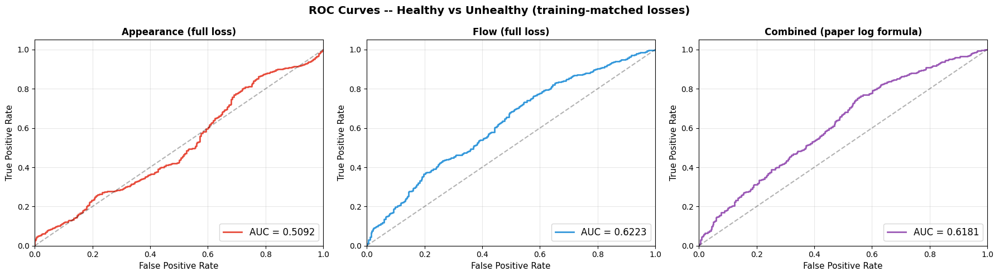


  AUC-ROC by Dataset (generalization)


,All,ACDC,MM
Appearance (full loss),0.5092,0.5595,0.5190
Flow (full loss),0.6223,0.8226,0.5847
Combined (paper log formula),0.6181,0.8242,0.5848


,NOR,unhealthy
All,339,1190
ACDC,58,258
MM,281,932


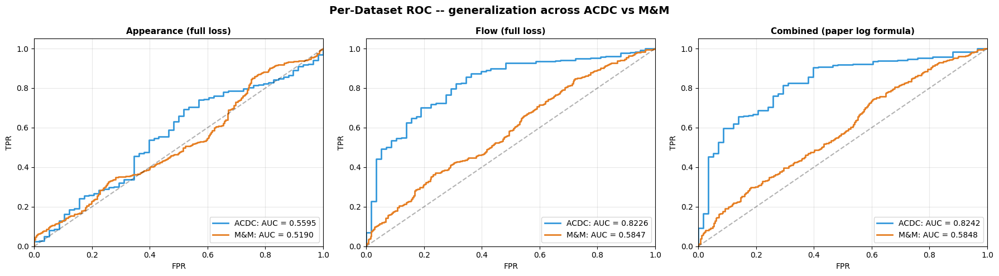


  AUC per Disease (each vs NOR) -- overall and per dataset
  Per-disease AUC -- Appearance (full loss)


,All,ACDC,MM
AHS,0.3392,NaN,0.2602
ARV,0.5573,NaN,0.4978
DCM,0.4715,0.6382,0.4393
HCM,0.6692,0.7003,0.7093
HHD,0.4556,NaN,0.3836
IHD,0.7462,NaN,0.6945
LVNC,0.8356,NaN,0.8017
MINF,0.2903,0.6019,NaN
Other,0.5290,NaN,0.4706
RV,0.1907,0.3992,NaN


  Per-disease AUC -- Flow (full loss)


,All,ACDC,MM
AHS,0.6947,NaN,0.6570
ARV,0.6266,NaN,0.6021
DCM,0.6184,0.8098,0.5859
HCM,0.6642,0.8006,0.6387
HHD,0.5644,NaN,0.5389
IHD,0.6791,NaN,0.6590
LVNC,0.5373,NaN,0.5146
MINF,0.6300,0.8129,NaN
Other,0.5596,NaN,0.5337
RV,0.6948,0.8499,NaN


  Per-disease AUC -- Combined (paper log formula)


,All,ACDC,MM
AHS,0.6556,NaN,0.6068
ARV,0.6280,NaN,0.5957
DCM,0.6099,0.8178,0.5750
HCM,0.6835,0.8147,0.6654
HHD,0.5536,NaN,0.5196
IHD,0.7033,NaN,0.6769
LVNC,0.5959,NaN,0.5680
MINF,0.5881,0.8282,NaN
Other,0.5637,NaN,0.5282
RV,0.6297,0.8318,NaN


In [22]:
# Re-run the SAME notebook pipeline on the full val+test pool of each dataset
# in DATASETS. Reuses run_tf_inference, compute_metrics, run_auc_evaluation
# and the SAME mu_appe / mu_aux from mu_baseline_{MODEL_EPOCH}.json.
from collections import Counter
import importlib
import numpy as np

# Pull training-NOR mu from training_saver/<MODEL_DATASET>/mu_baseline_<EPOCH>.json.
# Loads from JSON if cached; recomputes (and caches) otherwise.
mu_appe, mu_aux = get_mu_baseline(
    model_dataset = MODEL_DATASET,
    model_epoch   = MODEL_EPOCH,
    model_type    = MODEL_TYPE,
    frame_mode    = FRAME_MODE,
    datasets      = DATASETS,
    acdc_dir      = acdc_dir,
    mm_dir        = mm_training_dir,   # training NOR lives in the Training split
    mm_csv        = mm_csv_path,
    target_size   = TARGET_SIZE,
    max_samples   = None,              # set to e.g. 500 to subsample for speed
)

if not any(d in DATASETS for d in ('ACDC', 'MM')):
    raise ValueError("DATASETS must contain at least one of 'ACDC', 'MM'")

_dl_comb = importlib.import_module('data_loader_rgb' if MODEL_TYPE == 'rgb' else 'data_loader')
# es_ed reuses the ed_es loaders but flips the model-input phase to ED (mirrors run_model.py:192).
_dl_comb.set_edes_direction('ed' if FRAME_MODE == 'es_ed' else 'es')

_comb_p1_parts, _comb_p2_parts = [], []
_comb_labels, _comb_pids, _comb_source, _comb_slcs = [], [], [], []
_per_ds_breakdown = {}

# -- ACDC val + ACDC test ----------------------------------------------------
if 'ACDC' in DATASETS:
    if FRAME_MODE in ('ed_es', 'es_ed'):
        _acdc_loader = _dl_comb.load_acdc_test_val_ed_es_data
        _acdc_kwargs = {}
    elif FRAME_MODE in ('next_frame', 'next_frame_systole'):
        _acdc_loader = _dl_comb.load_acdc_test_val_data
        _acdc_kwargs = {'restrict_to_systole': FRAME_MODE == 'next_frame_systole'}
    else:
        raise ValueError(f"Unknown FRAME_MODE={FRAME_MODE!r}")
    # returns 10 values:
    #   (val_p1, val_p2, val_labels, val_pids, val_sids,
    #    test_p1, test_p2, test_labels, test_pids, test_sids)
    (_v_p1, _v_p2, _v_lbls, _v_pids, _v_sids,
     _t_p1, _t_p2, _t_lbls, _t_pids, _t_sids) = _acdc_loader(acdc_dir, **_acdc_kwargs)

    _comb_p1_parts.append(np.concatenate([_v_p1, _t_p1], axis=0))
    _comb_p2_parts.append(np.concatenate([_v_p2, _t_p2], axis=0))
    _acdc_labels = list(_v_lbls) + list(_t_lbls)
    _acdc_pids   = list(_v_pids) + list(_t_pids)
    _acdc_slcs   = list(_v_sids) + list(_t_sids)
    _comb_labels += _acdc_labels
    _comb_pids   += _acdc_pids
    _comb_source += ['ACDC'] * len(_acdc_labels)
    _comb_slcs   += _acdc_slcs
    _per_ds_breakdown['ACDC'] = (len(_acdc_labels), len(set(_v_pids)), len(set(_t_pids)))

# -- M&M val + M&M test ------------------------------------------------------
if 'MM' in DATASETS:
    if FRAME_MODE in ('ed_es', 'es_ed'):
        _mv_p1, _mv_p2, _mv_lbls, _mv_pids, _mv_sids = _dl_comb.load_mm_validation_ed_es_data(
            mm_val_dir, mm_csv_path, TARGET_SIZE)
        _mt_p1, _mt_p2, _mt_lbls, _mt_pids, _mt_sids = _dl_comb.load_mm_testing_ed_es_data(
            mm_testing_dir, mm_csv_path, TARGET_SIZE)
    elif FRAME_MODE in ('next_frame', 'next_frame_systole'):
        # load_mm_validation_data accepts any folder (the 'validation' name is a misnomer);
        # restrict_to_systole=True matches the training-side next_frame_systole pipeline.
        _systole = (FRAME_MODE == 'next_frame_systole')
        _mv_p1, _mv_p2, _mv_lbls, _mv_pids, _mv_sids = _dl_comb.load_mm_validation_data(
            mm_val_dir,     mm_csv_path, TARGET_SIZE, restrict_to_systole=_systole)
        _mt_p1, _mt_p2, _mt_lbls, _mt_pids, _mt_sids = _dl_comb.load_mm_validation_data(
            mm_testing_dir, mm_csv_path, TARGET_SIZE, restrict_to_systole=_systole)
    else:
        raise ValueError(f"Unknown FRAME_MODE={FRAME_MODE!r}")

    _comb_p1_parts.append(np.concatenate([_mv_p1, _mt_p1], axis=0))
    _comb_p2_parts.append(np.concatenate([_mv_p2, _mt_p2], axis=0))
    _mm_labels = list(_mv_lbls) + list(_mt_lbls)
    _mm_pids   = list(_mv_pids) + list(_mt_pids)
    _mm_slcs   = list(_mv_sids) + list(_mt_sids)
    _comb_labels += _mm_labels
    _comb_pids   += _mm_pids
    _comb_source += ['MM'] * len(_mm_labels)
    _comb_slcs   += _mm_slcs
    _per_ds_breakdown['MM'] = (len(_mm_labels), len(set(_mv_pids)), len(set(_mt_pids)))

_comb_p1 = np.concatenate(_comb_p1_parts, axis=0)
_comb_p2 = np.concatenate(_comb_p2_parts, axis=0)

print(f'Combined val+test: {len(_comb_p1)} frame pairs  /  {len(set(_comb_pids))} patients')
for _ds, (_n, _nv, _nt) in _per_ds_breakdown.items():
    print(f'  {_ds}: {_n} pairs  (val={_nv} patients, test={_nt} patients)')
print(f'  Class counts:  {dict(Counter(_comb_labels))}')
print(f'  Source counts: {dict(Counter(_comb_source))}')

# Same checkpoint, same TF inference path
_comb_model = GAN_tf if MODEL_TYPE == 'flow' else GAN_tf_rgb
_comb_ckpt  = f'./training_saver/{MODEL_DATASET}/model_ckpt_{MODEL_EPOCH}.ckpt'
_comb_recon_imgs, _comb_recon_aux = run_tf_inference(
    _comb_p1, _comb_model, _comb_ckpt, rescale_aux=(MODEL_TYPE == 'rgb'),
)

# Same metrics function, same training mu. Pass the real per-sample source list
# so run_auc_evaluation can break out per-dataset AUC rows when both are present.
comb_df = compute_metrics(
    _comb_p1, _comb_p2, _comb_recon_imgs, _comb_recon_aux,
    _comb_labels, _comb_pids, _comb_source, MODEL_TYPE,
    slice_ids=_comb_slcs,
    mu_appe=mu_appe, mu_aux=mu_aux,
)

# Per-frame-pair AUC over the combined val+test split.
_ = run_auc_evaluation(comb_df, model_type=MODEL_TYPE, frame_mode=FRAME_MODE)

# restore default ED/ES direction so later ed_es cells aren't left with a stale 'ed'.
_dl_comb.set_edes_direction('es')

## Patient-Level AUC — Top-20% Frame Average (Test + Validation)

Same inputs as the section above (`loss_appe_full`, `loss_aux_full`, `combined_paper`),
but each patient's per-frame scores are reduced to a single per-patient score via the
**top-20% mean** (mean of the highest `ceil(0.2·n)` frame scores), mirroring the
`FrameTop20` aggregator in the W&B validation logging.

Reports the same breakdowns at the **patient** level: overall and per dataset
(All / ACDC / M&M) and per disease (each vs NOR), with ROC curves.
In `ed_es` mode there is one frame per slice, so this equals the slice-level value; in
`next_frame` / `next_frame_systole` it is a frame-level aggregation (see the slice-level
section below).

Patients: 217  (50 NOR / 167 unhealthy)

Patient-level AUC by dataset (top-20% frame average)


,All,ACDC,MM
Appearance,0.4917,0.5200,0.5008
ED Pred,0.5856,0.8500,0.5827
Combined,0.5666,0.8225,0.5628


,NOR,unhealthy
All,50,167
ACDC,10,40
MM,40,127



Patient-level AUC per disease (each vs NOR) -- overall and per dataset
  Per-disease patient AUC -- Appearance


,All,ACDC,MM
AHS,0.3400,NaN,0.2250
ARV,0.5486,NaN,0.4679
DCM,0.4351,0.53,0.4035
HCM,0.6538,0.74,0.7008
HHD,0.4686,NaN,0.3732
IHD,0.7267,NaN,0.6583
LVNC,0.8200,NaN,0.7750
MINF,0.2480,0.56,NaN
Other,0.5328,NaN,0.4630
RV,0.1240,0.25,NaN


  Per-disease patient AUC -- ED Pred


,All,ACDC,MM
AHS,0.4800,NaN,0.3500
ARV,0.6200,NaN,0.5357
DCM,0.5445,0.90,0.5105
HCM,0.6971,0.96,0.7328
HHD,0.5757,NaN,0.4911
IHD,0.8533,NaN,0.8167
LVNC,0.8700,NaN,0.8375
MINF,0.3460,0.83,NaN
Other,0.6176,NaN,0.5400
RV,0.3580,0.71,NaN


  Per-disease patient AUC -- Combined


,All,ACDC,MM
AHS,0.4600,NaN,0.3250
ARV,0.6000,NaN,0.5107
DCM,0.5211,0.88,0.4802
HCM,0.6881,0.95,0.7250
HHD,0.5529,NaN,0.4661
IHD,0.8333,NaN,0.7917
LVNC,0.8800,NaN,0.8500
MINF,0.3200,0.80,NaN
Other,0.6056,NaN,0.5250
RV,0.3100,0.66,NaN


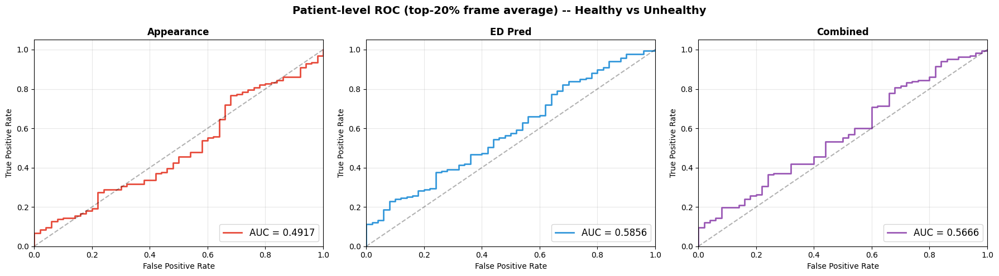

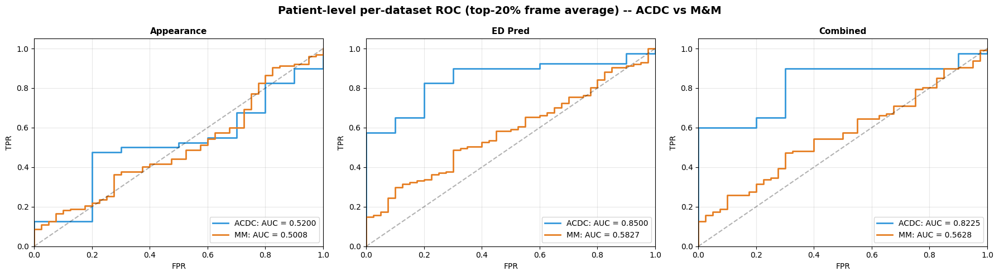

In [28]:
# ── Patient-level AUC: top-20% frame average ────────────────────────────────
# Same loss columns / combined formula as the section above; only the
# slice -> patient reduction changes. In ed_es mode there is one sample per
# (patient, slice), so the per-sample top-20% IS the top-20% frame average.

def _top20_mean(arr):
    arr = np.asarray(arr)
    n = len(arr)
    if n == 0:
        return np.nan
    k = max(1, int(np.ceil(0.2 * n)))
    return float(np.mean(np.sort(arr)[-k:]))

if MODEL_TYPE == 'flow':
    _aux_label = 'Flow'
else:
    _aux_label = 'Next Frame' if FRAME_MODE == 'next_frame' else 'ED Pred'

_chan_cols = {'Appearance': 'loss_appe_full',
              _aux_label:   'loss_aux_full',
              'Combined':   'combined_paper'}

# one row per patient: top-20% aggregate of each channel + carried metadata.
# group on (source, pid) so a shared pid string across datasets can't merge patients.
_prows = []
for (_src_v, _pid), _g in comb_df.groupby(['source', 'pid']):
    _row = {'pid': _pid, 'source': _src_v,
            'label': _g['label'].iloc[0],
            'binary_label': int(_g['binary_label'].iloc[0])}
    for _name, _col in _chan_cols.items():
        _row[_name] = _top20_mean(_g[_col].values)
    _prows.append(_row)
patient_df = pd.DataFrame(_prows)
print(f'Patients: {len(patient_df)}  '
      f'({int((patient_df.binary_label == 0).sum())} NOR / '
      f'{int((patient_df.binary_label == 1).sum())} unhealthy)')

_pat_scores = {c: patient_df[c].values for c in _chan_cols}

print('\nPatient-level AUC by dataset (top-20% frame average)')
display(auc_overall_by_dataset(patient_df, _pat_scores))
display(counts_by_dataset(patient_df))

print('\nPatient-level AUC per disease (each vs NOR) -- overall and per dataset')
for _name in _chan_cols:
    print(f'  Per-disease patient AUC -- {_name}')
    display(auc_disease_by_dataset(patient_df, patient_df[_name].values))

# ── ROC curves (overall) ────────────────────────────────────────────────────
_y = patient_df['binary_label'].values
fig, axes = plt.subplots(1, len(_pat_scores), figsize=(6 * len(_pat_scores), 5))
axes = np.atleast_1d(axes)
_colors = ['#e74c3c', '#3498db', '#9b59b6']
for ax, (_name, _s), _color in zip(axes, _pat_scores.items(), _colors):
    if len(np.unique(_y)) < 2:
        continue
    fpr, tpr, _ = roc_curve(_y, _s)
    ax.plot(fpr, tpr, color=_color, lw=2, label=f'AUC = {roc_auc_score(_y, _s):.4f}')
    ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
    ax.set_xlabel('False Positive Rate'); ax.set_ylabel('True Positive Rate')
    ax.set_title(_name, fontsize=12, fontweight='bold')
    ax.legend(loc='lower right', fontsize=12); ax.grid(alpha=0.3)
    ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
plt.suptitle('Patient-level ROC (top-20% frame average) -- Healthy vs Unhealthy',
             fontweight='bold', fontsize=14)
plt.tight_layout(); plt.show()

# ── ROC curves (per dataset) ────────────────────────────────────────────────
_src = patient_df['source'].values
_present = [s for s in ['ACDC', 'MM'] if (_src == s).any()]
if len(_present) >= 2:
    _ds_colors = {'ACDC': '#3498db', 'MM': '#e67e22'}
    fig, axes = plt.subplots(1, len(_pat_scores), figsize=(6 * len(_pat_scores), 5))
    axes = np.atleast_1d(axes)
    for ax, (_name, _s) in zip(axes, _pat_scores.items()):
        for _srcv in _present:
            _m = (_src == _srcv)
            if len(np.unique(_y[_m])) < 2:
                continue
            fpr, tpr, _ = roc_curve(_y[_m], _s[_m])
            ax.plot(fpr, tpr, color=_ds_colors[_srcv], lw=2,
                    label=f'{_srcv}: AUC = {roc_auc_score(_y[_m], _s[_m]):.4f}')
        ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
        ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
        ax.set_title(_name, fontsize=11, fontweight='bold')
        ax.legend(loc='lower right', fontsize=10); ax.grid(alpha=0.3)
        ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
    plt.suptitle('Patient-level per-dataset ROC (top-20% frame average) -- ACDC vs M&M',
                 fontweight='bold', fontsize=14)
    plt.tight_layout(); plt.show()

## Patient-Level AUC — Top-20% Slice Average (Test + Validation)

True slice-level aggregation: for each patient, the frames within a slice are **averaged**
to give one score per slice, then the **top-20%** of those slice scores is taken
(`SliceTop20` in the W&B validation logging). Same inputs and combined formula as the
frame-level section above; only the slice → patient reduction differs.

Requires `comb_df` to carry a `slice_idx` column (added in the Test + Validation assembly
cell). In `ed_es` mode this is identical to the frame-level section; in
`next_frame` / `next_frame_systole` it differs (multiple frames per slice).

Patients: 217  (50 NOR / 167 unhealthy)

Patient-level AUC by dataset (top-20% slice average)


,All,ACDC,MM
Appearance,0.4917,0.5200,0.5008
ED Pred,0.5856,0.8500,0.5827
Combined,0.5666,0.8225,0.5628


,NOR,unhealthy
All,50,167
ACDC,10,40
MM,40,127



Patient-level AUC per disease (each vs NOR) -- overall and per dataset
  Per-disease patient AUC -- Appearance


,All,ACDC,MM
AHS,0.3400,NaN,0.2250
ARV,0.5486,NaN,0.4679
DCM,0.4351,0.53,0.4035
HCM,0.6538,0.74,0.7008
HHD,0.4686,NaN,0.3732
IHD,0.7267,NaN,0.6583
LVNC,0.8200,NaN,0.7750
MINF,0.2480,0.56,NaN
Other,0.5328,NaN,0.4630
RV,0.1240,0.25,NaN


  Per-disease patient AUC -- ED Pred


,All,ACDC,MM
AHS,0.4800,NaN,0.3500
ARV,0.6200,NaN,0.5357
DCM,0.5445,0.90,0.5105
HCM,0.6971,0.96,0.7328
HHD,0.5757,NaN,0.4911
IHD,0.8533,NaN,0.8167
LVNC,0.8700,NaN,0.8375
MINF,0.3460,0.83,NaN
Other,0.6176,NaN,0.5400
RV,0.3580,0.71,NaN


  Per-disease patient AUC -- Combined


,All,ACDC,MM
AHS,0.4600,NaN,0.3250
ARV,0.6000,NaN,0.5107
DCM,0.5211,0.88,0.4802
HCM,0.6881,0.95,0.7250
HHD,0.5529,NaN,0.4661
IHD,0.8333,NaN,0.7917
LVNC,0.8800,NaN,0.8500
MINF,0.3200,0.80,NaN
Other,0.6056,NaN,0.5250
RV,0.3100,0.66,NaN


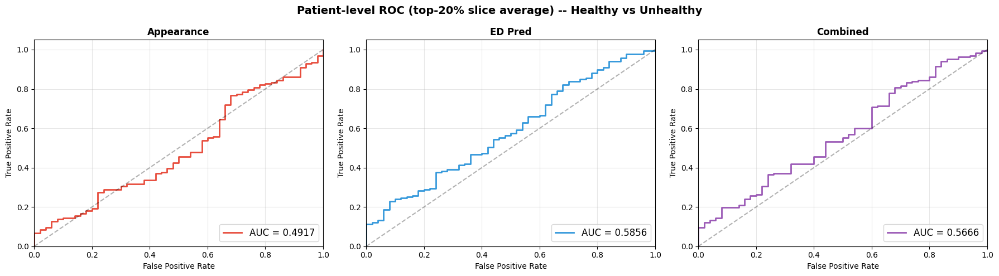

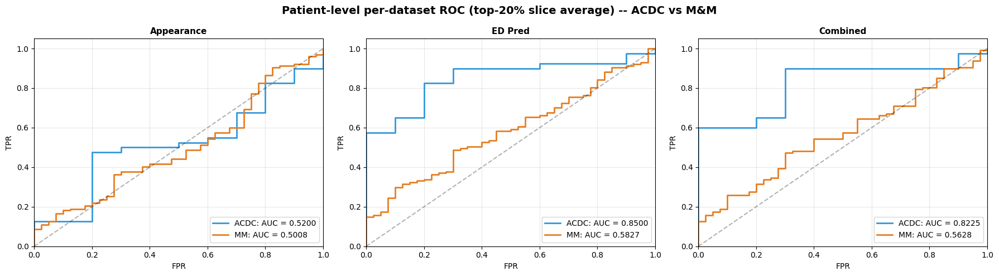

In [29]:
# ── Patient-level AUC: top-20% SLICE average (frame -> per-slice mean -> top-20% of slices) ──
# Requires comb_df to carry slice_idx (added in the Test+Validation assembly cell).
# Mirrors the SliceTop20 aggregator in GAN_tf.py validation.
assert 'slice_idx' in comb_df.columns, \
    "comb_df has no 'slice_idx' column -- re-run the Test+Validation assembly cell after the slice_idx update."

def _top20_mean(arr):
    arr = np.asarray(arr)
    n = len(arr)
    if n == 0:
        return np.nan
    k = max(1, int(np.ceil(0.2 * n)))
    return float(np.mean(np.sort(arr)[-k:]))

if MODEL_TYPE == 'flow':
    _aux_label = 'Flow'
else:
    _aux_label = 'Next Frame' if FRAME_MODE == 'next_frame' else 'ED Pred'

_chan_cols = {'Appearance': 'loss_appe_full',
              _aux_label:   'loss_aux_full',
              'Combined':   'combined_paper'}

# one row per patient: average frames within each slice, then top-20% of the slice means.
# group on (source, pid) so a shared pid string across datasets can't merge patients.
_prows = []
for (_src_v, _pid), _g in comb_df.groupby(['source', 'pid']):
    _row = {'pid': _pid, 'source': _src_v,
            'label': _g['label'].iloc[0],
            'binary_label': int(_g['binary_label'].iloc[0])}
    for _name, _col in _chan_cols.items():
        _slice_means = _g.groupby('slice_idx')[_col].mean().values
        _row[_name] = _top20_mean(_slice_means)
    _prows.append(_row)
patient_slice_df = pd.DataFrame(_prows)
print(f'Patients: {len(patient_slice_df)}  '
      f'({int((patient_slice_df.binary_label == 0).sum())} NOR / '
      f'{int((patient_slice_df.binary_label == 1).sum())} unhealthy)')

_pat_scores = {c: patient_slice_df[c].values for c in _chan_cols}

print('\nPatient-level AUC by dataset (top-20% slice average)')
display(auc_overall_by_dataset(patient_slice_df, _pat_scores))
display(counts_by_dataset(patient_slice_df))

print('\nPatient-level AUC per disease (each vs NOR) -- overall and per dataset')
for _name in _chan_cols:
    print(f'  Per-disease patient AUC -- {_name}')
    display(auc_disease_by_dataset(patient_slice_df, patient_slice_df[_name].values))

# ── ROC curves (overall) ────────────────────────────────────────────────────
_y = patient_slice_df['binary_label'].values
fig, axes = plt.subplots(1, len(_pat_scores), figsize=(6 * len(_pat_scores), 5))
axes = np.atleast_1d(axes)
_colors = ['#e74c3c', '#3498db', '#9b59b6']
for ax, (_name, _s), _color in zip(axes, _pat_scores.items(), _colors):
    if len(np.unique(_y)) < 2:
        continue
    fpr, tpr, _ = roc_curve(_y, _s)
    ax.plot(fpr, tpr, color=_color, lw=2, label=f'AUC = {roc_auc_score(_y, _s):.4f}')
    ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
    ax.set_xlabel('False Positive Rate'); ax.set_ylabel('True Positive Rate')
    ax.set_title(_name, fontsize=12, fontweight='bold')
    ax.legend(loc='lower right', fontsize=12); ax.grid(alpha=0.3)
    ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
plt.suptitle('Patient-level ROC (top-20% slice average) -- Healthy vs Unhealthy',
             fontweight='bold', fontsize=14)
plt.tight_layout(); plt.show()

# ── ROC curves (per dataset) ────────────────────────────────────────────────
_src = patient_slice_df['source'].values
_present = [s for s in ['ACDC', 'MM'] if (_src == s).any()]
if len(_present) >= 2:
    _ds_colors = {'ACDC': '#3498db', 'MM': '#e67e22'}
    fig, axes = plt.subplots(1, len(_pat_scores), figsize=(6 * len(_pat_scores), 5))
    axes = np.atleast_1d(axes)
    for ax, (_name, _s) in zip(axes, _pat_scores.items()):
        for _srcv in _present:
            _m = (_src == _srcv)
            if len(np.unique(_y[_m])) < 2:
                continue
            fpr, tpr, _ = roc_curve(_y[_m], _s[_m])
            ax.plot(fpr, tpr, color=_ds_colors[_srcv], lw=2,
                    label=f'{_srcv}: AUC = {roc_auc_score(_y[_m], _s[_m]):.4f}')
        ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
        ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
        ax.set_title(_name, fontsize=11, fontweight='bold')
        ax.legend(loc='lower right', fontsize=10); ax.grid(alpha=0.3)
        ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
    plt.suptitle('Patient-level per-dataset ROC (top-20% slice average) -- ACDC vs M&M',
                 fontweight='bold', fontsize=14)
    plt.tight_layout(); plt.show()

## 2×2 Model Comparison — Patient-Level AUC (tables)

Scores the **four trained models** — the 2×2 of `frame_mode` ∈ {`ed_es`, `next_frame_systole`} × `model_type` ∈ {`flow`, `rgb`} — on the **same combined val+test pool** (`EVAL_DATASETS`), and reports patient-level AUC as tables (no plots).

**Partial scores (paper, `utils.py:201`)** — `stat_MSE = mean(squared_error)` over all pixels, i.e. eq. (7) with the patch = the whole frame. These already live per-sample in `comb_df`:
- `S_I` = appearance MSE = `mse_appe`
- `S_F` = auxiliary MSE = `mse_aux`  (optical-flow error for `flow` models, ED-frame error for `rgb` models)

**Combined (paper log-formula, `utils.py:339`) with a weight sweep** — for appearance weight `w`:

```
combined_w = log(S_F / mu_F) + w · log(S_I / mu_I)
```

swept over `w = 0.0 … 1.0` (step 0.1). The paper's full-frame weighting (appe:aux = 1:2) is **equivalent to `w = 0.5`** for AUC, so one sweep yields both the **best** weight and the **paper** weight (`w = 0.2`, the patch eq. (8) weighting used by `combined_paper`, is also flagged).

`mu_I`, `mu_F` = **NOR mean** of `S_I`, `S_F` over the eval pool (self-contained; mildly optimistic — affects only the Combined channel, not the scale-invariant per-channel AUCs).

**Patient aggregation** — per-sample score → average frames within each slice (one score per slice) → patient score via **Mean / Max / Top-20%** of slice means → AUC across patients. This generalises the Top-20%-only cell above to all three slice aggregators.

> Assumes all four models share this notebook's current preprocessing (the *Evaluation configuration* cell: orientation/spacing, `TARGET_SIZE`). Edit `MODELS_2x2` below with each model's `training_saver` folder + epoch, then run the scoring cell (≈4× inference, slow); the tables cell re-runs instantly from the cached results.

In [7]:
# =============================================================================
# 2x2 model comparison -- per-model scoring on the combined val+test pool.
# Edit MODELS_2x2 with the four training_saver folders + epochs, then run.
# HEAVY: runs TF inference once per model. The tables cell below only reads the
# cached comb_dfs, so you can re-tabulate without re-running inference.
#
# Robust to in-progress training:
#   * a model whose checkpoint file is missing is SKIPPED (with a note), not an error
#     -- so you can leave all four listed while one is still training.
#   * by default, models already in comb_dfs are reused (incremental): when the last
#     model finishes you only score that one. Set RESCORE_ALL = True to force a clean
#     re-score of every listed model (also do this after changing a model's
#     folder/epoch under an unchanged label, or just restart the kernel).
# =============================================================================
import os
import importlib
from collections import Counter
import numpy as np

RESCORE_ALL = False   # True -> ignore the cache and re-run inference for every model

# -- The four models (the 2x2). Per model: folder under training_saver/, epoch,
#    model_type ('flow'|'rgb'),
#    frame_mode ('ed_es'|'es_ed'|'next_frame'|'next_frame_systole'). -------------
MODELS_2x2 = [
    {'label': 'ES/ED + Flow',        'frame_mode': 'es_ed',
     'model_type': 'flow', 'model_dataset': 'ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added',              'model_epoch': 50},
    {'label': 'ES/ED + RGB',         'frame_mode': 'es_ed',
     'model_type': 'rgb',  'model_dataset': 'ACDC_MM_RECON_ES_ED_RGB_NOR_v2_orient_spacing_added',               'model_epoch': 50},
    {'label': 'NextFrameSys + Flow', 'frame_mode': 'next_frame_systole',
     'model_type': 'flow', 'model_dataset': 'ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_FLOW_NOR_v2_added', 'model_epoch': 50},
    {'label': 'NextFrameSys + RGB',  'frame_mode': 'next_frame_systole',
     'model_type': 'rgb',  'model_dataset': 'ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_RGB_NOR_v2_orient_spacing_added',  'model_epoch': 50},
]
EVAL_DATASETS = ('ACDC', 'MM')   # same eval pool for all four models


def score_model_valtest(model_type, frame_mode, model_dataset, model_epoch,
                        datasets=('ACDC', 'MM')):
    """Score one checkpoint on the ACDC+M&M val+test pool -> per-sample comb_df.

    Mirrors the 'Test + Validation Combined Evaluation' cell, parametrised per
    model. Reuses run_tf_inference / compute_metrics and the same loaders. mu is
    left as None (compute_metrics' own fallback) because this section recomputes
    its own NOR-mean normalisers downstream. Local vars only -- do
    es NOT touch
    the notebook globals MODEL_TYPE / FRAME_MODE / comb_df.
    """
    if not any(d in datasets for d in ('ACDC', 'MM')):
        raise ValueError("datasets must contain at least one of 'ACDC', 'MM'")

    dl = importlib.import_module('data_loader_rgb' if model_type == 'rgb' else 'data_loader')

    _known = ('ed_es', 'es_ed', 'next_frame', 'next_frame_systole')
    if frame_mode not in _known:
        raise ValueError("frame_mode %r not in %r" % (frame_mode, _known))
    # es_ed reuses the ed_es loaders but flips the input phase to ED (predict ES),
    # exactly as run_model.py does; 'es' is the default for every other mode.
    dl.set_edes_direction('ed' if frame_mode == 'es_ed' else 'es')

    p1_parts, p2_parts = [], []
    labels, pids, source, slcs = [], [], [], []

    # -- ACDC val + test --------------------------------------------------------
    if 'ACDC' in datasets:
        if frame_mode in ('ed_es', 'es_ed'):
            (v_p1, v_p2, v_l, v_pid, v_s,
             t_p1, t_p2, t_l, t_pid, t_s) = dl.load_acdc_test_val_ed_es_data(acdc_dir)
        else:
            (v_p1, v_p2, v_l, v_pid, v_s,
             t_p1, t_p2, t_l, t_pid, t_s) = dl.load_acdc_test_val_data(
                acdc_dir, restrict_to_systole=(frame_mode == 'next_frame_systole'))
        p1_parts.append(np.concatenate([v_p1, t_p1], axis=0))
        p2_parts.append(np.concatenate([v_p2, t_p2], axis=0))
        labels += list(v_l) + list(t_l)
        pids   += list(v_pid) + list(t_pid)
        slcs   += list(v_s) + list(t_s)
        source += ['ACDC'] * (len(v_l) + len(t_l))

    # -- M&M val + test ---------------------------------------------------------
    if 'MM' in datasets:
        if frame_mode in ('ed_es', 'es_ed'):
            mv = dl.load_mm_validation_ed_es_data(mm_val_dir, mm_csv_path, TARGET_SIZE)
            mt = dl.load_mm_testing_ed_es_data(mm_testing_dir, mm_csv_path, TARGET_SIZE)
        else:
            sys_ = (frame_mode == 'next_frame_systole')
            mv = dl.load_mm_validation_data(mm_val_dir, mm_csv_path, TARGET_SIZE, restrict_to_systole=sys_)
            mt = dl.load_mm_validation_data(mm_testing_dir, mm_csv_path, TARGET_SIZE, restrict_to_systole=sys_)
        (mv_p1, mv_p2, mv_l, mv_pid, mv_s) = mv
        (mt_p1, mt_p2, mt_l, mt_pid, mt_s) = mt
        p1_parts.append(np.concatenate([mv_p1, mt_p1], axis=0))
        p2_parts.append(np.concatenate([mv_p2, mt_p2], axis=0))
        labels += list(mv_l) + list(mt_l)
        pids   += list(mv_pid) + list(mt_pid)
        slcs   += list(mv_s) + list(mt_s)
        source += ['MM'] * (len(mv_l) + len(mt_l))

    p1 = np.concatenate(p1_parts, axis=0)
    p2 = np.concatenate(p2_parts, axis=0)

    model_module = GAN_tf if model_type == 'flow' else GAN_tf_rgb
    ckpt = './training_saver/%s/model_ckpt_%d.ckpt' % (model_dataset, model_epoch)
    recon_imgs, recon_aux = run_tf_inference(
        p1, model_module, ckpt, rescale_aux=(model_type == 'rgb'))

    df = compute_metrics(
        p1, p2, recon_imgs, recon_aux, labels, pids, source, model_type,
        slice_ids=slcs)
    return df


# Keep results across re-runs (so a finished model can be added without
# re-scoring the others) unless RESCORE_ALL is set.
if RESCORE_ALL:
    comb_dfs = {}
else:
    try:
        comb_dfs
    except NameError:
        comb_dfs = {}

_skipped = []
for _cfg in MODELS_2x2:
    _label = _cfg['label']
    if _label in comb_dfs:
        print("reuse cached: %s   (set RESCORE_ALL=True to re-score)" % _label)
        continue
    _ckpt = './training_saver/%s/model_ckpt_%d.ckpt' % (_cfg['model_dataset'], _cfg['model_epoch'])
    if not os.path.exists(_ckpt + '.index'):
        print("SKIP -- checkpoint not found: %s" % _label)
        print("        looked for %s.index  (still training?)" % _ckpt)
        _skipped.append(_label)
        continue
    print('=' * 78)
    print("Scoring: %s   [%s / %s / %s @ %d]" % (
        _label, _cfg['model_type'], _cfg['frame_mode'],
        _cfg['model_dataset'], _cfg['model_epoch']))
    print('=' * 78)
    _df = score_model_valtest(
        _cfg['model_type'], _cfg['frame_mode'],
        _cfg['model_dataset'], _cfg['model_epoch'], datasets=EVAL_DATASETS)
    _df['model_label'] = _label
    _df['frame_mode']  = _cfg['frame_mode']
    _df['model_type']  = _cfg['model_type']
    comb_dfs[_label] = _df
    _npat = _df.groupby(['source', 'pid']).ngroups
    print("  -> %d samples / %d patients   classes=%s" % (
        len(_df), _npat, dict(Counter(_df['label']))))

print('\nScored / cached: %s' % list(comb_dfs))
if _skipped:
    print('Skipped (no checkpoint yet): %s' % _skipped)
print('Run the tables cell below on whatever is present.')

# Leave the ED/ES direction flag at its default ('es') so the older single-model
# cells (which call the ed_es loaders without setting it) are not contaminated by
# a stale 'ed' from an es_ed model scored above.
importlib.import_module('data_loader').set_edes_direction('es')
importlib.import_module('data_loader_rgb').set_edes_direction('es')

Scoring: ES/ED + Flow   [flow / es_ed / ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added @ 50]
ACDC testing set composition:
  DCM: 10 patients
  HCM: 10 patients
  MINF: 10 patients
  NOR: 10 patients
  RV: 10 patients

Validation patients (12): ['patient102', 'patient111', 'patient116', 'patient117', 'patient123', 'patient129', 'patient133', 'patient135', 'patient139', 'patient143', 'patient144', 'patient147']
Test patients (38): ['patient101', 'patient103', 'patient104', 'patient105', 'patient106', 'patient107', 'patient108', 'patient109', 'patient110', 'patient112', 'patient113', 'patient114', 'patient115', 'patient118', 'patient119', 'patient120', 'patient121', 'patient122', 'patient124', 'patient125', 'patient126', 'patient127', 'patient128', 'patient130', 'patient131', 'patient132', 'patient134', 'patient136', 'patient137', 'patient138', 'patient140', 'patient141', 'patient142', 'patient145', 'patient146', 'patient148', 'patient149', 'patient150']
  patient101 (DCM)  ED=0  E

c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf.py:165: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  d = tf.layers.batch_normalization(d, training=training)




Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf.py:173: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  u = tf.layers.batch_normalization(u, training=training)



INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
Model loaded from ./training_saver/ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
  Batch 20/96 done
  Batch 40/96 done
  Batch 60/96 done
  Batch 80/96 done
  Batch 96/96 done
Inference complete.
  mu_appe = 0.1034  [test-NOR (fallback)]
  mu_aux  = 0.8913  [test-NOR (fallback)]
  -> 1529 samples / 217 patients   classes={'NOR': 339, 'HCM': 279, 'DCM': 373, 'RV': 91, 'MINF': 54, 'HHD': 98, 'Other': 199, 'AHS': 8, 'ARV': 49, 'LVNC': 15, 'IHD': 24}
Scoring: ES/ED + RGB   [rgb / es_ed / ACDC_MM_RECON_ES_ED_RGB_NOR_v2_orient_spacing_added @ 50]
Error processing C8J7L5: Exception thrown in SimpleITK ImageFileReader_Execute: D:\a\SimpleITK\SimpleITK\bld\ITK\Modules\IO\NIFTI\src\itkNiftiImageIO.cxx:2135:
ITK ERROR: ITK only supports orthonormal direction cosines.  No orthonormal definition found!
Error processing C8O0P2: Exception thrown

c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf_rgb.py:165: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  d = tf.layers.batch_normalization(d, training=training)
c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf_rgb.py:173: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  u = tf.layers.batch_normalization(u, training=training)


INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_ES_ED_RGB_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
Model loaded from ./training_saver/ACDC_MM_RECON_ES_ED_RGB_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
  Batch 20/96 done
  Batch 40/96 done
  Batch 60/96 done
  Batch 80/96 done
  Batch 96/96 done
Inference complete.
  mu_appe = 0.0898  [test-NOR (fallback)]
  mu_aux  = 0.1271  [test-NOR (fallback)]
  -> 1529 samples / 217 patients   classes={'NOR': 339, 'HCM': 279, 'DCM': 373, 'RV': 91, 'MINF': 54, 'HHD': 98, 'Other': 199, 'AHS': 8, 'ARV': 49, 'LVNC': 15, 'IHD': 24}
Scoring: NextFrameSys + Flow   [flow / next_frame_systole / ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_FLOW_NOR_v2_added @ 50]
ACDC testing set composition:
  DCM: 10 patients -> ['patient101', 'patient106', 'patient113', 'patient117', 'patient122', 'patient131', 'patient132', 'patient133', 'patient136', 'patient149']
  HCM: 10 patients -> ['patient104', 'patient105', 'patient108', 'patient111', 'pati

c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf.py:165: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  d = tf.layers.batch_normalization(d, training=training)
c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf.py:173: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  u = tf.layers.batch_normalization(u, training=training)


INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_FLOW_NOR_v2_added/model_ckpt_50.ckpt
Model loaded from ./training_saver/ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_FLOW_NOR_v2_added/model_ckpt_50.ckpt
  Batch 20/910 done
  Batch 40/910 done
  Batch 60/910 done
  Batch 80/910 done
  Batch 100/910 done
  Batch 120/910 done
  Batch 140/910 done
  Batch 160/910 done
  Batch 180/910 done
  Batch 200/910 done
  Batch 220/910 done
  Batch 240/910 done
  Batch 260/910 done
  Batch 280/910 done
  Batch 300/910 done
  Batch 320/910 done
  Batch 340/910 done
  Batch 360/910 done
  Batch 380/910 done
  Batch 400/910 done
  Batch 420/910 done
  Batch 440/910 done
  Batch 460/910 done
  Batch 480/910 done
  Batch 500/910 done
  Batch 520/910 done
  Batch 540/910 done
  Batch 560/910 done
  Batch 580/910 done
  Batch 600/910 done
  Batch 620/910 done
  Batch 640/910 done
  Batch 660/910 done
  Batch 680/910 done
  Batch 700/910 done
  Batch 720/910 done
  Batch 740/91

c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf_rgb.py:165: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  d = tf.layers.batch_normalization(d, training=training)
c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf_rgb.py:173: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  u = tf.layers.batch_normalization(u, training=training)


INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_RGB_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
Model loaded from ./training_saver/ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_RGB_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
  Batch 20/910 done
  Batch 40/910 done
  Batch 60/910 done
  Batch 80/910 done
  Batch 100/910 done
  Batch 120/910 done
  Batch 140/910 done
  Batch 160/910 done
  Batch 180/910 done
  Batch 200/910 done
  Batch 220/910 done
  Batch 240/910 done
  Batch 260/910 done
  Batch 280/910 done
  Batch 300/910 done
  Batch 320/910 done
  Batch 340/910 done
  Batch 360/910 done
  Batch 380/910 done
  Batch 400/910 done
  Batch 420/910 done
  Batch 440/910 done
  Batch 460/910 done
  Batch 480/910 done
  Batch 500/910 done
  Batch 520/910 done
  Batch 540/910 done
  Batch 560/910 done
  Batch 580/910 done
  Batch 600/910 done
  Batch 620/910 done
  Batch 640/910 done
  Batch 660/910 done
  Batch 680/910 done
  Batch 700/910 done
  Batch

In [8]:
# =============================================================================
# 2x2 comparison -- patient-level AUC tables (NO inference; uses comb_dfs).
#   per sample:  S_I = mse_appe (appearance),   S_F = mse_aux (flow / ED)
#   combined_w = log(S_F/muF) + w*log(S_I/muI)   (paper full-frame == w 0.5)
#   patient:     frame -> per-slice mean -> {Mean, Max, Top20%} over slice means
# =============================================================================
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
from IPython.display import display

_EPS = 1e-10
WEIGHTS = [round(w, 1) for w in np.arange(0.0, 1.0001, 0.1)]
PAPER_W = 0.5    # utils.py:339 full-frame (appe:aux = 1:2); same AUC ranking
PATCH_W = 0.2    # patch eq.(8) weighting used by combined_paper (annotation only)


def _top20_mean(arr):
    arr = np.asarray(arr)
    n = len(arr)
    if n == 0:
        return np.nan
    k = max(1, int(np.ceil(0.2 * n)))
    return float(np.mean(np.sort(arr)[-k:]))


PATIENT_AGGS = {'Mean':   lambda a: float(np.mean(a)),
                'Max':    lambda a: float(np.max(a)),
                'Top20%': _top20_mean}


def _auc(y, s):
    return roc_auc_score(y, s) if len(np.unique(y)) > 1 else np.nan


def _auc_by_agg(df, sample_score):
    """frame-level sample_score (aligned to df) -> {agg_name: patient-level AUC}.
    frame -> per-slice mean -> per-patient aggregate of slice means -> AUC."""
    g = df[['source', 'pid', 'slice_idx', 'binary_label']].copy()
    g['_s'] = np.asarray(sample_score)
    slice_means = g.groupby(['source', 'pid', 'slice_idx'])['_s'].mean().reset_index()
    lab = g.groupby(['source', 'pid'])['binary_label'].first().reset_index()
    out = {}
    for agg_name, fn in PATIENT_AGGS.items():
        pat = slice_means.groupby(['source', 'pid'])['_s'].apply(
            lambda a: fn(a.values)).reset_index()
        m = pat.merge(lab, on=['source', 'pid'])
        out[agg_name] = _auc(m['binary_label'].values, m['_s'].values)
    return out


per_model_tables = {}    # label -> patient-AUC DataFrame (rows: channel, cols: agg)
sweep_tables = {}        # label -> weight-sweep DataFrame (rows: w, cols: agg)
summary_rows = []

for label, df in comb_dfs.items():
    assert 'slice_idx' in df.columns, "comb_df missing slice_idx -- re-run scoring cell."
    mtype = df['model_type'].iloc[0]
    fmode = df['frame_mode'].iloc[0]
    if mtype == 'flow':
        aux_name = 'Flow'
    elif fmode == 'ed_es':
        aux_name = 'ED Pred'
    elif fmode == 'es_ed':
        aux_name = 'ES Pred'
    else:                       # next_frame / next_frame_systole
        aux_name = 'Next Frame'

    S_I = df['mse_appe'].values
    S_F = df['mse_aux'].values
    nor = (df['binary_label'].values == 0)
    muI = float(np.mean(S_I[nor])) if nor.any() else float(np.mean(S_I))
    muF = float(np.mean(S_F[nor])) if nor.any() else float(np.mean(S_F))
    logI = np.log(np.maximum(S_I, _EPS) / max(muI, _EPS))
    logF = np.log(np.maximum(S_F, _EPS) / max(muF, _EPS))

    appe_auc = _auc_by_agg(df, S_I)
    aux_auc = _auc_by_agg(df, S_F)

    sweep = {w: _auc_by_agg(df, logF + w * logI) for w in WEIGHTS}
    sweep_df = pd.DataFrame(sweep).T
    sweep_df.index.name = 'w (appe wt)'
    sweep_tables[label] = sweep_df.round(4)

    paper_auc = sweep[PAPER_W]
    best_w = {agg: float(sweep_df[agg].idxmax()) for agg in PATIENT_AGGS}
    best_auc = {agg: float(sweep_df[agg].max()) for agg in PATIENT_AGGS}

    tbl = pd.DataFrame({
        'Appearance':                    appe_auc,
        aux_name:                        aux_auc,
        'Combined (paper w=%.1f)' % PAPER_W: paper_auc,
        'Combined (best w)':             best_auc,
    }).T.round(4)
    tbl.index.name = label
    per_model_tables[label] = tbl

    for agg in PATIENT_AGGS:
        summary_rows.append({
            'model': label, 'frame_mode': fmode, 'model_type': mtype, 'agg': agg,
            'Appearance':     round(appe_auc[agg], 4),
            'Auxiliary':      round(aux_auc[agg], 4),
            'Combined_paper': round(paper_auc[agg], 4),
            'Combined_best':  round(best_auc[agg], 4),
            'best_w':         best_w[agg],
        })

summary_df = pd.DataFrame(summary_rows)

# -- display ----------------------------------------------------------------
for label in comb_dfs:
    print('=' * 78)
    print(label)
    print('=' * 78)
    print('Patient-level AUC  (rows = channel, cols = slice-mean aggregator)')
    display(per_model_tables[label])
    print('Combined weight sweep  (paper w=%.1f, patch w=%.1f)' % (PAPER_W, PATCH_W))
    display(sweep_tables[label])

print('\n' + '=' * 78)
print('CROSS-MODEL SUMMARY (tidy: 4 models x 3 aggregators)')
print('=' * 78)
display(summary_df)

# Headline 2x2: 4 rows (frame_mode x model_type), cols = (aggregator, channel).
_melt = summary_df.melt(
    id_vars=['model', 'frame_mode', 'model_type', 'agg', 'best_w'],
    value_vars=['Appearance', 'Auxiliary', 'Combined_paper', 'Combined_best'],
    var_name='channel', value_name='auc')
headline_2x2 = _melt.pivot_table(
    index=['frame_mode', 'model_type'], columns=['agg', 'channel'], values='auc')
print('\n' + '=' * 78)
print('HEADLINE 2x2  (rows = the four models; cols = aggregator x channel)')
print('=' * 78)
display(headline_2x2.round(4))

ES/ED + Flow
Patient-level AUC  (rows = channel, cols = slice-mean aggregator)


,Mean,Max,Top20%
ES/ED + Flow,,,
Appearance,0.5098,0.5005,0.5029
Flow,0.6396,0.5831,0.6059
Combined (paper w=0.5),0.6566,0.5622,0.5874
Combined (best w),0.6717,0.5831,0.6131


Combined weight sweep  (paper w=0.5, patch w=0.2)


,Mean,Max,Top20%
w (appe wt),,,
0.0,0.6711,0.5831,0.6131
0.1,0.6717,0.5800,0.6101
0.2,0.6680,0.5751,0.6008
0.3,0.6628,0.5702,0.5941
0.4,0.6607,0.5667,0.5911
0.5,0.6566,0.5622,0.5874
0.6,0.6520,0.5577,0.5831
0.7,0.6466,0.5521,0.5778
0.8,0.6404,0.5473,0.5751


ES/ED + RGB
Patient-level AUC  (rows = channel, cols = slice-mean aggregator)


,Mean,Max,Top20%
ES/ED + RGB,,,
Appearance,0.5119,0.5122,0.5143
ES Pred,0.6678,0.5593,0.5838
Combined (paper w=0.5),0.6352,0.5540,0.5704
Combined (best w),0.6915,0.5593,0.5869


Combined weight sweep  (paper w=0.5, patch w=0.2)


,Mean,Max,Top20%
w (appe wt),,,
0.0,0.6915,0.5593,0.5869
0.1,0.6764,0.5564,0.5829
0.2,0.6651,0.5539,0.5768
0.3,0.6562,0.5551,0.5740
0.4,0.6444,0.5547,0.5716
0.5,0.6352,0.5540,0.5704
0.6,0.6257,0.5559,0.5671
0.7,0.6171,0.5551,0.5634
0.8,0.6095,0.5528,0.5607


NextFrameSys + Flow
Patient-level AUC  (rows = channel, cols = slice-mean aggregator)


,Mean,Max,Top20%
NextFrameSys + Flow,,,
Appearance,0.4942,0.4861,0.4839
Flow,0.5527,0.4737,0.4940
Combined (paper w=0.5),0.6101,0.5080,0.5220
Combined (best w),0.6171,0.5148,0.5343


Combined weight sweep  (paper w=0.5, patch w=0.2)


,Mean,Max,Top20%
w (appe wt),,,
0.0,0.6171,0.5148,0.5343
0.1,0.6139,0.5108,0.5306
0.2,0.6145,0.5127,0.5271
0.3,0.6128,0.5105,0.5246
0.4,0.6117,0.5081,0.5224
0.5,0.6101,0.5080,0.5220
0.6,0.6072,0.5087,0.5205
0.7,0.6034,0.5083,0.5184
0.8,0.5980,0.5080,0.5186


NextFrameSys + RGB
Patient-level AUC  (rows = channel, cols = slice-mean aggregator)


,Mean,Max,Top20%
NextFrameSys + RGB,,,
Appearance,0.4886,0.4812,0.4833
Next Frame,0.5255,0.4792,0.4854
Combined (paper w=0.5),0.5322,0.4858,0.4819
Combined (best w),0.5528,0.4864,0.4908


Combined weight sweep  (paper w=0.5, patch w=0.2)


,Mean,Max,Top20%
w (appe wt),,,
0.0,0.5528,0.4843,0.4908
0.1,0.5467,0.4840,0.4869
0.2,0.5430,0.4853,0.4853
0.3,0.5380,0.4860,0.4839
0.4,0.5355,0.4863,0.4830
0.5,0.5322,0.4858,0.4819
0.6,0.5301,0.4852,0.4828
0.7,0.5267,0.4855,0.4835
0.8,0.5248,0.4859,0.4851



CROSS-MODEL SUMMARY (tidy: 4 models x 3 aggregators)


,model,frame_mode,model_type,agg,Appearance,Auxiliary,Combined_paper,Combined_best,best_w
0,ES/ED + Flow,es_ed,flow,Mean,0.5098,0.6396,0.6566,0.6717,0.1
1,ES/ED + Flow,es_ed,flow,Max,0.5005,0.5831,0.5622,0.5831,0.0
2,ES/ED + Flow,es_ed,flow,Top20%,0.5029,0.6059,0.5874,0.6131,0.0
3,ES/ED + RGB,es_ed,rgb,Mean,0.5119,0.6678,0.6352,0.6915,0.0
4,ES/ED + RGB,es_ed,rgb,Max,0.5122,0.5593,0.5540,0.5593,0.0
5,ES/ED + RGB,es_ed,rgb,Top20%,0.5143,0.5838,0.5704,0.5869,0.0
6,NextFrameSys + Flow,next_frame_systole,flow,Mean,0.4942,0.5527,0.6101,0.6171,0.0
7,NextFrameSys + Flow,next_frame_systole,flow,Max,0.4861,0.4737,0.5080,0.5148,0.0
8,NextFrameSys + Flow,next_frame_systole,flow,Top20%,0.4839,0.4940,0.5220,0.5343,0.0
9,NextFrameSys + RGB,next_frame_systole,rgb,Mean,0.4886,0.5255,0.5322,0.5528,0.0



HEADLINE 2x2  (rows = the four models; cols = aggregator x channel)


agg                                  Max                          \
channel                       Appearance Auxiliary Combined_best   
frame_mode         model_type                                      
es_ed              flow           0.5005    0.5831        0.5831   
                   rgb            0.5122    0.5593        0.5593   
next_frame_systole flow           0.4861    0.4737        0.5148   
                   rgb            0.4812    0.4792        0.4864   

agg                                                Mean            \
channel                       Combined_paper Appearance Auxiliary   
frame_mode         model_type                                       
es_ed              flow               0.5622     0.5098    0.6396   
                   rgb                0.5540     0.5119    0.6678   
next_frame_systole flow               0.5080     0.4942    0.5527   
                   rgb                0.4858     0.4886    0.5255   

agg                                                            Top20%  \
channel                       Combined_best Combined_paper Appearance   
frame_mode         model_type                                           
es_ed              flow              0.6717         0.6566     0.5029   
                   rgb               0.6915         0.6352     0.5143   
next_frame_systole flow              0.6171         0.6101     0.4839   
                   rgb               0.5528         0.5322     0.4833   

agg                                                                   
channel                       Auxiliary Combined_best Combined_paper  
frame_mode         model_type                                         
es_ed              flow          0.6059        0.6131         0.5874  
                   rgb           0.5838        0.5869         0.5704  
next_frame_systole flow          0.4940        0.5343         0.5220  
                   rgb           0.4854        0.4908         0.4819

## Original ICCV-2019 Full-Frame Assessment

Defines the **authors' headline full-frame AUC** from the paper repo
(`utils.py:full_assess_AUC`, invoked by `main.py` task 4). The combined score is
the original `utils.py:339` formula

$$\text{combined} = \log\frac{\mathcal{L}_{appe}}{\mu_{appe}} + 2\,\log\frac{\mathcal{L}_{aux}}{\mu_{aux}}$$

(appearance weight 1, motion weight 2 — flow-dominant 2:1), followed by the
authors' per-clip max-normalisation (`normalize_clip_scores`, ver=1; here one
*clip* = one patient). This is a **different weighting** from the notebook's
`combined_paper`, which uses the paper's *patch* eq.(8) ratio (𝒮 = 0.2 on
appearance). This cell **defines** `run_full_frame_assessment` (used later by the
ACDC+M&M-test cell) and runs it once on `df` from the evaluation cells above.

In [30]:
# =============================================================================
# Original ICCV-2019 full-frame assessment  (Nguyen & Meunier, utils.py)
# -----------------------------------------------------------------------------
# Reproduces the authors' headline full-frame AUC (utils.py:full_assess_AUC,
# called from main.py task 4 with clip_normalize=True):
#
#     scores_comb = log(loss_appe / mu_appe) + 2 * log(loss_aux / mu_aux)
#                                                                (utils.py:339)
#
# i.e. appearance weight 1, motion (flow / ED) weight 2  -> flow-dominant 2:1.
# This is DISTINCT from the notebook's `combined_paper`, which applies the
# paper's *patch* eq.(8) weighting (S = 0.2 on appearance). The authors also
# clip-normalise every sequence before scoring (utils.py:311-316, ver=1: divide
# each clip's scores by that clip's max); here one "clip" = one patient.
# =============================================================================
from sklearn.metrics import roc_auc_score, roc_curve


def original_combined_fullframe(df, mu_appe, mu_aux, eps=1e-10):
    """utils.py:339 full-frame combined score: log(appe/mu) + 2*log(aux/mu)."""
    appe = np.maximum(df['loss_appe_full'].values, eps)
    aux  = np.maximum(df['loss_aux_full'].values,  eps)
    return np.log(appe / max(mu_appe, eps)) + 2.0 * np.log(aux / max(mu_aux, eps))


def patient_clip_normalize(scores, pids, eps=1e-10):
    """utils.py normalize_clip_scores (ver=1): divide each patient's scores by
    that patient's max. Matches the authors' clip_normalize=True headline run."""
    scores = np.asarray(scores, dtype=float)
    pids   = np.asarray(pids)
    out    = np.empty_like(scores)
    for pid in np.unique(pids):
        m  = pids == pid
        mx = np.max(scores[m])
        out[m] = scores[m] / (mx if abs(mx) > eps else eps)
    return out


def run_full_frame_assessment(df, mu_appe, mu_aux, model_type='flow', frame_mode='ed_es'):
    aux_label = 'Flow' if model_type == 'flow' else (
        'Next Frame' if frame_mode == 'next_frame' else 'ED Pred')
    y        = df['binary_label'].values
    labels   = df['label'].values
    sources  = df['source'].values
    appe     = df['loss_appe_full'].values
    aux      = df['loss_aux_full'].values
    comb     = original_combined_fullframe(df, mu_appe, mu_aux)
    comb_cn  = patient_clip_normalize(comb, df['pid'].values)
    cols = {
        'Appearance (loss_appe_full)':         appe,
        f'{aux_label} (loss_aux_full)':        aux,
        'Combined orig  log(appe)+2log(aux)':  comb,
        'Combined orig  (patient-clip-norm)':  comb_cn,
    }

    print('=' * 72)
    print('  Original ICCV-2019 full-frame assessment  (utils.py:full_assess_AUC)')
    print(f'  mu_appe = {mu_appe:.4f}   mu_aux = {mu_aux:.4f}   '
          f'{(y == 0).sum()} NOR / {(y == 1).sum()} unhealthy')
    print('=' * 72)
    auc_results = {}
    for name, s in cols.items():
        auc_results[name] = roc_auc_score(y, s)
        print(f'  {name:>40s}:  AUC = {auc_results[name]:.4f}')

    # -- per dataset (generalisation) -----------------------------------------
    print('\n  AUC by dataset -- healthy vs unhealthy')
    display(auc_overall_by_dataset(df, cols))
    display(counts_by_dataset(df))

    # -- per disease, each vs NOR -- overall and per dataset ------------------
    print('\n  AUC per disease (each vs NOR) -- overall and per dataset')
    for _name, _s in {'Appearance': appe, aux_label: aux, 'Combined orig': comb}.items():
        print(f'  Per-disease AUC -- {_name}')
        display(auc_disease_by_dataset(df, _s))

    # -- ROC curves -----------------------------------------------------------
    fig, axes = plt.subplots(1, len(cols), figsize=(5 * len(cols), 4.5))
    axes = np.atleast_1d(axes)
    for ax, (name, s) in zip(axes, cols.items()):
        fpr, tpr, _ = roc_curve(y, s)
        ax.plot(fpr, tpr, lw=2, label=f'AUC = {auc_results[name]:.4f}')
        ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
        ax.set_title(name, fontsize=9, fontweight='bold')
        ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
        ax.legend(loc='lower right'); ax.grid(alpha=0.3)
        ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
    plt.suptitle('Original ICCV-2019 full-frame AUC (utils.py:339 combined)',
                 fontweight='bold')
    plt.tight_layout(); plt.show()
    return auc_results


# ff_auc_results = run_full_frame_assessment(
#     df, mu_appe, mu_aux, model_type=MODEL_TYPE, frame_mode=FRAME_MODE)


## Original Full-Frame AUC — ACDC (val+test) + M&M test

Runs the authors' original ICCV-2019 full-frame assessment (`run_full_frame_assessment`,
`utils.py:339`) on the evaluation pool you asked for:

- **ACDC**: validation **+** test combined — together these are the loader's seed-42
  split of the *original 50-patient ACDC testing folder*, so recombining them = the
  full ACDC test folder.
- **M&M**: the **Testing** folder only (not the M&M validation split).

Same checkpoint, same training-NOR `mu_appe`/`mu_aux`, same TF inference path as the
cells above. `run_full_frame_assessment` reports the combined-pool AUC plus the
per-dataset (ACDC vs M&M) and per-disease breakdowns. Requires the helper cells in
the *Model Evaluation* and *Original ICCV-2019 Full-Frame Assessment* sections to have
been run first.

In [31]:
# =============================================================================
# Original full-frame AUC on:  ACDC (val + test = full ACDC test folder)
#                            + M&M (validation + test)
# -----------------------------------------------------------------------------
# Builds one evaluation pool and feeds it to run_full_frame_assessment
# (utils.py:339 combined score + per-patient clip-normalisation). Reuses the
# same checkpoint, training mu, TF inference and compute_metrics as everywhere.
# =============================================================================
from collections import Counter
import importlib
import numpy as np

mu_appe, mu_aux = get_mu_baseline(
    model_dataset=MODEL_DATASET, model_epoch=MODEL_EPOCH, model_type=MODEL_TYPE,
    frame_mode=FRAME_MODE, datasets=DATASETS, acdc_dir=acdc_dir,
    mm_dir=mm_training_dir, mm_csv=mm_csv_path, target_size=TARGET_SIZE,
    max_samples=None,
)

_dl = importlib.import_module('data_loader_rgb' if MODEL_TYPE == 'rgb' else 'data_loader')
# es_ed reuses the ed_es loaders but flips the model-input phase to ED (mirrors run_model.py:192).
_dl.set_edes_direction('ed' if FRAME_MODE == 'es_ed' else 'es')

_p1_parts, _p2_parts, _labels, _pids, _source = [], [], [], [], []

# -- ACDC: val + test  (= full original ACDC test folder) --------------------
if 'ACDC' in DATASETS:
    if FRAME_MODE in ('ed_es', 'es_ed'):
        _acdc_loader, _acdc_kwargs = _dl.load_acdc_test_val_ed_es_data, {}
    elif FRAME_MODE in ('next_frame', 'next_frame_systole'):
        _acdc_loader = _dl.load_acdc_test_val_data
        _acdc_kwargs = {'restrict_to_systole': FRAME_MODE == 'next_frame_systole'}
    else:
        raise ValueError(f"Unknown FRAME_MODE={FRAME_MODE!r}")
    # 10-tuple: (val_p1, val_p2, val_lbls, val_pids, val_sids,
    #            test_p1, test_p2, test_lbls, test_pids, test_sids)
    (_v_p1, _v_p2, _v_lbls, _v_pids, _,
     _t_p1, _t_p2, _t_lbls, _t_pids, _) = _acdc_loader(acdc_dir, **_acdc_kwargs)
    _p1_parts.append(np.concatenate([_v_p1, _t_p1], axis=0))
    _p2_parts.append(np.concatenate([_v_p2, _t_p2], axis=0))
    _a_lbls = list(_v_lbls) + list(_t_lbls)
    _a_pids = list(_v_pids) + list(_t_pids)
    _labels += _a_lbls; _pids += _a_pids; _source += ['ACDC'] * len(_a_lbls)
    print(f'ACDC val+test: {len(_a_lbls)} pairs, {len(set(_a_pids))} patients '
          f'(val={len(set(_v_pids))}, test={len(set(_t_pids))})')

# -- M&M: validation + test -------------------------------------------------
if 'MM' in DATASETS:
    if FRAME_MODE in ('ed_es', 'es_ed'):
        _mv_p1, _mv_p2, _mv_lbls, _mv_pids, _ = _dl.load_mm_validation_ed_es_data(
            mm_val_dir, mm_csv_path, TARGET_SIZE)
        _mt_p1, _mt_p2, _mt_lbls, _mt_pids, _ = _dl.load_mm_testing_ed_es_data(
            mm_testing_dir, mm_csv_path, TARGET_SIZE)
    elif FRAME_MODE in ('next_frame', 'next_frame_systole'):
        # load_mm_validation_data accepts any folder; point it at each split dir.
        _systole = FRAME_MODE == 'next_frame_systole'
        _mv_p1, _mv_p2, _mv_lbls, _mv_pids, _ = _dl.load_mm_validation_data(
            mm_val_dir,     mm_csv_path, TARGET_SIZE, restrict_to_systole=_systole)
        _mt_p1, _mt_p2, _mt_lbls, _mt_pids, _ = _dl.load_mm_validation_data(
            mm_testing_dir, mm_csv_path, TARGET_SIZE, restrict_to_systole=_systole)
    else:
        raise ValueError(f"Unknown FRAME_MODE={FRAME_MODE!r}")
    _p1_parts.append(np.concatenate([_mv_p1, _mt_p1], axis=0))
    _p2_parts.append(np.concatenate([_mv_p2, _mt_p2], axis=0))
    _m_lbls = list(_mv_lbls) + list(_mt_lbls)
    _m_pids = list(_mv_pids) + list(_mt_pids)
    _labels += _m_lbls; _pids += _m_pids; _source += ['MM'] * len(_m_lbls)
    print(f'M&M val+test: {len(_m_lbls)} pairs, {len(set(_m_pids))} patients '
          f'(val={len(set(_mv_pids))}, test={len(set(_mt_pids))})')

_p1 = np.concatenate(_p1_parts, axis=0)
_p2 = np.concatenate(_p2_parts, axis=0)
print(f'Pool: {len(_p1)} frame pairs / {len(set(_pids))} patients')
print(f'  Class counts:  {dict(Counter(_labels))}')
print(f'  Source counts: {dict(Counter(_source))}')

# Same checkpoint / inference / metrics / training mu as everywhere else.
_model = GAN_tf if MODEL_TYPE == 'flow' else GAN_tf_rgb
_ckpt  = f'./training_saver/{MODEL_DATASET}/model_ckpt_{MODEL_EPOCH}.ckpt'
_recon_imgs, _recon_aux = run_tf_inference(
    _p1, _model, _ckpt, rescale_aux=(MODEL_TYPE == 'rgb'))
ff_df = compute_metrics(
    _p1, _p2, _recon_imgs, _recon_aux,
    _labels, _pids, _source, MODEL_TYPE,
    mu_appe=mu_appe, mu_aux=mu_aux)

# restore default ED/ES direction so later ed_es cells aren't left with a stale 'ed'.
_dl.set_edes_direction('es')

  mu_baseline loaded from .\training_saver\ACDC_MM_RECON_ED_ES_RGB_NOR_v1_orient_spacing_added\mu_baseline_50.json
    mu_appe = 0.0526, mu_aux = 0.0591
ACDC val+test: 316 pairs, 50 patients (val=12, test=38)
Error processing C8J7L5: Exception thrown in SimpleITK ImageFileReader_Execute: D:\a\SimpleITK\SimpleITK\bld\ITK\Modules\IO\NIFTI\src\itkNiftiImageIO.cxx:2135:
ITK ERROR: ITK only supports orthonormal direction cosines.  No orthonormal definition found!
Error processing C8O0P2: Exception thrown in SimpleITK ImageFileReader_Execute: D:\a\SimpleITK\SimpleITK\bld\ITK\Modules\IO\NIFTI\src\itkNiftiImageIO.cxx:2135:
ITK ERROR: ITK only supports orthonormal direction cosines.  No orthonormal definition found!
Error processing E3F5U2: Exception thrown in SimpleITK ImageFileReader_Execute: D:\a\SimpleITK\SimpleITK\bld\ITK\Modules\IO\NIFTI\src\itkNiftiImageIO.cxx:2135:
ITK ERROR: ITK only supports orthonormal direction cosines.  No orthonormal definition found!
M&M val+test: 1213 pairs, 167

c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf_rgb.py:165: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  d = tf.layers.batch_normalization(d, training=training)
c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf_rgb.py:173: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  u = tf.layers.batch_normalization(u, training=training)


INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_ED_ES_RGB_NOR_v1_orient_spacing_added/model_ckpt_50.ckpt
Model loaded from ./training_saver/ACDC_MM_RECON_ED_ES_RGB_NOR_v1_orient_spacing_added/model_ckpt_50.ckpt
  Batch 20/96 done
  Batch 40/96 done
  Batch 60/96 done
  Batch 80/96 done
  Batch 96/96 done
Inference complete.
  mu_appe = 0.0526  [provided (training)]
  mu_aux  = 0.0591  [provided (training)]


  Original ICCV-2019 full-frame assessment  (utils.py:full_assess_AUC)
  mu_appe = 0.0526   mu_aux = 0.0591   339 NOR / 1190 unhealthy
               Appearance (loss_appe_full):  AUC = 0.4992
                   ED Pred (loss_aux_full):  AUC = 0.5921
        Combined orig  log(appe)+2log(aux):  AUC = 0.5613
        Combined orig  (patient-clip-norm):  AUC = 0.5310

  AUC by dataset -- healthy vs unhealthy


,All,ACDC,MM
Appearance (loss_appe_full),0.4992,0.5400,0.5089
ED Pred (loss_aux_full),0.5921,0.7851,0.5841
Combined orig log(appe)+2log(aux),0.5613,0.7358,0.5610
Combined orig (patient-clip-norm),0.5310,0.5011,0.5378


,NOR,unhealthy
All,339,1190
ACDC,58,258
MM,281,932



  AUC per disease (each vs NOR) -- overall and per dataset
  Per-disease AUC -- Appearance


,All,ACDC,MM
AHS,0.3525,NaN,0.2678
ARV,0.5396,NaN,0.4796
DCM,0.4573,0.6225,0.4255
HCM,0.6559,0.6859,0.6936
HHD,0.4532,NaN,0.3820
IHD,0.7318,NaN,0.6772
LVNC,0.8364,NaN,0.8026
MINF,0.2937,0.5971,NaN
Other,0.5277,NaN,0.4702
RV,0.1742,0.3655,NaN


  Per-disease AUC -- ED Pred


,All,ACDC,MM
AHS,0.4698,NaN,0.3852
ARV,0.6042,NaN,0.5535
DCM,0.5467,0.7497,0.5206
HCM,0.7198,0.8433,0.7430
HHD,0.5459,NaN,0.4875
IHD,0.8210,NaN,0.7866
LVNC,0.7902,NaN,0.7495
MINF,0.4263,0.7851,NaN
Other,0.5889,NaN,0.5319
RV,0.4533,0.7725,NaN


  Per-disease AUC -- Combined orig


,All,ACDC,MM
AHS,0.4237,NaN,0.3274
ARV,0.5855,NaN,0.5294
DCM,0.5179,0.7224,0.4894
HCM,0.7020,0.8254,0.7339
HHD,0.5171,NaN,0.4518
IHD,0.8026,NaN,0.7639
LVNC,0.8132,NaN,0.7751
MINF,0.3712,0.7398,NaN
Other,0.5699,NaN,0.5098
RV,0.3429,0.6878,NaN


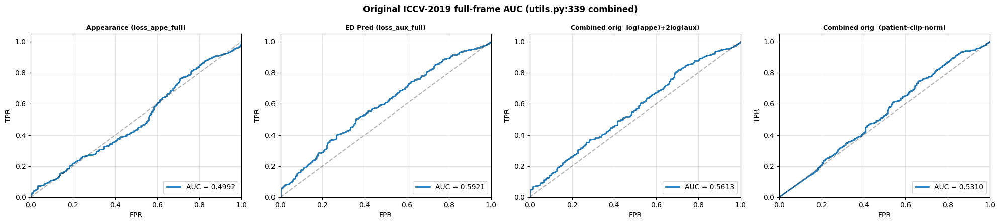

In [32]:
# Authors' original full-frame AUC (utils.py:339) on the ACDC(val+test)+M&M(val+test) pool.
ff_auc_acdc_mmtest = run_full_frame_assessment(
    ff_df, mu_appe, mu_aux, model_type=MODEL_TYPE, frame_mode=FRAME_MODE)

## Visualization

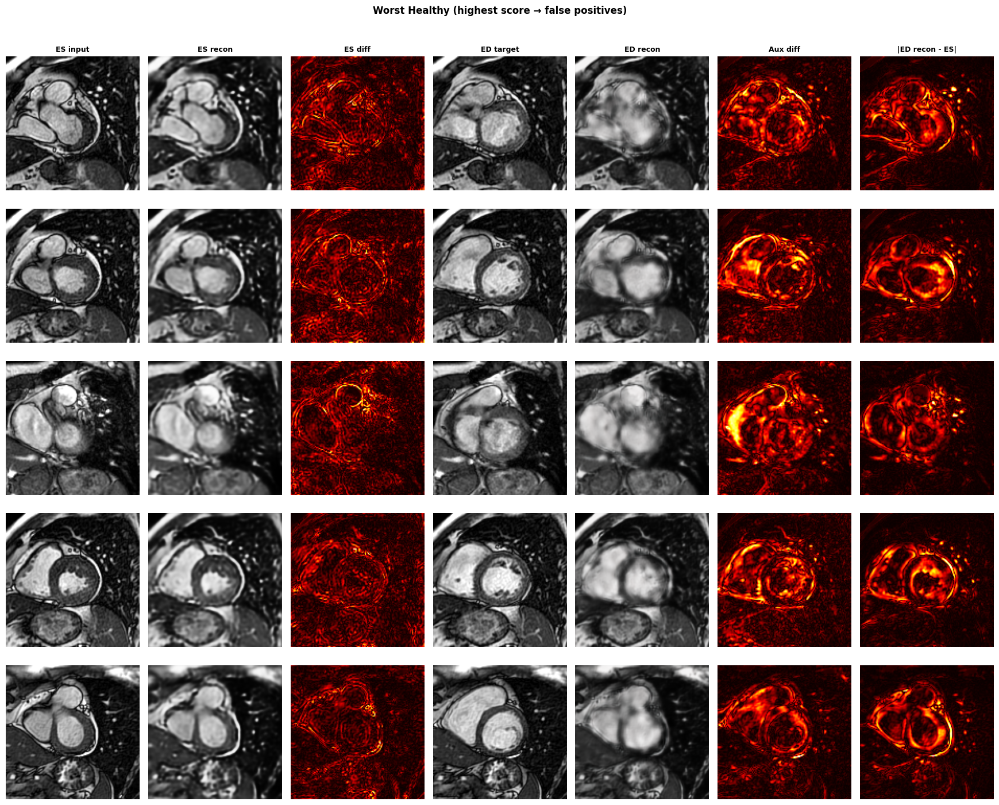

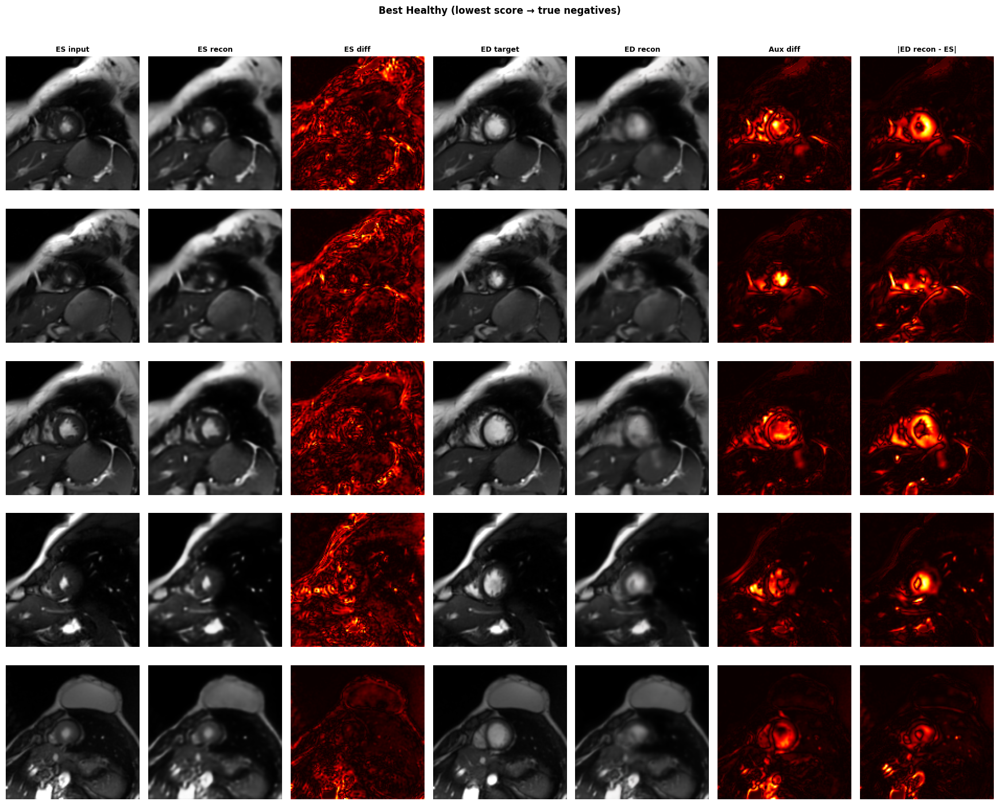

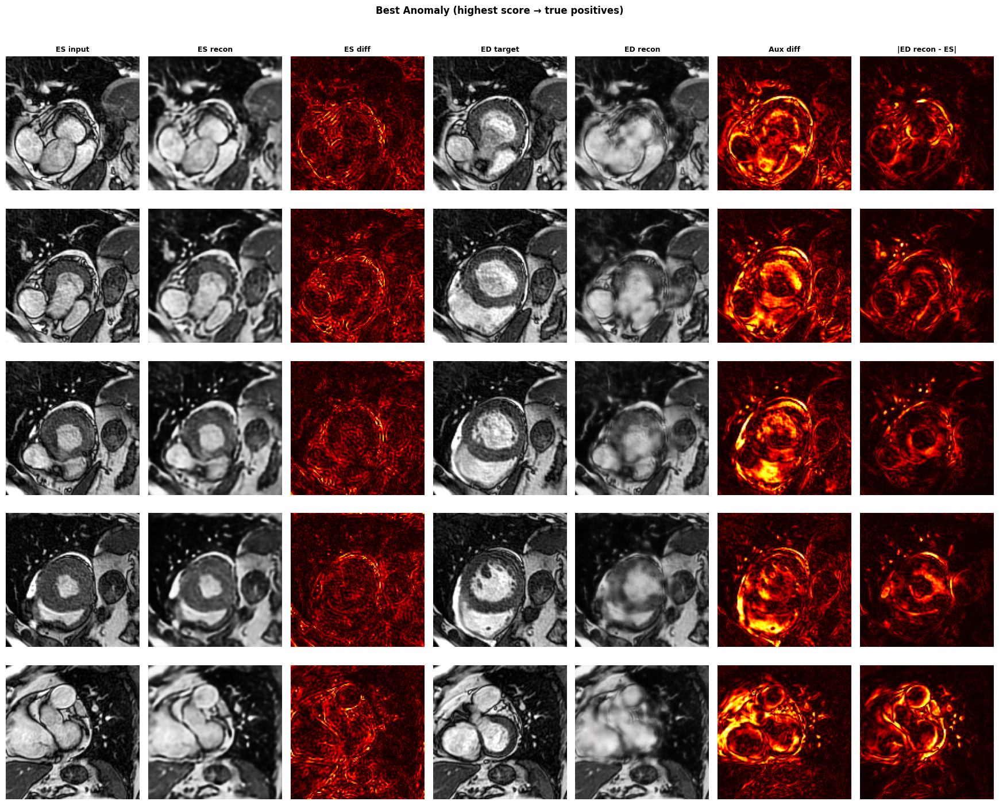

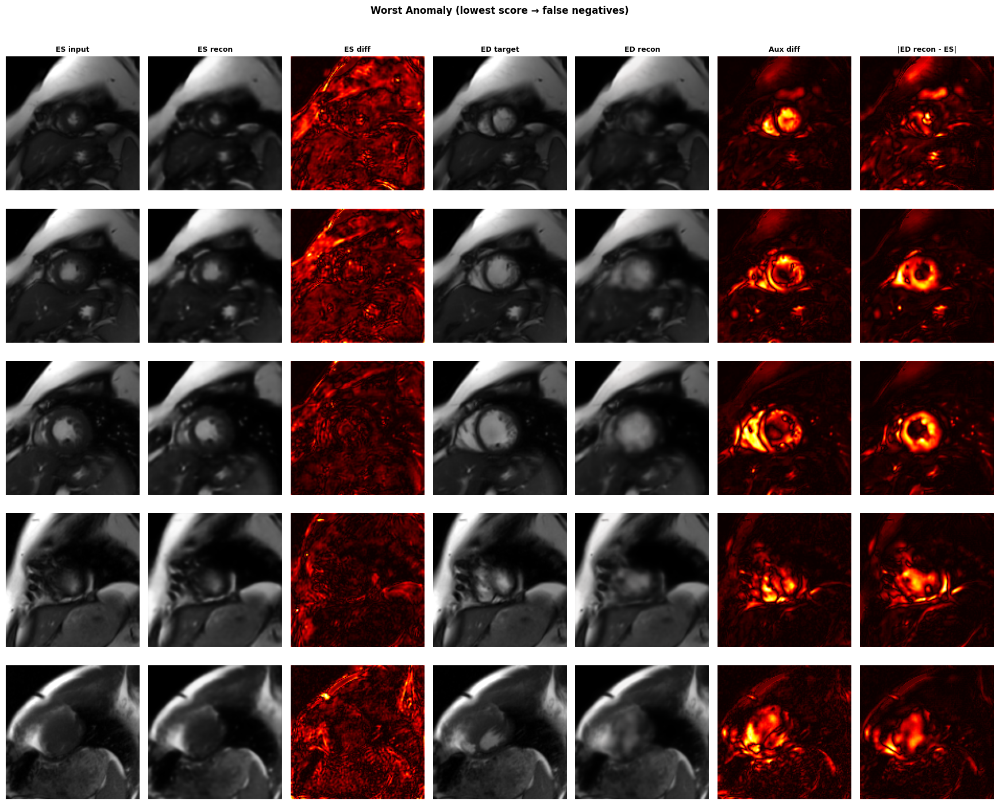

In [33]:
# -- Extreme-slice visualization ---------------------------------------------
# Show best/worst slices ranked by the paper log-formula combined score.
# n=5 slices per group; change score_col to compare other metrics.
#
# SOURCE selects which earlier cell's results to visualize:
#   'test'     -> the regular test evaluation cell (run_evaluation output)
#   'combined' -> the combined val+test cell (concatenated ACDC and/or M&M)
SOURCE = 'combined'

if SOURCE == 'test':
    _missing = [n for n in ('df', 'images', 'aux_targets', 'recon_images', 'recon_aux')
                if n not in globals()]
    if _missing:
        raise NameError(
            f"SOURCE='test' but missing {_missing}; run the test-evaluation cell first."
        )
    _viz_args = (df, images, aux_targets, recon_images, recon_aux)
elif SOURCE == 'combined':
    _missing = [n for n in ('comb_df', '_comb_p1', '_comb_p2',
                            '_comb_recon_imgs', '_comb_recon_aux')
                if n not in globals()]
    if _missing:
        raise NameError(
            f"SOURCE='combined' but missing {_missing}; run the "
            "'Test + Validation Combined Evaluation' cell first."
        )
    _viz_args = (comb_df, _comb_p1, _comb_p2, _comb_recon_imgs, _comb_recon_aux)
else:
    raise ValueError(f"Unknown SOURCE={SOURCE!r}; use 'test' or 'combined'")

show_extreme_slices(
    *_viz_args,
    model_type = MODEL_TYPE,
    score_col  = 'combined_paper',
    n          = 5,
)

## Patient-Level Evaluation

Aggregate slice-level anomaly scores to patient level using the `df` produced above.

- `'max_score'`: patient score = maximum slice score (flag if any single slice is highly anomalous). Best used with `SLICE_MODE='all'`.
- `'mean_score'`: patient score = mean slice score (robust to outlier slices; better for diffuse pathologies like DCM/HCM).
- `'top3_mean'`: patient score = mean of the top-3 slice scores (compromise between max and mean).


In [34]:
# Aggregation: choose how slice-level scores roll up to a per-patient score.
#   Flat:         'max_score', 'mean_score', 'top3_mean'
#   Hierarchical: 'hier_mean_max', 'hier_mean_top3'
#     -> per slice: mean over frame-pairs; per patient: max / top-3 mean.
# Recommended:
#   FRAME_MODE='ed_es'      -> 'max_score' (one row per slice anyway)
#   FRAME_MODE='next_frame' -> 'hier_mean_max'  (avoids single-pair noise)
PATIENT_AGGREGATION = 'hier_mean_max' if FRAME_MODE == 'next_frame' else 'max_score'

patient_results = run_patient_evaluation(df, aggregation=PATIENT_AGGREGATION)
from IPython.display import display
display(patient_results)


NameError: name 'df' is not defined


Strategy 1: max(timeframes in slice) -> max(slices)   [= max_score]

  Patient-Level AUC -- Max Score
      Appearance (full loss): AUC = 0.5781  (38 patients)
                                [ACDC]  AUC = 0.5781  (38 patients)
                                [  MM]  AUC = N/A  (0 patients)
             Aux (full loss): AUC = 0.4010  (38 patients)
                                [ACDC]  AUC = 0.4010  (38 patients)
                                [  MM]  AUC = N/A  (0 patients)
            Combined (paper): AUC = 0.4323  (38 patients)
                                [ACDC]  AUC = 0.4323  (38 patients)
                                [  MM]  AUC = N/A  (0 patients)


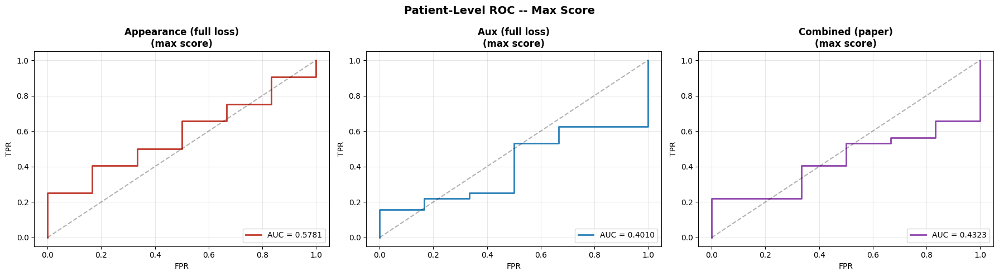


Strategy 2: mean(timeframes in slice) -> max(slices)  [= hier_mean_max]

  Patient-Level AUC -- Hierarchical (mean/slice -> max/patient)
      Appearance (full loss): AUC = 0.5885  (38 patients)
                                [ACDC]  AUC = 0.5885  (38 patients)
                                [  MM]  AUC = N/A  (0 patients)
             Aux (full loss): AUC = 0.4635  (38 patients)
                                [ACDC]  AUC = 0.4635  (38 patients)
                                [  MM]  AUC = N/A  (0 patients)
            Combined (paper): AUC = 0.5312  (38 patients)
                                [ACDC]  AUC = 0.5312  (38 patients)
                                [  MM]  AUC = N/A  (0 patients)


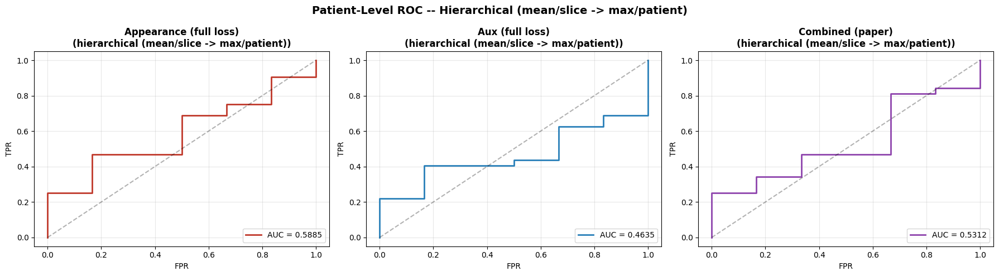


  Strategy 1 (max-max)  vs  Strategy 2 (mean-max) - patient-level AUC


,Score,AUC_overall_S1,AUC_overall_S2,AUC_ACDC_S1,AUC_ACDC_S2,AUC_MM_S1,AUC_MM_S2
0,Appearance (full loss),0.578125,0.588542,0.578125,0.588542,NaN,NaN
1,Aux (full loss),0.401042,0.463542,0.401042,0.463542,NaN,NaN
2,Combined (paper),0.432292,0.531250,0.432292,0.531250,NaN,NaN


In [ ]:
# Patient-Level AUC: two aggregation strategies side by side
#   Strategy 1 = keep per-timeframe score -> max over timeframes within slice
#                                         -> max over slices  (= flat max = `max_score`)
#   Strategy 2 = keep per-timeframe score -> mean over timeframes within slice
#                                         -> max over slices  (= `hier_mean_max`)

print('\nStrategy 1: max(timeframes in slice) -> max(slices)   [= max_score]')
res_s1 = run_patient_evaluation(df, aggregation='max_score')

print('\nStrategy 2: mean(timeframes in slice) -> max(slices)  [= hier_mean_max]')
res_s2 = run_patient_evaluation(df, aggregation='hier_mean_max')

# Side-by-side AUC comparison table (overall + per-dataset)
auc_col_s1 = next(c for c in res_s1.columns if c.startswith('AUC ('))
auc_col_s2 = next(c for c in res_s2.columns if c.startswith('AUC ('))
cmp = pd.DataFrame({
    'Score':           res_s1['Score'],
    'AUC_overall_S1':  res_s1[auc_col_s1].values,
    'AUC_overall_S2':  res_s2[auc_col_s2].values,
    'AUC_ACDC_S1':     res_s1['AUC_ACDC'].values,
    'AUC_ACDC_S2':     res_s2['AUC_ACDC'].values,
    'AUC_MM_S1':       res_s1['AUC_MM'].values,
    'AUC_MM_S2':       res_s2['AUC_MM'].values,
})
print('\n' + '=' * 72)
print('  Strategy 1 (max-max)  vs  Strategy 2 (mean-max) - patient-level AUC')
print('=' * 72)
from IPython.display import display
display(cmp)


## Vendor / Scanner Confound Diagnostic (Val + Test Set)

Per-volume 1st/99th-percentile normalisation in the data loaders fixes mean and contrast across scanners but leaves vendor-specific noise texture and reconstruction artefacts intact. A reconstruction GAN learns to mimic exactly that texture, so vendors over-represented in the NOR training pool reconstruct cleanly while under-represented vendors get systematically higher residuals on every slice -- false positives that no patient-level aggregation can fix.

**Diagnostic on the full val + test pool** (maximises per-vendor / per-centre sample counts):

1. Load the full val+test pool of both datasets: ACDC validation (12) + test (38) patients (single Siemens vendor) and the M&M Validation + Testing folders (multi-vendor, multi-centre, all pathologies).
2. Score every slice through the trained generator -> per-sample appearance and auxiliary (flow / ED) reconstruction error.
3. Aggregate to patient level via top-20% slice mean (matches the chosen aggregation rule).
4. Inspect (a) NOR-only patient score distribution per vendor and (b) per-disease one-vs-NOR AUC stratified by vendor and by vendor+centre.

If NOR means differ across vendors by more than a small fraction of the NOR-vs-disease gap, the model is partly learning to score vendor identity rather than pathology -- and the global AUC is misleading.

Configure `MODEL_TYPE`, `DATASET_NAME`, and `EPOCH` in the next cell to point at your trained checkpoint.

Training NOR subjects: 68  (ACDC=20, M&M=48)

Healthy (NOR) training subjects per vendor:
vendor
ACDC_Siemens    20
M&M_GE          10
M&M_Philips     23
M&M_Siemens     15

Healthy (NOR) training subjects per (vendor+centre):
group
ACDC_Siemens_C0    20
M&M_GE_C4          10
M&M_Philips_C2     23
M&M_Siemens_C1     15


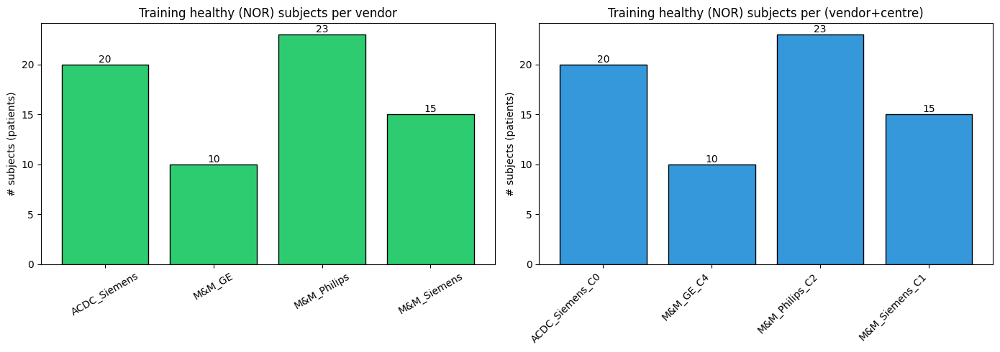

In [37]:
# === Training-set healthy (NOR) distribution per vendor / centre ====
# Context for the val+test diagnostic below: how many HEALTHY (NOR) subjects the
# model actually saw per scanner / site during training. Vendors / centres that
# are under-represented here are the ones whose healthy texture the GAN learns
# worst -> systematically higher reconstruction residuals at test time, which is
# what drives the per-vendor score offsets seen above.
#
# Counts SUBJECTS (patients), built purely from folder listings + the M&M CSV
# (no volume loading). Training NOR lives in the ACDC training folder and the
# M&M Training folder. NOTE: the RECON supplemental NOR volumes (if used in
# training) carry no vendor / centre label and are therefore not shown here.
import os
import pandas as pd
import matplotlib.pyplot as plt

# --- ACDC training NOR (single vendor Siemens, single centre C0) ----
_acdc_train = os.path.join(acdc_dir, 'database', 'training')
if not os.path.isdir(_acdc_train):
    _acdc_train = os.path.join(acdc_dir, 'database', 'training_test')
_acdc_nor = []
for _p in sorted(os.listdir(_acdc_train)):
    _cfg = os.path.join(_acdc_train, _p, 'Info.cfg')
    if not os.path.isfile(_cfg):
        continue
    _info = {}
    with open(_cfg, 'r') as _fh:
        for _line in _fh:
            if ':' in _line:
                _k, _v = _line.strip().split(':', 1)
                _info[_k.strip()] = _v.strip()
    if _info.get('Group', '') == 'NOR':
        _acdc_nor.append(_p)

# --- M&M training NOR (multi-vendor / multi-centre) -----------------
_df = pd.read_csv(mm_csv_path)
_ven_col = next((c for c in _df.columns if 'vendor' in c.lower()), None)
_cen_col = next((c for c in _df.columns if c.lower().startswith('cent')), None)
_ven = dict(zip(_df['External code'].astype(str), _df[_ven_col].astype(str)))
_cen = dict(zip(_df['External code'].astype(str), _df[_cen_col].astype(str)))
_nor_codes = set(_df[_df['Pathology'] == 'NOR']['External code'].astype(str))
_mm_sa = [f.replace('_sa.nii.gz', '') for f in os.listdir(mm_training_dir)
          if f.endswith('_sa.nii.gz') and not f.endswith('_gt.nii.gz')]
_mm_nor = [s for s in _mm_sa if s in _nor_codes]

# --- One row per training-NOR subject, labelled vendor + vendor/centre
_rows = []
for _p in _acdc_nor:
    _rows.append({'pid': _p, 'vendor': 'ACDC_Siemens', 'group': 'ACDC_Siemens_C0'})
for _s in _mm_nor:
    _v = _ven.get(_s, 'UNKNOWN')
    _v = _v if _v and _v.lower() != 'nan' else 'UNKNOWN'
    _c = _cen.get(_s, '?')
    _rows.append({'pid': _s, 'vendor': f'M&M_{_v}', 'group': f'M&M_{_v}_C{_c}'})
train_nor = pd.DataFrame(_rows)

_by_vendor = train_nor['vendor'].value_counts().sort_index()
_by_group  = train_nor['group'].value_counts().sort_index()

print(f'Training NOR subjects: {len(train_nor)}  (ACDC={len(_acdc_nor)}, M&M={len(_mm_nor)})')
print()
print('Healthy (NOR) training subjects per vendor:')
print(_by_vendor.to_string())
print()
print('Healthy (NOR) training subjects per (vendor+centre):')
print(_by_group.to_string())

# --- Plot -----------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
_b0 = axes[0].bar(_by_vendor.index, _by_vendor.values, color='#2ecc71', edgecolor='black')
axes[0].set_title('Training healthy (NOR) subjects per vendor')
axes[0].set_ylabel('# subjects (patients)')
axes[0].tick_params(axis='x', rotation=30)
for _rect, _val in zip(_b0, _by_vendor.values):
    axes[0].text(_rect.get_x() + _rect.get_width() / 2, _val, str(_val),
                 ha='center', va='bottom')

_b1 = axes[1].bar(_by_group.index, _by_group.values, color='#3498db', edgecolor='black')
axes[1].set_title('Training healthy (NOR) subjects per (vendor+centre)')
axes[1].set_ylabel('# subjects (patients)')
for _rect, _val in zip(_b1, _by_group.values):
    axes[1].text(_rect.get_x() + _rect.get_width() / 2, _val, str(_val),
                 ha='center', va='bottom')
for _lbl in axes[1].get_xticklabels():
    _lbl.set_rotation(45)
    _lbl.set_ha('right')

plt.tight_layout()
plt.show()


In [35]:
# === Vendor confound diagnostic -- setup ===========================
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

# --- Reuse the SAME model configured in the 'Model Evaluation' section ---
# This diagnostic does NOT define its own checkpoint; it inherits MODEL_TYPE,
# MODEL_DATASET and MODEL_EPOCH from the Model Evaluation config cell above, so
# there is nothing to re-specify here. Run that cell first; re-point the model
# there and it propagates to this section automatically.
for _req in ('MODEL_TYPE', 'MODEL_DATASET', 'MODEL_EPOCH', 'FRAME_MODE', 'TARGET_SIZE'):
    if _req not in globals():
        raise NameError(f'{_req} is undefined -- run the Model Evaluation config cell first.')
DATASET_NAME = MODEL_DATASET                       # reuse evaluated checkpoint folder
EPOCH        = MODEL_EPOCH                          # reuse evaluated ckpt index
CKPT_PATH    = f'./training_saver/{DATASET_NAME}/model_ckpt_{EPOCH}.ckpt'
print(f'Reusing model: {MODEL_TYPE} | {DATASET_NAME} | epoch {EPOCH}')

TOP_K        = 0.20                                # top-K% slice -> patient
BATCH_SIZE   = 16

# --- Pick the right loader module ---------------------------------
import importlib
from collections import Counter
_dl = importlib.import_module('data_loader_rgb' if MODEL_TYPE == 'rgb' else 'data_loader')
# es_ed reuses the ed_es loaders but flips the model-input phase to ED (mirrors run_model.py:192).
_dl.set_edes_direction('ed' if FRAME_MODE == 'es_ed' else 'es')
dl = _dl                                            # alias kept for any later cell

# CSV path reused below for the vendor / centre lookups.
MM_CSV = mm_csv_path

# --- Load the FULL val+test pool of BOTH datasets, honouring FRAME_MODE ---
# Mirrors the 'Test + Validation Combined Evaluation' cell so the per-vendor /
# per-centre AUC is computed over the largest possible pool (ACDC val 12 + test
# 38; M&M Validation + Testing folders). p1 = input frame fed to the generator,
# p2 = auxiliary target (GT optical flow for 'flow', ED / next frame for 'rgb'),
# exactly what this diagnostic's loss graph expects for plh_frame / plh_aux.
_p1_parts, _p2_parts = [], []
_lbls, _pids, _source, _sids = [], [], [], []

# -- ACDC val + ACDC test --------------------------------------------
if FRAME_MODE in ('ed_es', 'es_ed'):
    _acdc_loader, _acdc_kwargs = _dl.load_acdc_test_val_ed_es_data, {}
elif FRAME_MODE in ('next_frame', 'next_frame_systole'):
    _acdc_loader = _dl.load_acdc_test_val_data
    _acdc_kwargs = {'restrict_to_systole': FRAME_MODE == 'next_frame_systole'}
else:
    raise ValueError(f'Unknown FRAME_MODE={FRAME_MODE!r}')
(_v_p1, _v_p2, _v_lbls, _v_pids, _v_sids,
 _t_p1, _t_p2, _t_lbls, _t_pids, _t_sids) = _acdc_loader(acdc_dir, **_acdc_kwargs)
_p1_parts.append(np.concatenate([_v_p1, _t_p1], axis=0))
_p2_parts.append(np.concatenate([_v_p2, _t_p2], axis=0))
_lbls   += list(_v_lbls) + list(_t_lbls)
_pids   += list(_v_pids) + list(_t_pids)
_sids   += list(_v_sids) + list(_t_sids)
_source += ['ACDC'] * (len(_v_lbls) + len(_t_lbls))

# -- M&M val + M&M test ----------------------------------------------
if FRAME_MODE in ('ed_es', 'es_ed'):
    _mv_p1, _mv_p2, _mv_lbls, _mv_pids, _mv_sids = _dl.load_mm_validation_ed_es_data(
        mm_val_dir, mm_csv_path, TARGET_SIZE)
    _mt_p1, _mt_p2, _mt_lbls, _mt_pids, _mt_sids = _dl.load_mm_testing_ed_es_data(
        mm_testing_dir, mm_csv_path, TARGET_SIZE)
else:
    _systole = FRAME_MODE == 'next_frame_systole'
    _mv_p1, _mv_p2, _mv_lbls, _mv_pids, _mv_sids = _dl.load_mm_validation_data(
        mm_val_dir, mm_csv_path, TARGET_SIZE, restrict_to_systole=_systole)
    _mt_p1, _mt_p2, _mt_lbls, _mt_pids, _mt_sids = _dl.load_mm_validation_data(
        mm_testing_dir, mm_csv_path, TARGET_SIZE, restrict_to_systole=_systole)
_p1_parts.append(np.concatenate([_mv_p1, _mt_p1], axis=0))
_p2_parts.append(np.concatenate([_mv_p2, _mt_p2], axis=0))
_lbls   += list(_mv_lbls) + list(_mt_lbls)
_pids   += list(_mv_pids) + list(_mt_pids)
_sids   += list(_mv_sids) + list(_mt_sids)
_source += ['MM'] * (len(_mv_lbls) + len(_mt_lbls))

test_imgs   = np.concatenate(_p1_parts, axis=0)
test_aux    = np.concatenate(_p2_parts, axis=0)
test_lbls   = _lbls
test_pids   = _pids
test_source = _source
test_sids   = _sids
print(f'Combined val+test: {len(test_imgs)} slices, {len(set(test_pids))} patients')
print(f'  ACDC: val={len(set(_v_pids))} + test={len(set(_t_pids))} patients')
print(f'  M&M:  val={len(set(_mv_pids))} + test={len(set(_mt_pids))} patients')
print(f'  Class counts: {dict(Counter(test_lbls))}')

# --- Build vendor lookup from the M&M CSV --------------------------
df_csv = pd.read_csv(MM_CSV)
vendor_col = next((c for c in df_csv.columns if 'vendor' in c.lower()), None)
if vendor_col is None:
    raise RuntimeError(f'No vendor column in CSV. Available columns: {list(df_csv.columns)}')
print(f'Using vendor column: {vendor_col!r}')
mm_vendor = dict(zip(df_csv['External code'].astype(str), df_csv[vendor_col].astype(str)))

# --- Build centre lookup too (M&M is multi-centre; ACDC is one centre) ---
center_col = next((c for c in df_csv.columns if c.lower().startswith('cent')), None)
if center_col is None:
    raise RuntimeError(f'No centre column in CSV. Available columns: {list(df_csv.columns)}')
print(f'Using centre column: {center_col!r}')
mm_center = dict(zip(df_csv['External code'].astype(str), df_csv[center_col].astype(str)))

def patient_vendor(pid):
    pid = str(pid)
    if pid in mm_vendor:
        v = mm_vendor[pid]
        return f'M&M_{v}' if v and v.lower() != 'nan' else 'M&M_UNKNOWN'
    if pid.startswith('patient'):
        return 'ACDC_Siemens'
    return 'UNKNOWN'

def patient_group(pid):
    # Vendor + centre label. ACDC is a single centre / single Siemens scanner,
    # so it collapses to one group; M&M is split per (vendor, centre).
    pid = str(pid)
    if pid in mm_vendor:
        v = mm_vendor[pid]
        v = v if v and v.lower() != 'nan' else 'UNKNOWN'
        c = mm_center.get(pid, '?')
        return f'M&M_{v}_C{c}'
    if pid.startswith('patient'):
        return 'ACDC_Siemens_C0'
    return 'UNKNOWN'

vendors = [patient_vendor(p) for p in test_pids]
groups  = [patient_group(p)  for p in test_pids]

print()
print('Slice counts per (vendor, pathology):')
print(pd.DataFrame({'vendor': vendors, 'pathology': test_lbls})
        .groupby(['vendor', 'pathology']).size().unstack(fill_value=0))
print()
print('Slice counts per (vendor+centre, pathology):')
print(pd.DataFrame({'group': groups, 'pathology': test_lbls})
        .groupby(['group', 'pathology']).size().unstack(fill_value=0))

# restore default ED/ES direction so later ed_es cells aren't left with a stale 'ed'.
_dl.set_edes_direction('es')

Reusing model: rgb | ACDC_MM_RECON_ED_ES_RGB_NOR_v1_orient_spacing_added | epoch 50
Error processing C8J7L5: Exception thrown in SimpleITK ImageFileReader_Execute: D:\a\SimpleITK\SimpleITK\bld\ITK\Modules\IO\NIFTI\src\itkNiftiImageIO.cxx:2135:
ITK ERROR: ITK only supports orthonormal direction cosines.  No orthonormal definition found!
Error processing C8O0P2: Exception thrown in SimpleITK ImageFileReader_Execute: D:\a\SimpleITK\SimpleITK\bld\ITK\Modules\IO\NIFTI\src\itkNiftiImageIO.cxx:2135:
ITK ERROR: ITK only supports orthonormal direction cosines.  No orthonormal definition found!
Error processing E3F5U2: Exception thrown in SimpleITK ImageFileReader_Execute: D:\a\SimpleITK\SimpleITK\bld\ITK\Modules\IO\NIFTI\src\itkNiftiImageIO.cxx:2135:
ITK ERROR: ITK only supports orthonormal direction cosines.  No orthonormal definition found!
Combined val+test: 1529 slices, 217 patients
  ACDC: val=12 + test=38 patients
  M&M:  val=33 + test=134 patients
  Class counts: {'NOR': 339, 'HCM': 279,

c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf_rgb.py:165: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  d = tf.layers.batch_normalization(d, training=training)
c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf_rgb.py:173: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  u = tf.layers.batch_normalization(u, training=training)


Restoring ./training_saver/ACDC_MM_RECON_ED_ES_RGB_NOR_v1_orient_spacing_added/model_ckpt_50.ckpt
INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_ED_ES_RGB_NOR_v1_orient_spacing_added/model_ckpt_50.ckpt
Scored 1529 slices.
  appe range [0.0231, 0.2400]
  ed  range [0.0288, 0.4324]

Patient counts per (vendor, pathology):
pathology     AHS  ARV  DCM  HCM  HHD  IHD  LVNC  MINF  NOR  Other  RV
vendor                                                                
ACDC_Siemens    0    0   10   10    0    0     0    10   10      0  10
M&M_Canon       0    1    9   15    1    1     2     0   14      7   0
M&M_GE          1    2    0    4   10    2     0     0   10     18   0
M&M_Philips     0    0   26   11    3    0     0     0   10      0   0
M&M_Siemens     0    4    8    2    0    0     0     0    6      0   0


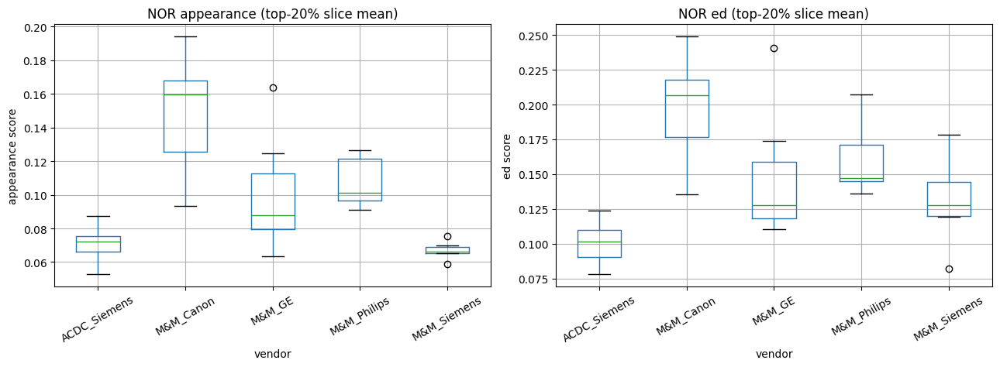


=== NOR-only stats by vendor (appearance) ===
              count     mean      std
vendor                               
ACDC_Siemens     10  0.07143  0.01071
M&M_Canon        14  0.14945  0.03110
M&M_GE           10  0.09770  0.03041
M&M_Philips      10  0.10697  0.01380
M&M_Siemens       6  0.06694  0.00549

=== NOR-only stats by vendor (ed) ===
              count     mean      std
vendor                               
ACDC_Siemens     10  0.10101  0.01439
M&M_Canon        14  0.20063  0.03235
M&M_GE           10  0.14466  0.04011
M&M_Philips      10  0.15797  0.02204
M&M_Siemens       6  0.13045  0.03221

[appe] NOR mean=0.1051  disease mean=0.1058  gap=0.0007  vendor spread=0.0825  spread/gap=11395.1%

[aux] NOR mean=0.1526  disease mean=0.1724  gap=0.0198  vendor spread=0.0996  spread/gap=503.0%

Rule of thumb: spread/gap > ~30% means scanner is a non-trivial confound.

=== Patients per disease (overall, val+test) ===
pathology
NOR      50
AHS       1
ARV       7
DCM      53
HC

In [36]:
# === Vendor confound diagnostic -- score test slices and analyse ===
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
sys.modules['tensorflow'] = tf

if MODEL_TYPE == 'flow':
    import GAN_tf as G
    AUX_NAME = 'flow'
else:
    import GAN_tf_rgb as G
    AUX_NAME = 'ed'

tf.reset_default_graph()
H, W = 128, 128
plh_frame = tf.placeholder(tf.float32, shape=[None, H, W, 3])
plh_aux   = tf.placeholder(tf.float32, shape=[None, H, W, 3])
plh_train = tf.placeholder(tf.bool)
plh_drop  = tf.placeholder_with_default(1.0, shape=())
scaled_frame = (plh_frame / 0.5) - 1.0
output_aux, output_appe = G.Generator(scaled_frame, plh_train, plh_drop)

# Per-sample appearance loss (mirrors training graph)
dy1, dx1 = tf.image.image_gradients(output_appe)
dy0, dx0 = tf.image.image_gradients(scaled_frame)
ps_loss_inten = tf.reduce_mean((output_appe - scaled_frame) ** 2, axis=[1, 2, 3])
ps_loss_gradi = tf.reduce_mean(
    tf.abs(tf.abs(dy1) - tf.abs(dy0)) + tf.abs(tf.abs(dx1) - tf.abs(dx0)),
    axis=[1, 2, 3])
ps_loss_appe = ps_loss_inten + ps_loss_gradi

# Per-sample auxiliary loss (flow = L1; ED = MSE + gradient, like appearance)
if MODEL_TYPE == 'flow':
    ps_loss_aux = tf.reduce_mean(tf.abs(output_aux - plh_aux), axis=[1, 2, 3])
else:
    scaled_aux = (plh_aux / 0.5) - 1.0
    ed_dy1, ed_dx1 = tf.image.image_gradients(output_aux)
    ed_dy0, ed_dx0 = tf.image.image_gradients(scaled_aux)
    ps_inten_ed = tf.reduce_mean((output_aux - scaled_aux) ** 2, axis=[1, 2, 3])
    ps_gradi_ed = tf.reduce_mean(
        tf.abs(tf.abs(ed_dy1) - tf.abs(ed_dy0)) + tf.abs(tf.abs(ed_dx1) - tf.abs(ed_dx0)),
        axis=[1, 2, 3])
    ps_loss_aux = ps_inten_ed + ps_gradi_ed

# Restore only generator vars (skips the unused discriminator)
gen_vars = [v for v in tf.global_variables() if 'gen_' in v.name]
saver = tf.train.Saver(var_list=gen_vars)

appe_ps = np.zeros(len(test_imgs))
aux_ps  = np.zeros(len(test_imgs))
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    print(f'Restoring {CKPT_PATH}')
    saver.restore(sess, CKPT_PATH)
    n = len(test_imgs)
    for start in range(0, n, BATCH_SIZE):
        idx = np.arange(start, min(start + BATCH_SIZE, n))
        a, b = sess.run([ps_loss_appe, ps_loss_aux],
                        feed_dict={
                            plh_frame: test_imgs[idx],
                            plh_aux:   test_aux[idx],
                            plh_train: False,
                            plh_drop:  1.0,
                        })
        appe_ps[idx] = a
        aux_ps[idx]  = b
print(f'Scored {len(test_imgs)} slices.')
print(f'  appe range [{appe_ps.min():.4f}, {appe_ps.max():.4f}]')
print(f'  {AUX_NAME}  range [{aux_ps.min():.4f}, {aux_ps.max():.4f}]')

# === Patient-level aggregation via top-K% slice mean ================
df_slice = pd.DataFrame({'pid': test_pids, 'pathology': test_lbls,
                          'vendor': vendors, 'group': groups,
                          'appe': appe_ps, 'aux': aux_ps})

def topk_mean(s):
    arr = np.sort(np.asarray(s.values))
    k = max(1, int(np.ceil(len(arr) * TOP_K)))
    return arr[-k:].mean()

df_pt = (df_slice.groupby('pid', sort=False)
         .agg(pathology=('pathology', 'first'),
              vendor   =('vendor',    'first'),
              group    =('group',     'first'),
              appe     =('appe',      topk_mean),
              aux      =('aux',       topk_mean),
              n_slices =('appe',      'count'))
         .reset_index())

print()
print('Patient counts per (vendor, pathology):')
print(df_pt.groupby(['vendor', 'pathology']).size().unstack(fill_value=0))

# === (A) NOR-only patient score distribution per vendor =============
df_nor = df_pt[df_pt.pathology == 'NOR']
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
df_nor.boxplot(column='appe', by='vendor', ax=axes[0])
axes[0].set_title('NOR appearance (top-20% slice mean)')
axes[0].set_ylabel('appearance score')
axes[0].tick_params(axis='x', rotation=30)
df_nor.boxplot(column='aux', by='vendor', ax=axes[1])
axes[1].set_title(f'NOR {AUX_NAME} (top-20% slice mean)')
axes[1].set_ylabel(f'{AUX_NAME} score')
axes[1].tick_params(axis='x', rotation=30)
plt.suptitle('')
plt.tight_layout()
plt.show()

print()
print('=== NOR-only stats by vendor (appearance) ===')
print(df_nor.groupby('vendor')['appe'].agg(['count', 'mean', 'std']).round(5))
print()
print(f'=== NOR-only stats by vendor ({AUX_NAME}) ===')
print(df_nor.groupby('vendor')['aux'].agg(['count', 'mean', 'std']).round(5))

for col in ('appe', 'aux'):
    nor_mu = df_pt[df_pt.pathology == 'NOR'][col].mean()
    dis_mu = df_pt[df_pt.pathology != 'NOR'][col].mean()
    means_per_v = df_nor.groupby('vendor')[col].mean()
    spread = means_per_v.max() - means_per_v.min()
    gap    = dis_mu - nor_mu
    ratio  = spread / max(1e-9, abs(gap))
    print()
    print(f'[{col}] NOR mean={nor_mu:.4f}  disease mean={dis_mu:.4f}  '
          f'gap={gap:.4f}  vendor spread={spread:.4f}  spread/gap={ratio:.1%}')

print()
print('Rule of thumb: spread/gap > ~30% means scanner is a non-trivial confound.')

# === (B) Per-stratum per-disease one-vs-NOR AUC ====================
diseases = sorted(df_pt[df_pt.pathology != 'NOR']['pathology'].unique())

def stratified_auc(df, key):
    # One-vs-NOR AUC per disease, computed separately within each level of `key`
    # (e.g. vendor, or vendor+centre). A stratum needs >=2 NOR and >=2 positives.
    rows = []
    for g in sorted(df[key].unique()):
        sub = df[df[key] == g]
        nor = sub[sub.pathology == 'NOR']
        if len(nor) < 2:
            continue
        for d in diseases:
            pos = sub[sub.pathology == d]
            for sc in ('appe', 'aux'):
                if len(pos) < 2:
                    rows.append((g, d, sc, np.nan, len(nor), len(pos)))
                    continue
                y = np.r_[np.zeros(len(nor)), np.ones(len(pos))]
                vals = np.r_[nor[sc].values, pos[sc].values]
                try:
                    auc = roc_auc_score(y, vals)
                except Exception:
                    auc = np.nan
                rows.append((g, d, sc, auc, len(nor), len(pos)))
    return pd.DataFrame(rows, columns=[key, 'disease', 'score', 'auc', 'n_nor', 'n_pos'])

# Patient-count table: rows = pathology (NOR first, then diseases), cols = stratum.
# These are the n's behind every AUC cell -- a stratum needs >=2 NOR and >=2 of a
# disease before stratified_auc reports a number (otherwise NaN).
def patient_count_table(df, key):
    tbl = (df.groupby([key, 'pathology']).size()
             .unstack(fill_value=0).T
             .reindex(['NOR'] + diseases, fill_value=0))
    tbl.index.name = 'pathology'
    return tbl

# --- Patients per disease (overall) ---------------------------------
print()
print('=== Patients per disease (overall, val+test) ===')
print(df_pt['pathology'].value_counts().reindex(['NOR'] + diseases, fill_value=0).to_string())

# --- Per-vendor -----------------------------------------------------
df_auc = stratified_auc(df_pt, 'vendor')
print()
print('=== Patients per disease per vendor ===')
print('(an AUC cell below is reported only where this table shows >=2 NOR and >=2 of the disease)')
print(patient_count_table(df_pt, 'vendor'))
print()
print('=== Per-vendor per-disease one-vs-NOR AUC ===')
print('(rows = disease, cols = score | vendor)')
print(df_auc.pivot(index='disease', columns=['score', 'vendor'], values='auc').round(3))

# --- Per-(vendor+centre) -------------------------------------------
df_auc_g = stratified_auc(df_pt, 'group')
print()
print('=== Patients per disease per (vendor+centre) ===')
print('(ACDC = single centre / single Siemens; M&M split per vendor+centre)')
print(patient_count_table(df_pt, 'group'))
print()
print('=== Per-(vendor+centre) per-disease one-vs-NOR AUC ===')
print('(rows = disease, cols = score | vendor_centre; ACDC = single centre / single Siemens)')
print(df_auc_g.pivot(index='disease', columns=['score', 'group'], values='auc').round(3))
print()
print('Interpretation: if AUC for the same disease swings widely across vendors/centres,')
print('the model is partly distinguishing scanner/site rather than pathology.')


### Interactive per-sample reconstruction viewer

Pick a **patient** (by disease and centre/vendor), a **slice**, and -- only in `next_frame` / `next_frame_systole` modes -- a **frame**. The trained generator reconstructs the input frame and predicts the auxiliary target (ED / next frame, or optical flow). Model predictions (top row) sit directly above their ground truth (bottom row), with per-pixel squared-error heatmaps.

The `appe` / `aux` numbers in the title are the same `ps_loss_appe` / `ps_loss_aux` that drive the per-vendor AUC tables above, so a vendor that scores high there shows a visibly brighter residual here.

> Run the evaluation-config, vendor-setup, and scoring cells above first. This cell builds its own persistent TF session; if you re-run the scoring cell (which resets the default graph), re-run this cell too.

In [45]:
# === Interactive per-sample reconstruction viewer =========================
# Qualitative companion to the per-vendor AUC tables above. Reuses the SAME
# pool (test_imgs / test_aux / test_pids / test_lbls / test_sids / groups) and
# the SAME per-sample loss graph as the scoring cell, on a persistent session
# so each selection renders quickly.
import os, sys, json, traceback
from io import BytesIO
from collections import OrderedDict
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
sys.modules['tensorflow'] = tf
import GAN_tf, GAN_tf_rgb

# ---- 0. require the vendor-setup + scoring cells to have run -------------
_required = ['test_imgs', 'test_aux', 'test_pids', 'test_lbls', 'test_sids',
             'test_source', 'groups', 'MODEL_TYPE', 'FRAME_MODE',
             'MODEL_DATASET', 'MODEL_EPOCH']
_missing = [n for n in _required if n not in globals()]
if _missing:
    raise NameError(f"{_missing} undefined -- run the vendor-confound setup + "
                    f"scoring cells above first.")

if 'flow_to_color' not in globals():
    # fallback copy of the shared-utilities helper (it lives in a notebook cell,
    # not as a module-level symbol, so it can't be imported)
    import cv2 as _cv2
    import matplotlib.colors as _mcolors
    def flow_to_color(flow_3ch):
        """[dx, dy, mag] optical flow -> RGB via HSV, for display only."""
        dx, dy = flow_3ch[..., 0], flow_3ch[..., 1]
        mag, ang = _cv2.cartToPolar(dx, dy)
        hsv = np.zeros((*dx.shape, 3), dtype=np.float32)
        hsv[..., 0] = ang / (2 * np.pi)
        hsv[..., 1] = 1.0
        hsv[..., 2] = mag / (np.max(mag) + 1e-8)
        return _mcolors.hsv_to_rgb(hsv)

G         = GAN_tf if MODEL_TYPE == 'flow' else GAN_tf_rgb
CKPT_PATH = f'./training_saver/{MODEL_DATASET}/model_ckpt_{MODEL_EPOCH}.ckpt'

# training-NOR baseline for the combined score (optional)
_mu_path = f'./training_saver/{MODEL_DATASET}/mu_baseline_{MODEL_EPOCH}.json'
if os.path.exists(_mu_path):
    _d = json.load(open(_mu_path)); mu_appe = float(_d['mu_appe']); mu_aux = float(_d['mu_aux'])
else:
    mu_appe = mu_aux = None
    print(f'[widget] no {_mu_path} -- combined score shown as NaN')

# ---- 1. persistent inference session (built once; mirrors scoring graph) -
if globals().get('_wdg_sess') is not None:
    try: _wdg_sess.close()
    except Exception: pass
    _wdg_sess = None

tf.reset_default_graph()
_H, _W = 128, 128
w_plh_frame = tf.placeholder(tf.float32, shape=[None, _H, _W, 3])
w_plh_aux   = tf.placeholder(tf.float32, shape=[None, _H, _W, 3])
w_plh_train = tf.placeholder(tf.bool)
w_plh_drop  = tf.placeholder_with_default(1.0, shape=())
w_scaled_frame = (w_plh_frame / 0.5) - 1.0
w_output_aux, w_output_appe = G.Generator(w_scaled_frame, w_plh_train, w_plh_drop)

# per-sample appearance loss: intensity MSE + gradient term
_dy1, _dx1 = tf.image.image_gradients(w_output_appe)
_dy0, _dx0 = tf.image.image_gradients(w_scaled_frame)
w_ps_loss_appe = (tf.reduce_mean((w_output_appe - w_scaled_frame) ** 2, axis=[1, 2, 3])
                  + tf.reduce_mean(tf.abs(tf.abs(_dy1) - tf.abs(_dy0))
                                   + tf.abs(tf.abs(_dx1) - tf.abs(_dx0)), axis=[1, 2, 3]))
# per-sample aux loss: flow = L1; ED / next-frame = MSE + gradient
if MODEL_TYPE == 'flow':
    w_ps_loss_aux = tf.reduce_mean(tf.abs(w_output_aux - w_plh_aux), axis=[1, 2, 3])
else:
    _scaled_aux = (w_plh_aux / 0.5) - 1.0
    _edy1, _edx1 = tf.image.image_gradients(w_output_aux)
    _edy0, _edx0 = tf.image.image_gradients(_scaled_aux)
    w_ps_loss_aux = (tf.reduce_mean((w_output_aux - _scaled_aux) ** 2, axis=[1, 2, 3])
                     + tf.reduce_mean(tf.abs(tf.abs(_edy1) - tf.abs(_edy0))
                                      + tf.abs(tf.abs(_edx1) - tf.abs(_edx0)), axis=[1, 2, 3]))

w_gen_vars = [v for v in tf.global_variables() if 'gen_' in v.name]
w_saver = tf.train.Saver(var_list=w_gen_vars)
_wdg_sess = tf.Session()
_wdg_sess.run(tf.global_variables_initializer())
w_saver.restore(_wdg_sess, CKPT_PATH)
print(f'[widget] restored {CKPT_PATH}  ({len(w_gen_vars)} generator vars, '
      f'{len(test_imgs)} samples)')

# ---- 2. index samples: pid -> {label, group, slices: {z -> [flat idx...]}} -
by_pid = OrderedDict()
for _i, _pid in enumerate(test_pids):
    _pid = str(_pid)
    _rec = by_pid.get(_pid)
    if _rec is None:
        _rec = {'label': test_lbls[_i], 'group': groups[_i], 'slices': OrderedDict()}
        by_pid[_pid] = _rec
    _rec['slices'].setdefault(int(test_sids[_i]), []).append(_i)

# ---- 3. display naming / helpers (mirror the synthetic-anomaly cell) -----
if FRAME_MODE in ('next_frame', 'next_frame_systole'):
    AUX_DISP, IN_DISP = 'Next frame', 'Input frame'
elif MODEL_TYPE == 'flow':
    AUX_DISP, IN_DISP = 'Flow', 'Input ES'
else:
    AUX_DISP, IN_DISP = 'ED', 'Input ES'

def _show_aux(ax, arr):
    if MODEL_TYPE == 'flow':
        ax.imshow(np.clip(flow_to_color(arr), 0.0, 1.0))
    else:
        ax.imshow(np.clip(arr, 0.0, 1.0), cmap='gray')

# ---- 4. widgets ----------------------------------------------------------
_style = {'description_width': 'initial'}
disease_dd = widgets.Dropdown(options=sorted({str(l) for l in test_lbls}),
                              description='Disease:', style=_style)
center_dd  = widgets.Dropdown(description='Center (vendor+centre):', style=_style)
patient_dd = widgets.Dropdown(description='Patient:', style=_style)
slice_dd   = widgets.Dropdown(description='Slice (z):', style=_style)
frame_dd   = widgets.Dropdown(description='Frame:', style=_style)
img_widget = widgets.Image(format='png')
info_out   = widgets.Output()

# Re-entrancy / dedup guards. The dropdowns cascade (disease -> center ->
# patient -> slice -> frame); each level reassigns the next level's `.options`,
# and every such reassignment fires that level's observer synchronously. Without
# a guard a single click triggers several blocking TF inferences, and any
# exception raised inside an observer is swallowed by ipywidgets -- which leaks
# the matplotlib figure and leaves the viewer unresponsive ("frozen"). So:
#   _last['i']         -> skip re-rendering the sample already on screen
#   _state['updating'] -> set while the cascade rebuilds options, so render()
#                         runs exactly ONCE at the end instead of per level
_last  = {'i': None}
_state = {'updating': False}

def render():
    if _state['updating']:
        return
    i = frame_dd.value
    if i is None or _last['i'] == i:
        return
    fig = None
    try:
        pid = str(test_pids[i]); lbl = test_lbls[i]; ctr = groups[i]; z = int(test_sids[i])
        _idxs = by_pid[pid]['slices'][z]; _k = _idxs.index(i)
        pair_txt = (f'pair {_k} (t={_k}->{_k + 1})'
                    if FRAME_MODE in ('next_frame', 'next_frame_systole') else FRAME_MODE)

        oa, ox, sa, sx = _wdg_sess.run(
            [w_output_appe, w_output_aux, w_ps_loss_appe, w_ps_loss_aux],
            feed_dict={w_plh_frame: test_imgs[i:i + 1], w_plh_aux: test_aux[i:i + 1],
                       w_plh_train: False, w_plh_drop: 1.0})
        inp    = test_imgs[i]
        aux_gt = test_aux[i]
        recon  = np.clip(0.5 * (oa[0] + 1.0), 0.0, 1.0)
        aux_pr = ox[0] if MODEL_TYPE == 'flow' else np.clip(0.5 * (ox[0] + 1.0), 0.0, 1.0)
        appe_err = np.mean((inp - recon) ** 2, axis=-1)
        aux_err  = np.mean((aux_gt - aux_pr) ** 2, axis=-1)
        appe_s = float(sa[0]); aux_s = float(sx[0])
        comb = (np.log(max(aux_s, 1e-10) / max(mu_aux, 1e-10))
                + 0.2 * np.log(max(appe_s, 1e-10) / max(mu_appe, 1e-10))
                ) if mu_appe is not None else float('nan')

        fig, ax = plt.subplots(2, 4, figsize=(14, 7))
        # row 0 -- model predictions
        ax[0, 0].imshow(np.clip(inp, 0, 1), cmap='gray');   ax[0, 0].set_title(IN_DISP, fontsize=9)
        ax[0, 1].imshow(np.clip(recon, 0, 1), cmap='gray'); ax[0, 1].set_title('Recon (appe)', fontsize=9)
        _show_aux(ax[0, 2], aux_pr);                         ax[0, 2].set_title(f'Pred {AUX_DISP}', fontsize=9)
        _c0 = ax[0, 3].imshow(appe_err, cmap='hot');         ax[0, 3].set_title('Appe Err²', fontsize=9)
        fig.colorbar(_c0, ax=ax[0, 3], fraction=0.046, pad=0.04)
        ax[0, 0].set_ylabel('PREDICTION', fontsize=10, fontweight='bold')
        # row 1 -- ground truth
        ax[1, 0].imshow(np.clip(inp, 0, 1), cmap='gray');   ax[1, 0].set_title(IN_DISP, fontsize=9)
        ax[1, 1].imshow(np.clip(inp, 0, 1), cmap='gray');   ax[1, 1].set_title(f'Recon target (= {IN_DISP})', fontsize=9)
        _show_aux(ax[1, 2], aux_gt);                         ax[1, 2].set_title(f'GT {AUX_DISP}', fontsize=9)
        _c1 = ax[1, 3].imshow(aux_err, cmap='hot');          ax[1, 3].set_title(f'{AUX_DISP} Err²', fontsize=9)
        fig.colorbar(_c1, ax=ax[1, 3], fraction=0.046, pad=0.04)
        ax[1, 0].set_ylabel('GROUND TRUTH', fontsize=10, fontweight='bold')
        for _r in range(2):
            for _c in range(4):
                ax[_r, _c].set_xticks([]); ax[_r, _c].set_yticks([])
        fig.suptitle(f"{test_source[i]}  {pid}  ({lbl})   |   {ctr}   |   z={z}   |   {pair_txt}"
                     f"   |   {MODEL_TYPE.upper()}/{FRAME_MODE}/ep{MODEL_EPOCH}\n"
                     f"appe={appe_s:.4f}    aux={aux_s:.4f}    combined={comb:.3f}",
                     fontsize=10, fontweight='bold')
        fig.tight_layout(rect=[0, 0, 1, 0.92])
        _buf = BytesIO(); fig.savefig(_buf, format='png', dpi=90)
        img_widget.value = _buf.getvalue()
        _last['i'] = i  # mark done only after a successful render
        with info_out:
            info_out.clear_output(wait=True)
            print(f"{test_source[i]}  {pid}  ({lbl})   center={ctr}   z={z}   {pair_txt}   flat_idx={i}")
            print(f"appe (ps_loss_appe) = {appe_s:.5f}    aux (ps_loss_aux) = {aux_s:.5f}    "
                  f"combined = {comb:.4f}")
            if mu_appe is not None:
                print(f"training-NOR baseline:  mu_appe={mu_appe:.5f}   mu_aux={mu_aux:.5f}")
    except Exception as _e:
        _last['i'] = None  # surface the error and let the same pick be retried
        with info_out:
            info_out.clear_output(wait=True)
            print(f"[render error] {type(_e).__name__}: {_e}")
            traceback.print_exc()
    finally:
        if fig is not None:
            plt.close(fig)  # always release the figure, even on the error path

# ---- 5. cascading callbacks ----------------------------------------------
def _guarded(build):
    """Rebuild a level's dropdown options without firing a render per cascade
    step; render exactly once when the outermost change settles."""
    if _state['updating']:
        build()
        return
    _state['updating'] = True
    try:
        build()
    finally:
        _state['updating'] = False
    render()

def on_disease_change(_=None):
    def _b():
        d = disease_dd.value
        centers = sorted({r['group'] for r in by_pid.values() if r['label'] == d})
        center_dd.options = centers
        if centers:
            center_dd.value = centers[0]
    _guarded(_b)

def on_center_change(_=None):
    def _b():
        d, c = disease_dd.value, center_dd.value
        pats = sorted(p for p, r in by_pid.items() if r['label'] == d and r['group'] == c)
        patient_dd.options = pats
        if pats:
            patient_dd.value = pats[0]
    _guarded(_b)

def on_patient_change(_=None):
    def _b():
        p = patient_dd.value
        if not p:
            return
        zs = sorted(by_pid[p]['slices'].keys())
        slice_dd.options = zs
        if zs:
            slice_dd.value = zs[len(zs) // 2]
    _guarded(_b)

def on_slice_change(_=None):
    def _b():
        p = patient_dd.value
        if not p or slice_dd.value is None:
            return
        idxs = by_pid[p]['slices'][int(slice_dd.value)]
        multi = FRAME_MODE in ('next_frame', 'next_frame_systole') and len(idxs) > 1
        if multi:
            frame_dd.options = [(f'pair {k} (t={k}->{k + 1})', idxs[k]) for k in range(len(idxs))]
            frame_dd.disabled = False
            frame_dd.layout.display = None
        else:
            frame_dd.options = [('(single frame)', idxs[0])]
            frame_dd.disabled = True
            frame_dd.layout.display = 'none'
        frame_dd.value = frame_dd.options[0][1]
    _guarded(_b)

disease_dd.observe(on_disease_change, names='value')
center_dd.observe(on_center_change, names='value')
patient_dd.observe(on_patient_change, names='value')
slice_dd.observe(on_slice_change, names='value')
frame_dd.observe(lambda ch: render(), names='value')

display(widgets.VBox([
    widgets.HBox([disease_dd, center_dd]),
    widgets.HBox([patient_dd, slice_dd, frame_dd]),
    img_widget,
    info_out,
]))
on_disease_change()

INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_ED_ES_RGB_NOR_v1_orient_spacing_added/model_ckpt_50.ckpt
[widget] restored ./training_saver/ACDC_MM_RECON_ED_ES_RGB_NOR_v1_orient_spacing_added/model_ckpt_50.ckpt  (110 generator vars, 1529 samples)


### No-Model Motion Baseline AUC -- per dataset / vendor / centre

Same idea as the global *No-Model Baseline AUC* section, but **stratified**. If the
trained model is essentially copying the input, then `loss_aux` collapses to
`MSE+grad(input, target)` -- the raw inter-frame motion magnitude (here ES->ED),
which needs **no model at all**. This section scores the val+test pool with that
raw-motion feature and compares its AUC to the trained aux head, broken out
**overall, per dataset (ACDC / M&M), per vendor, and per (vendor+centre)**.

Each row is NOR-vs-all-pathologies *within that stratum*, patient-level, top-20%
slice mean (the same aggregation as the per-centre AUC table above):

  - **gap = AUC_model_aux - AUC_raw_motion <= ~0.01**: the aux head is just a
    wrapper around the free motion feature in that stratum -- no learned signal.
  - **gap > a few %**: the model adds something on top of raw motion there.
  - **gap < 0**: the model is *harming* the motion signal in that stratum.

A per-disease (one-vs-NOR) overall table follows, so you can see which classes the
motion baseline already separates. `AUC_model_appe` is shown for reference.

Reuses `test_*`, `vendors`, `groups` (setup cell) and `aux_ps` / `appe_ps`
(score cell), so run those two first. RGB models only (the baseline assumes the
aux target is a frame).

In [38]:
# === No-model motion baseline AUC, stratified by dataset / vendor / centre ===
# Scores the val+test pool with the raw inter-frame motion feature
# (MSE + gradient between input and target frame, rescaled to [-1, 1] to match
# the training loss units) -- NO checkpoint, NO inference. Then compares its
# patient-level AUC to the trained aux head, within each stratum.
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score

assert MODEL_TYPE == 'rgb', 'Motion baseline assumes the aux target is a frame (rgb only).'
for _req in ('test_imgs', 'test_aux', 'test_pids', 'test_lbls', 'test_source',
             'vendors', 'groups', 'aux_ps', 'appe_ps'):
    assert _req in dir(), f'{_req} missing -- run the vendor setup + score cells first.'

# --- Per-slice raw inter-frame motion (NO MODEL), in training loss units --
n_sl = len(test_imgs)
raw_motion = np.empty(n_sl, dtype=np.float64)
for i in range(n_sl):
    gt = 2.0 * test_imgs[i] - 1.0      # input frame
    pr = 2.0 * test_aux[i]  - 1.0      # target frame ("pred = input" baseline)
    raw_motion[i] = float(np.mean((gt - pr) ** 2)) + _gradient_loss_np(gt, pr)

# --- Patient-level aggregation (top-20% slice mean, like df_pt) -----------
def _topk_mean(s):
    arr = np.sort(np.asarray(s.values))
    k = max(1, int(np.ceil(len(arr) * TOP_K)))
    return arr[-k:].mean()

_sl = pd.DataFrame({'pid': test_pids, 'pathology': test_lbls, 'source': test_source,
                    'vendor': vendors, 'group': groups,
                    'raw': raw_motion, 'model_aux': aux_ps, 'model_appe': appe_ps})
bdf_pt = (_sl.groupby('pid', sort=False)
            .agg(pathology =('pathology',  'first'),
                 source    =('source',     'first'),
                 vendor    =('vendor',     'first'),
                 group     =('group',      'first'),
                 raw       =('raw',        _topk_mean),
                 model_aux =('model_aux',  _topk_mean),
                 model_appe=('model_appe', _topk_mean))
            .reset_index())

# --- AUC helper: NOR vs all pathologies within a patient subset -----------
def _bin_auc(sub, col):
    y = (sub['pathology'] != 'NOR').astype(int).values
    if y.sum() < 2 or (y == 0).sum() < 2:
        return np.nan
    return roc_auc_score(y, sub[col].values)

def _row(label, sub):
    y = (sub['pathology'] != 'NOR').astype(int).values
    return {'stratum': label,
            'n_NOR': int((y == 0).sum()), 'n_disease': int(y.sum()),
            'AUC_raw_motion': _bin_auc(sub, 'raw'),
            'AUC_model_aux':  _bin_auc(sub, 'model_aux'),
            'AUC_model_appe': _bin_auc(sub, 'model_appe')}

rows = [_row('OVERALL', bdf_pt)]
for ds in sorted(bdf_pt['source'].unique()):
    rows.append(_row(f'dataset:{ds}', bdf_pt[bdf_pt.source == ds]))
for v in sorted(bdf_pt['vendor'].unique()):
    rows.append(_row(f'vendor:{v}', bdf_pt[bdf_pt.vendor == v]))
for g in sorted(bdf_pt['group'].unique()):
    rows.append(_row(f'centre:{g}', bdf_pt[bdf_pt.group == g]))

baseline_auc = pd.DataFrame(rows)
baseline_auc['gap_aux_minus_raw'] = baseline_auc['AUC_model_aux'] - baseline_auc['AUC_raw_motion']
baseline_auc = baseline_auc[['stratum', 'n_NOR', 'n_disease',
                             'AUC_raw_motion', 'AUC_model_aux', 'gap_aux_minus_raw',
                             'AUC_model_appe']].round(3)

print('=' * 90)
print('No-model motion baseline vs trained model  (NOR vs all pathologies, patient-level)')
print('  gap = AUC_model_aux - AUC_raw_motion   (>0 model helps, ~0 no gain, <0 model hurts)')
print('=' * 90)
print(baseline_auc.to_string(index=False))

# --- Per-disease (one-vs-NOR) OVERALL: raw motion vs model aux ------------
print()
print('--- Per-disease one-vs-NOR (OVERALL): raw motion vs model aux ---')
_nor = bdf_pt[bdf_pt.pathology == 'NOR']
drows = []
for d in sorted(bdf_pt[bdf_pt.pathology != 'NOR']['pathology'].unique()):
    pos = bdf_pt[bdf_pt.pathology == d]
    if len(pos) < 2 or len(_nor) < 2:
        continue
    y   = np.r_[np.zeros(len(_nor)), np.ones(len(pos))]
    raw = np.r_[_nor['raw'].values,       pos['raw'].values]
    ax  = np.r_[_nor['model_aux'].values, pos['model_aux'].values]
    a_raw, a_ax = roc_auc_score(y, raw), roc_auc_score(y, ax)
    drows.append({'disease': d, 'n_pos': len(pos),
                  'AUC_raw': round(a_raw, 3),
                  'AUC_model_aux': round(a_ax, 3),
                  'gap': round(a_ax - a_raw, 3)})
print(pd.DataFrame(drows).to_string(index=False))


No-model motion baseline vs trained model  (NOR vs all pathologies, patient-level)
  gap = AUC_model_aux - AUC_raw_motion   (>0 model helps, ~0 no gain, <0 model hurts)
               stratum  n_NOR  n_disease  AUC_raw_motion  AUC_model_aux  gap_aux_minus_raw  AUC_model_appe
               OVERALL     50        167           0.549          0.586              0.036           0.492
          dataset:ACDC     10         40           0.625          0.850              0.225           0.520
            dataset:MM     40        127           0.567          0.583              0.016           0.501
   vendor:ACDC_Siemens     10         40           0.625          0.850              0.225           0.520
      vendor:M&M_Canon     14         36           0.744          0.825              0.081           0.726
         vendor:M&M_GE     10         37           0.614          0.586             -0.027           0.468
    vendor:M&M_Philips     10         40           0.645          0.590           

## Vendor-Matched NOR Z-Score Recalibration

If the per-vendor offsets we just measured are mostly a scanner-induced bias on the reconstruction error (rather than a real disease cue the model has learned), we can subtract them out by **z-scoring each test patient's score against the training-NOR distribution for its own vendor**:

`S_z(patient) = (S_raw(patient) - mu_NOR_vendor) / sigma_NOR_vendor`

The training NOR set has hundreds of patients per vendor (vs. 5-11 in the test set), so `mu_NOR_vendor` and `sigma_NOR_vendor` are well-determined. After z-scoring, every vendor's NOR distribution is centred at 0 with unit std on average; the only thing that should make a test patient stand out is *deviation from the healthy distribution of its own vendor*.

**What success looks like:**
1. **Spread/gap drops below ~30%** — the systematic per-vendor offset has been removed.
2. **Per-disease AUC swings collapse** — the same disease scores similarly across vendors instead of jumping 0.5 -> 0.85.
3. **Mean per-disease AUC stays roughly the same or rises** — recalibration uncovers disease signal previously buried under the offset.

**What failure looks like:**
- Spread/gap stays large -> the model is genuinely scoring vendors differently for reasons that aren't a simple location-scale offset (e.g., it's learning vendor-specific reconstruction artefacts that scale non-linearly).
- Per-vendor AUCs collapse but the *mean* AUC drops -> the apparent disease signal was being inflated by vendor imbalance in the disease side; once you normalise away the offset, the residual signal is weaker than it looked.

The next two cells (a) load and score the training NOR set per vendor, and (b) z-score the test patients and re-run the diagnostic side-by-side with the raw values.

In [ ]:
# === Recalibration step 1: score TRAINING NOR per vendor ============
# Re-uses the in-memory TF graph and Saver from the score-plot cell.
# This cell is the slow part (loading + scoring ~hundreds of subjects);
# the next cell does the fast analysis on the resulting calibration table.

assert MODEL_TYPE == 'rgb', 'Recalibration cell currently RGB-only.'

MM_TRAIN_DIR = '../Dataset_1/Training'

# --- Frame-mode-aware NOR-training loaders -------------------------
# The ED/ES-only dl.load_*_nor_training_with_pids would score the calibration
# set on different frame pairs than the (now FRAME_MODE-aware) test set, making
# mu/sigma incomparable. These mirror _load_acdc_slices / _load_mm_slices on the
# NOR-only TRAINING split, using the same frame-pair + index conventions so the
# train and test NOR distributions are scored identically.
def _load_acdc_nor_train_slices(acdc_dir, model_type, target_size, frame_mode):
    import data_loader_rgb as _dlrgb
    training_dir = os.path.join(acdc_dir, 'database', 'training')
    if not os.path.isdir(training_dir):
        training_dir = os.path.join(acdc_dir, 'database', 'training_test')
    imgs, aux, pids = [], [], []
    for p in sorted(d for d in os.listdir(training_dir)
                    if os.path.isdir(os.path.join(training_dir, d))):
        info = _dlrgb.read_acdc_info(os.path.join(training_dir, p, 'Info.cfg'))
        if info.get('Group', '') != 'NOR' or 'ED' not in info or 'ES' not in info:
            continue
        nii = os.path.join(training_dir, p, f'{p}_4d.nii.gz')
        if not os.path.exists(nii):
            continue
        try:
            arr = _read_volume_oriented(nii)
        except Exception:
            continue
        if arr.ndim != 4:
            continue
        T, Z = arr.shape[0], arr.shape[1]
        pairs = _build_frame_pairs(frame_mode, T, int(info['ED']), int(info['ES']))
        if pairs is None:
            continue
        for z in (z for z in _get_z_indices(Z, 'all') if 0 < z < Z - 1):
            for (t_in, t_out) in pairs:
                res = _preprocess_slice(arr, z, t_in, t_out, target_size, model_type, frame_mode=frame_mode)
                if res is not None:
                    imgs.append(res[0]); aux.append(res[1]); pids.append(p)
    return np.array(imgs), np.array(aux), pids

def _load_mm_nor_train_slices(mm_dir, csv_path, model_type, target_size, frame_mode):
    df = pd.read_csv(csv_path)
    nor = {r['External code']: (int(r['ED']), int(r['ES']))
           for _, r in df[df['Pathology'] == 'NOR'].iterrows()}
    imgs, aux, pids = [], [], []
    for fname in sorted(f for f in os.listdir(mm_dir)
                        if f.endswith('_sa.nii.gz') and not f.endswith('_gt.nii.gz')):
        sid = fname.replace('_sa.nii.gz', '')
        if sid not in nor:
            continue
        ed_idx, es_idx = nor[sid]
        try:
            arr = _read_volume_oriented(os.path.join(mm_dir, fname))
        except Exception:
            continue
        if arr.ndim != 4:
            continue
        T, Z = arr.shape[0], arr.shape[1]
        pairs = _build_frame_pairs(frame_mode, T, ed_idx, es_idx)
        if pairs is None:
            continue
        for z in (z for z in _get_z_indices(Z, 'all') if 0 < z < Z - 1):
            for (t_in, t_out) in pairs:
                res = _preprocess_slice(arr, z, t_in, t_out, target_size, model_type, frame_mode=frame_mode)
                if res is not None:
                    imgs.append(res[0]); aux.append(res[1]); pids.append(sid)
    return np.array(imgs), np.array(aux), pids

# --- 1) Load TRAINING NOR (with patient IDs), honouring FRAME_MODE -
print('Loading ACDC NOR training (with pids)...')
acdc_tr_imgs, acdc_tr_aux, acdc_tr_pids = _load_acdc_nor_train_slices(
    ACDC_DIR, MODEL_TYPE, TARGET_SIZE, FRAME_MODE)

print('Loading M&M NOR training (with pids)...')
mm_tr_imgs, mm_tr_aux, mm_tr_pids = _load_mm_nor_train_slices(
    MM_TRAIN_DIR, MM_CSV, MODEL_TYPE, TARGET_SIZE, FRAME_MODE)

train_imgs    = np.concatenate([acdc_tr_imgs, mm_tr_imgs], axis=0)
train_aux     = np.concatenate([acdc_tr_aux,  mm_tr_aux ], axis=0)
train_pids    = list(acdc_tr_pids) + list(mm_tr_pids)
train_vendors = [patient_vendor(p) for p in train_pids]

print(f'Combined NOR training: {len(train_imgs)} slices, {len(set(train_pids))} patients')
print()
print('Training NOR patients per vendor:')
print(pd.Series(train_vendors).drop_duplicates().to_list())  # sanity: which vendors are present
print(pd.DataFrame({'pid': train_pids, 'vendor': train_vendors})
        .drop_duplicates('pid')['vendor'].value_counts())

# --- 2) Score every training NOR slice through the same checkpoint -
appe_tr_ps = np.zeros(len(train_imgs))
aux_tr_ps  = np.zeros(len(train_imgs))
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    print(f'Restoring {CKPT_PATH}')
    saver.restore(sess, CKPT_PATH)
    for s in range(0, len(train_imgs), BATCH_SIZE):
        idx = np.arange(s, min(s + BATCH_SIZE, len(train_imgs)))
        a, b = sess.run([ps_loss_appe, ps_loss_aux],
                        feed_dict={
                            plh_frame: train_imgs[idx],
                            plh_aux:   train_aux[idx],
                            plh_train: False,
                            plh_drop:  1.0,
                        })
        appe_tr_ps[idx] = a
        aux_tr_ps[idx]  = b
print(f'Scored {len(train_imgs)} training NOR slices.')

# --- 3) Aggregate to patient-level (top-K% mean) and build calib ---
df_tr_slice = pd.DataFrame({
    'pid':    train_pids,
    'vendor': train_vendors,
    'appe':   appe_tr_ps,
    'aux':    aux_tr_ps,
})

df_tr_pt = (df_tr_slice.groupby('pid', sort=False)
            .agg(vendor=('vendor', 'first'),
                 appe  =('appe',   topk_mean),
                 aux   =('aux',    topk_mean))
            .reset_index())

calib = (df_tr_pt.groupby('vendor')
         .agg(mu_appe =('appe', 'mean'),
              sd_appe =('appe', 'std'),
              mu_aux  =('aux',  'mean'),
              sd_aux  =('aux',  'std'),
              n_train =('appe', 'count'))
         .reset_index())

print()
print('=== Per-vendor calibration (training NOR, patient-level) ===')
print(calib.round(5))


Loading ACDC NOR training (with pids)...
ACDC NOR ED/ES samples: 127 from 20 patients
Loading M&M NOR training (with pids)...
M&M NOR ED/ES samples: 314 from 38 patients
Combined NOR training: 441 slices, 58 patients

Training NOR patients per vendor:
['ACDC_Siemens', 'M&M_Siemens', 'M&M_Philips']
vendor
M&M_Philips     23
ACDC_Siemens    20
M&M_Siemens     15
Name: count, dtype: int64
Restoring ./training_saver/ACDC_MM_RECON_ED_ES_RGB_NOR_v6_added_tahn_per_disease_auc/model_ckpt_200.ckpt
INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_ED_ES_RGB_NOR_v6_added_tahn_per_disease_auc/model_ckpt_200.ckpt
Scored 441 training NOR slices.

=== Per-vendor calibration (training NOR, patient-level) ===
         vendor  mu_appe  sd_appe   mu_aux   sd_aux  n_train
0  ACDC_Siemens  0.08558  0.01671  0.05951  0.01238       20
1   M&M_Philips  0.09356  0.01651  0.07983  0.01605       23
2   M&M_Siemens  0.05883  0.00769  0.05035  0.01211       15


NOTE: dropped 78 test patients with no vendor-matched calibration.


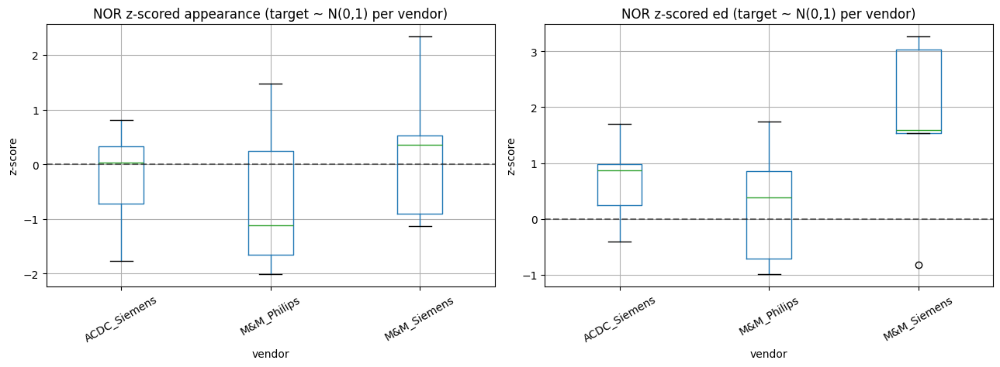


=== spread/gap: RAW (before) vs Z-SCORED (after) ===
[appearance]
  RAW: gap=+0.0119  spread=0.0264  spread/gap= 221.3%
  Z:   gap=+0.6458  spread=0.8772  spread/gap= 135.8%
[ed]
  RAW: gap=+0.0123  spread=0.0176  spread/gap= 143.3%
  Z:   gap=+0.6159  spread=1.5240  spread/gap= 247.4%

=== Per-vendor per-disease AUC AFTER z-score recalibration ===
score         appe_z        aux_z      appe_z       aux_z      appe_z  \
vendor  ACDC_Siemens ACDC_Siemens M&M_Philips M&M_Philips M&M_Siemens   
disease                                                                 
ARV              NaN          NaN         NaN         NaN       0.750   
DCM            0.625        0.438       0.694       0.735       0.514   
HCM            0.812        0.833       0.778       0.746         NaN   
HHD              NaN          NaN       0.857       0.952         NaN   
MINF           0.750        0.646         NaN         NaN         NaN   
RV             0.146        0.500         NaN         NaN       

In [ ]:
# === Recalibration step 2: z-score test patients and re-diagnose ===
# Uses calibration table `calib` and patient-level test scores `df_pt`
# from the previous cells.

calib_lut = calib.set_index('vendor')

def _zscore(score, vendor, mu_col, sd_col):
    if vendor not in calib_lut.index:
        return np.nan
    mu = calib_lut.loc[vendor, mu_col]
    sd = calib_lut.loc[vendor, sd_col]
    return (score - mu) / max(1e-9, sd)

df_pt_z = df_pt.copy()
df_pt_z['appe_z'] = df_pt_z.apply(
    lambda r: _zscore(r['appe'], r['vendor'], 'mu_appe', 'sd_appe'), axis=1)
df_pt_z['aux_z']  = df_pt_z.apply(
    lambda r: _zscore(r['aux'],  r['vendor'], 'mu_aux',  'sd_aux'),  axis=1)

# Drop test patients with no vendor-matched calibration (shouldn't happen
# if vendors are consistent between training and testing, but defensive).
n_before = len(df_pt_z)
df_pt_z = df_pt_z.dropna(subset=['appe_z', 'aux_z'])
n_dropped = n_before - len(df_pt_z)
if n_dropped:
    print(f'NOTE: dropped {n_dropped} test patients with no vendor-matched calibration.')

# --- (A) NOR-only z-distribution per vendor (sanity: should be ~0,1)
df_nor_z = df_pt_z[df_pt_z.pathology == 'NOR']
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
df_nor_z.boxplot(column='appe_z', by='vendor', ax=axes[0])
axes[0].axhline(0, color='k', linestyle='--', alpha=0.5)
axes[0].set_title('NOR z-scored appearance (target ~ N(0,1) per vendor)')
axes[0].set_ylabel('z-score')
axes[0].tick_params(axis='x', rotation=30)

df_nor_z.boxplot(column='aux_z', by='vendor', ax=axes[1])
axes[1].axhline(0, color='k', linestyle='--', alpha=0.5)
axes[1].set_title(f'NOR z-scored {AUX_NAME} (target ~ N(0,1) per vendor)')
axes[1].set_ylabel('z-score')
axes[1].tick_params(axis='x', rotation=30)
plt.suptitle('')
plt.tight_layout()
plt.show()

# --- (B) Spread/gap before vs after recalibration ------------------
print()
print('=== spread/gap: RAW (before) vs Z-SCORED (after) ===')
for col_z, col_raw, label in (('appe_z', 'appe', 'appearance'),
                               ('aux_z',  'aux',  AUX_NAME)):
    # Raw (re-derive so this cell is self-contained)
    nor_mu_r = df_pt[df_pt.pathology == 'NOR'][col_raw].mean()
    dis_mu_r = df_pt[df_pt.pathology != 'NOR'][col_raw].mean()
    means_v_r = df_pt[df_pt.pathology == 'NOR'].groupby('vendor')[col_raw].mean()
    spread_r  = means_v_r.max() - means_v_r.min()
    gap_r     = dis_mu_r - nor_mu_r
    ratio_r   = spread_r / max(1e-9, abs(gap_r))

    # Z-scored
    nor_mu_z = df_pt_z[df_pt_z.pathology == 'NOR'][col_z].mean()
    dis_mu_z = df_pt_z[df_pt_z.pathology != 'NOR'][col_z].mean()
    means_v_z = df_pt_z[df_pt_z.pathology == 'NOR'].groupby('vendor')[col_z].mean()
    spread_z  = means_v_z.max() - means_v_z.min()
    gap_z     = dis_mu_z - nor_mu_z
    ratio_z   = spread_z / max(1e-9, abs(gap_z))

    print(f'[{label}]')
    print(f'  RAW: gap={gap_r:+.4f}  spread={spread_r:.4f}  spread/gap={ratio_r:>7.1%}')
    print(f'  Z:   gap={gap_z:+.4f}  spread={spread_z:.4f}  spread/gap={ratio_z:>7.1%}')

# --- (C) Per-vendor per-disease AUC after z-scoring ----------------
print()
print('=== Per-vendor per-disease AUC AFTER z-score recalibration ===')
diseases_z  = sorted(df_pt_z[df_pt_z.pathology != 'NOR']['pathology'].unique())
vendors_l_z = sorted(df_pt_z['vendor'].unique())
rows_z = []
for v in vendors_l_z:
    sub = df_pt_z[df_pt_z.vendor == v]
    nor = sub[sub.pathology == 'NOR']
    if len(nor) < 2:
        continue
    for d in diseases_z:
        pos = sub[sub.pathology == d]
        if len(pos) < 2:
            for sc in ('appe_z', 'aux_z'):
                rows_z.append((v, d, sc, np.nan, len(nor), len(pos)))
            continue
        for sc in ('appe_z', 'aux_z'):
            y = np.r_[np.zeros(len(nor)), np.ones(len(pos))]
            s = np.r_[nor[sc].values, pos[sc].values]
            try:
                auc_z = roc_auc_score(y, s)
            except Exception:
                auc_z = np.nan
            rows_z.append((v, d, sc, auc_z, len(nor), len(pos)))

df_auc_z = pd.DataFrame(rows_z,
    columns=['vendor', 'disease', 'score', 'auc', 'n_nor', 'n_pos'])
print(df_auc_z.pivot(index='disease', columns=['score', 'vendor'], values='auc').round(3))

# --- (D) Per-disease AUC swing summary: RAW vs Z -------------------
# For each disease, mean +/- std of AUC across vendors. Smaller std after
# z-scoring means the per-vendor swing has shrunk. Higher mean is a bonus.

def _per_disease_summary(df, score_label):
    sub = df[df.score == score_label]
    summ = (sub.groupby('disease')['auc']
              .agg(mean='mean', std='std', n_vendors='count'))
    return summ

raw_appe = _per_disease_summary(df_auc,   'appe'  ).add_suffix('_raw_appe')
z_appe   = _per_disease_summary(df_auc_z, 'appe_z').add_suffix('_z_appe')
raw_aux  = _per_disease_summary(df_auc,   'aux'   ).add_suffix('_raw_aux')
z_aux    = _per_disease_summary(df_auc_z, 'aux_z' ).add_suffix('_z_aux')

swing_summary = pd.concat([raw_appe, z_appe, raw_aux, z_aux], axis=1).round(3)

print()
print('=== Per-disease AUC across vendors: RAW vs Z (mean +/- std) ===')
print(swing_summary[['mean_raw_appe', 'std_raw_appe',
                      'mean_z_appe',   'std_z_appe',
                      'mean_raw_aux',  'std_raw_aux',
                      'mean_z_aux',    'std_z_aux']])

print()
print('Reading the table:')
print('  - std drop (raw -> z) means per-vendor swing has shrunk: confound was real and removed.')
print('  - mean rise (raw -> z) means recalibration uncovered disease signal hidden under offset.')
print('  - std stays high after z -> residual non-offset vendor effect (e.g. vendor-specific texture).')
print('  - mean drop after z -> the raw AUC was inflated by vendor imbalance, not real disease signal.')


## Skip-Connection Copy Check (RGB next-frame)

Cardiac cine frames change very little between consecutive timesteps. A
U-Net-style auxiliary head can exploit its skip connections to "predict"
the next frame by passing the current frame through almost unchanged, so
`loss_aux` stays low without the model ever learning motion. The cells
below test three signals for that failure mode.

Assumes `images` / `aux_targets` / `recon_aux` / `df` are the test-set
arrays from the cell-6 `run_evaluation` call. Re-run cell 6 first if you
have since overwritten them.

  - **(1) Identity baseline** -- what `loss_aux` would be if the model
    emitted the input frame verbatim. If the model's `loss_aux` is close
    to identity, it is copying.
  - **(3) Copy similarity**  -- MSE / SSIM of prediction vs INPUT and
    prediction vs TARGET, split by NOR / non-NOR. If pred is closer to
    input than to target, that is direct evidence of copying.
  - **(2) Visual diff maps** -- 3 NOR + 3 non-NOR samples shown as
    input | target | pred | |pred - input| | |target - input|. A nearly
    black column 4 next to a structured column 5 means the model
    reproduced the input instead of predicting motion.


In [ ]:
# === Skip-connection copy check: numbers ============================
# (1) identity baseline vs model loss_aux, (3) MSE/SSIM(pred, input)
# vs MSE/SSIM(pred, target). Uses the training-matched _per_sample_losses
# so numbers are directly comparable to mu_aux from W&B / mu_baseline_*.json.
import numpy as np
import pandas as pd
from skimage.metrics import structural_similarity as ssim

assert MODEL_TYPE == 'rgb' and FRAME_MODE == 'next_frame', (
    "Copy check only makes sense for rgb + next_frame "
    "(aux target IS a frame so 'identity' = 'output the input')."
)

for _name in ('images', 'aux_targets', 'recon_aux', 'df'):
    assert _name in dir(), f"{_name} missing -- re-run cell 6 (run_evaluation) first."

n = len(images)
rows = []
for i in range(n):
    inp = images[i]            # input frame (current)
    tgt = aux_targets[i]       # ground-truth next frame
    prd = recon_aux[i]         # model's predicted next frame
    # Training-matched aux loss with pr_aux = input (= identity copy).
    _, ident_loss = _per_sample_losses(inp, inp, tgt, inp, 'rgb')
    rows.append({
        'sample_idx':       i,
        'label':            df.loc[i, 'label'],
        'identity_loss_aux': ident_loss,
        'mse_pred_input':   float(np.mean((prd - inp) ** 2)),
        'mse_pred_target':  float(np.mean((prd - tgt) ** 2)),
        'mse_input_target': float(np.mean((inp - tgt) ** 2)),  # motion magnitude
        'ssim_pred_input':  float(ssim(prd, inp, data_range=1.0, channel_axis=-1)),
        'ssim_pred_target': float(ssim(prd, tgt, data_range=1.0, channel_axis=-1)),
    })
copy_df = pd.DataFrame(rows)
# Pull the model's per-sample loss_aux straight from the eval df (same units).
copy_df['model_loss_aux'] = df['loss_aux_full'].values
copy_df['is_nor']         = copy_df['label'] == 'NOR'


def _summary(sub, title):
    if len(sub) == 0:
        print(f'--- {title}: (empty) ---'); return
    ml = sub['model_loss_aux'].mean()
    il = sub['identity_loss_aux'].mean()
    ratio = ml / max(il, 1e-9)
    print(f'--- {title} (n={len(sub)}) ---')
    print(f'  loss_aux (training metric):  model={ml:.4f}   identity={il:.4f}'
          f'   ratio model/identity = {ratio:.2f}x')
    print(f'  MSE(pred, input ) = {sub["mse_pred_input"].mean():.4f}')
    print(f'  MSE(pred, target) = {sub["mse_pred_target"].mean():.4f}')
    print(f'  MSE(input,target) = {sub["mse_input_target"].mean():.4f}'
          f'   (motion magnitude -- if tiny, identity is a strong baseline)')
    print(f'  SSIM(pred, input ) = {sub["ssim_pred_input"].mean():.4f}')
    print(f'  SSIM(pred, target) = {sub["ssim_pred_target"].mean():.4f}')
    adv = sub['ssim_pred_input'].mean() - sub['ssim_pred_target'].mean()
    print(f'  SSIM advantage (input - target) = {adv:+.4f}'
          f'   (positive => pred resembles input more than target)')


print('=' * 72)
print('Skip-connection copy check -- numbers')
print('=' * 72)
_summary(copy_df,                     'ALL samples')
_summary(copy_df[copy_df['is_nor']],  'NOR only')
_summary(copy_df[~copy_df['is_nor']], 'Non-NOR (any pathology)')

print()
print('Reading the numbers:')
print('  - ratio model/identity << 1.0  => model genuinely beats identity (learning motion).')
print('  - ratio model/identity ~  1.0  => model ~ identity copy: skip connections are cheating.')
print('  - SSIM(pred,input) > SSIM(pred,target) AND MSE(pred,input) << MSE(pred,target) => copy.')
print('  - On NOR motion is smallest, so identity is hardest to beat there -- weigh non-NOR more.')


Skip-connection copy check -- numbers
--- ALL samples (n=7854) ---
  loss_aux (training metric):  model=0.0301   identity=0.0297   ratio model/identity = 1.02x
  MSE(pred, input ) = 0.0000
  MSE(pred, target) = 0.0003
  MSE(input,target) = 0.0003   (motion magnitude -- if tiny, identity is a strong baseline)
  SSIM(pred, input ) = 0.9941
  SSIM(pred, target) = 0.9802
  SSIM advantage (input - target) = +0.0139   (positive => pred resembles input more than target)
--- NOR only (n=1225) ---
  loss_aux (training metric):  model=0.0293   identity=0.0291   ratio model/identity = 1.01x
  MSE(pred, input ) = 0.0000
  MSE(pred, target) = 0.0003
  MSE(input,target) = 0.0003   (motion magnitude -- if tiny, identity is a strong baseline)
  SSIM(pred, input ) = 0.9955
  SSIM(pred, target) = 0.9813
  SSIM advantage (input - target) = +0.0142   (positive => pred resembles input more than target)
--- Non-NOR (any pathology) (n=6629) ---
  loss_aux (training metric):  model=0.0303   identity=0.0298   

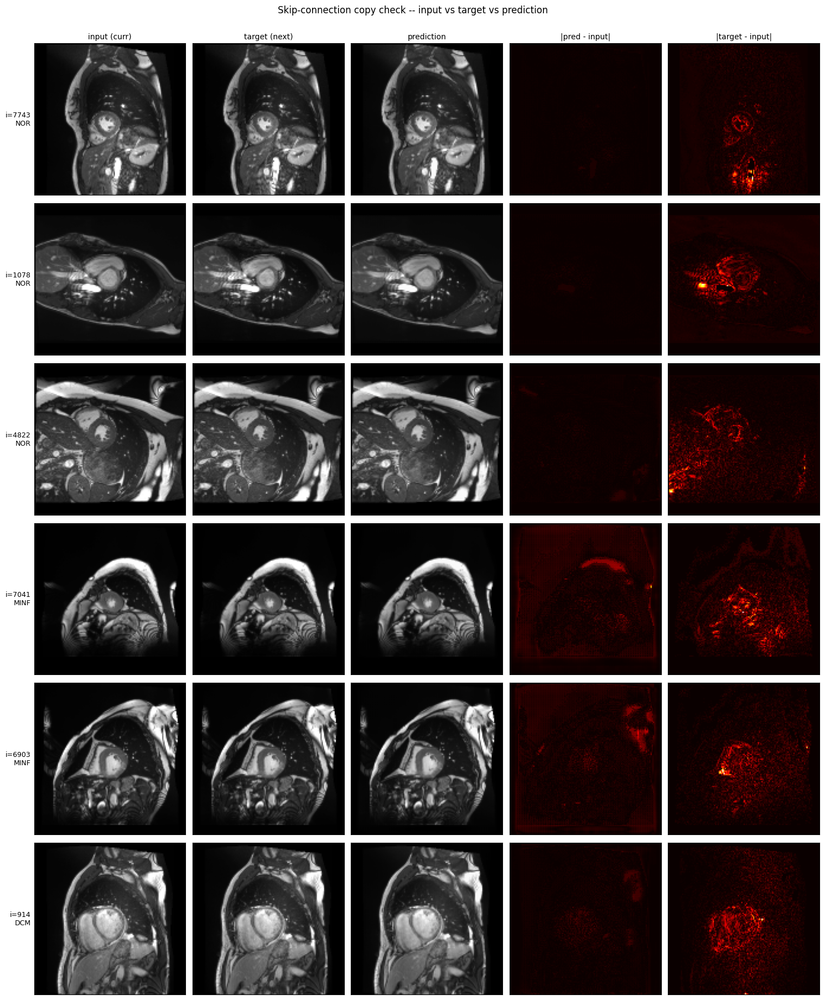

           label  model_loss_aux  identity_loss_aux  mse_pred_input  \
sample_idx                                                            
7743         NOR          0.0436             0.0440             0.0   
1078         NOR          0.0371             0.0368             0.0   
4822         NOR          0.0455             0.0459             0.0   
7041        MINF          0.0128             0.0113             0.0   
6903        MINF          0.0150             0.0127             0.0   
914          DCM          0.0298             0.0296             0.0   

            mse_pred_target  ssim_pred_input  ssim_pred_target  
sample_idx                                                      
7743                 0.0008           0.9977            0.9380  
1078                 0.0010           0.9984            0.9337  
4822                 0.0005           0.9987            0.9736  
7041                 0.0000           0.9814            0.9736  
6903                 0.0000           0.9

In [ ]:
# === Skip-connection copy check: visual =============================
# 3 NOR + 3 non-NOR samples, 5 panels per row:
#   input | target (next) | prediction | |pred - input| | |target - input|
# Diff panels share a colour scale per row. If column 4 is mostly black
# while column 5 shows structured motion, the model is copying.
import matplotlib.pyplot as plt
import numpy as np

_rng = np.random.RandomState(0)
nor_pool      = copy_df[copy_df['is_nor']]
non_nor_pool  = copy_df[~copy_df['is_nor']]
nor_idx       = nor_pool.sample(min(3, len(nor_pool)),         random_state=_rng)['sample_idx'].tolist()
non_nor_idx   = non_nor_pool.sample(min(3, len(non_nor_pool)), random_state=_rng)['sample_idx'].tolist()
picks         = nor_idx + non_nor_idx
col_titles    = ['input (curr)', 'target (next)', 'prediction',
                 '|pred - input|', '|target - input|']

n_rows = len(picks)
fig, axes = plt.subplots(n_rows, 5, figsize=(15, 3 * n_rows))
if n_rows == 1:
    axes = axes[None, :]
for r, i in enumerate(picks):
    inp = images[i]
    tgt = aux_targets[i]
    prd = recon_aux[i]
    diff_pi = np.abs(prd - inp)
    diff_ti = np.abs(tgt - inp)
    vmax    = float(max(diff_pi.max(), diff_ti.max(), 1e-3))   # shared per-row scale
    panels  = [inp, tgt, prd, diff_pi, diff_ti]
    for c, (img, title) in enumerate(zip(panels, col_titles)):
        ax = axes[r, c]
        if c < 3:
            ax.imshow(np.clip(img, 0, 1))
        else:
            ax.imshow(img.mean(-1) if img.ndim == 3 else img,
                      cmap='hot', vmin=0, vmax=vmax)
        ax.set_xticks([]); ax.set_yticks([])
        if r == 0:
            ax.set_title(title, fontsize=10)
        if c == 0:
            tag = f"i={i}\n{df.loc[i, 'label']}"
            ax.set_ylabel(tag, rotation=0, ha='right', va='center', fontsize=9)

plt.suptitle('Skip-connection copy check -- input vs target vs prediction',
             fontsize=12, y=1.001)
plt.tight_layout()
plt.show()

# Per-sample table for the chosen rows -- useful when the eye is fooled.
_view = copy_df.set_index('sample_idx').loc[picks][
    ['label', 'model_loss_aux', 'identity_loss_aux',
     'mse_pred_input', 'mse_pred_target',
     'ssim_pred_input', 'ssim_pred_target']
].round(4)
print(_view)


### No-Model Baseline AUC

If the model is copying the input, then `loss_aux` is essentially
`MSE+grad(input, target)` -- the raw inter-frame motion magnitude.
That feature requires no model at all. The cell below scores the test
set with raw motion and compares its AUC to the trained model's aux AUC.

  - **Gap <= ~0.01**: the trained aux head is delivering exactly what a
    one-line baseline delivers. Any aux-head AUC you report is a wrapper
    around raw motion, not learned signal.
  - **Gap > a few %**: the model is adding something on top of raw motion.
  - Negative gap (baseline > model): the model is *harming* the signal.

Also reports per-disease AUCs (one-vs-NOR) so you can see which classes
the motion baseline already separates.


In [ ]:
# === No-model AUC baseline ==========================================
# Score the test set with raw inter-frame motion (MSE + gradient term,
# rescaled to [-1, 1] to match the training loss units). No checkpoint
# loaded, no inference, no learning. Then compare to the trained aux AUC.
import numpy as np
from sklearn.metrics import roc_auc_score

assert MODEL_TYPE == 'rgb' and FRAME_MODE == 'next_frame', (
    "Baseline AUC only makes sense for rgb + next_frame."
)
for _name in ('images', 'aux_targets', 'df'):
    assert _name in dir(), f"{_name} missing -- re-run cell 6 first."

n = len(images)
raw_motion = np.empty(n, dtype=np.float64)
for i in range(n):
    gt_s = 2.0 * images[i]      - 1.0
    pr_s = 2.0 * aux_targets[i] - 1.0   # "pred = input", so target is what differs
    inten = float(np.mean((gt_s - pr_s) ** 2))
    grad  = _gradient_loss_np(gt_s, pr_s)
    raw_motion[i] = inten + grad

y          = (df['label'] != 'NOR').astype(int).values
model_aux  = df['loss_aux_full'].values
model_appe = df['loss_appe_full'].values

auc_raw      = roc_auc_score(y, raw_motion)
auc_model_ax = roc_auc_score(y, model_aux)
auc_model_ap = roc_auc_score(y, model_appe)

print('=' * 72)
print('No-model baseline AUC vs trained model AUC  (binary NOR vs all pathologies)')
print('=' * 72)
print(f'  Raw inter-frame motion (NO MODEL):       AUC = {auc_raw:.4f}')
print(f'  Trained aux head (loss_aux_full):        AUC = {auc_model_ax:.4f}')
print(f'  Trained appearance head (loss_appe_full):AUC = {auc_model_ap:.4f}')
gap = auc_model_ax - auc_raw
print()
print(f'  Gap (model aux - no-model baseline):  {gap:+.4f}')
if abs(gap) < 0.01:
    verdict = 'aux head adds ~nothing beyond the free motion feature.'
elif gap < 0:
    verdict = 'aux head is WORSE than raw motion -- the network is hurting the signal.'
else:
    verdict = 'aux head adds some learned signal on top of raw motion.'
print(f'  Verdict: {verdict}')

# Sanity: how strongly correlated are model aux and raw motion?
corr = float(np.corrcoef(raw_motion, model_aux)[0, 1])
print(f'  Pearson corr(raw_motion, model_aux) = {corr:.4f}'
      f"   (->1.0 means the aux head IS raw motion)")

# Per-disease one-vs-NOR for the no-model baseline (compare to W&B
# Val_AUC_<DISEASE>_ED / _Flow you logged during training).
print()
print('--- Per-disease one-vs-NOR AUC: raw motion vs model aux ---')
nor_mask = df['label'] == 'NOR'
for dz in sorted(df.loc[~nor_mask, 'label'].unique()):
    sub_mask = nor_mask | (df['label'] == dz)
    y_dz     = (df.loc[sub_mask, 'label'] != 'NOR').astype(int).values
    raw_dz   = raw_motion[sub_mask.values]
    aux_dz   = model_aux[sub_mask.values]
    if y_dz.sum() < 2 or (y_dz == 0).sum() < 2:
        continue
    a_raw = roc_auc_score(y_dz, raw_dz)
    a_aux = roc_auc_score(y_dz, aux_dz)
    print(f'  {dz:<6}  raw={a_raw:.4f}   model_aux={a_aux:.4f}   '
          f'gap={a_aux - a_raw:+.4f}')


No-model baseline AUC vs trained model AUC  (binary NOR vs all pathologies)
  Raw inter-frame motion (NO MODEL):       AUC = 0.5098
  Trained aux head (loss_aux_full):        AUC = 0.5197
  Trained appearance head (loss_appe_full):AUC = 0.5960

  Gap (model aux - no-model baseline):  +0.0100
  Verdict: aux head adds ~nothing beyond the free motion feature.
  Pearson corr(raw_motion, model_aux) = 0.9990   (->1.0 means the aux head IS raw motion)

--- Per-disease one-vs-NOR AUC: raw motion vs model aux ---
  DCM     raw=0.3640   model_aux=0.3860   gap=+0.0220
  HCM     raw=0.6216   model_aux=0.6295   gap=+0.0080
  MINF    raw=0.5787   model_aux=0.5827   gap=+0.0040
  RV      raw=0.4485   model_aux=0.4562   gap=+0.0077


## Synthetic Anomaly Injection (black square)

Sanity-check what the trained model does when a clearly *out-of-distribution*
patch is dropped into a **normal** test image you choose. The cell loads **only
that one slice** and runs inference on just that frame (plus its squared copy) —
it does **not** re-run the full test set.

**What to expect** — this is the whole premise of reconstruction-based anomaly
detection:

- **Appearance head** (no skip connections, must pass through the bottleneck):
  it has only ever seen healthy hearts, so it cannot reconstruct the square →
  the **appearance error map lights up exactly where the square is**, and
  `loss_appe_full` / `combined_paper` rise above the training-NOR baseline.
- **Auxiliary head** (ED-frame or next-frame prediction, *with* skip
  connections): the skips copy low-level input detail through, so the square
  often partially leaks into the prediction — compare the two error maps.

**Choosing the image** — edit the config at the top of the cell:
`DATASET` (`'ACDC'` or `'MM'`), `PATIENT` (`None` = first NOR patient, or a
patient id — the cell prints the available NOR list), `SLICE` (`None` = middle
z-slice). Square: `SQ_SIZE`, `SQ_CY`, `SQ_CX`, `SQ_VALUE` (`0.0` = black).

**Prerequisites** — only the *fast* cells: the setup cell (TF1 shim +
`GAN_tf`/`GAN_tf_rgb`), the paths cell (`acdc_dir`, `mm_*`), the shared-helpers
cell (`run_tf_inference`, `_preprocess_slice`, `_scan_acdc_test_split`,
`_per_sample_losses`, `flow_to_color`), and the **Evaluation configuration** cell
(`MODEL_TYPE`, `MODEL_DATASET`, `MODEL_EPOCH`, `FRAME_MODE`, `TARGET_SIZE`). You
do **not** need to run the `run_evaluation` cell. The experiment uses whichever
model is configured — RGB ED/ES, RGB next-frame, or flow.


Loaded ACDC patient107  (NOR)  z=4/8  t=4 -> 5  T=30

ACDC NOR patients you can set PATIENT to (10 total):
  patient102, patient107, patient110, patient123, patient125, patient128, patient130, patient139, patient144, patient150
INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_RGB_NOR_v1_orient_spacing_added/model_ckpt_50.ckpt
Model loaded from ./training_saver/ACDC_MM_RECON_NEXT_FRAME_SYSTOLE_RGB_NOR_v1_orient_spacing_added/model_ckpt_50.ckpt
  Batch 1/1 done
Inference complete.

  score                      clean   anomalous         delta
  ----------------------------------------------------------
  loss_appe_full            0.0406      0.0435        0.0029
  loss_aux_full             0.0364      0.0491        0.0127
  combined_paper            0.1170      0.4307        0.3137
  ----------------------------------------------------------
  training-NOR baseline:  mu_appe=0.0312  mu_aux=0.0341


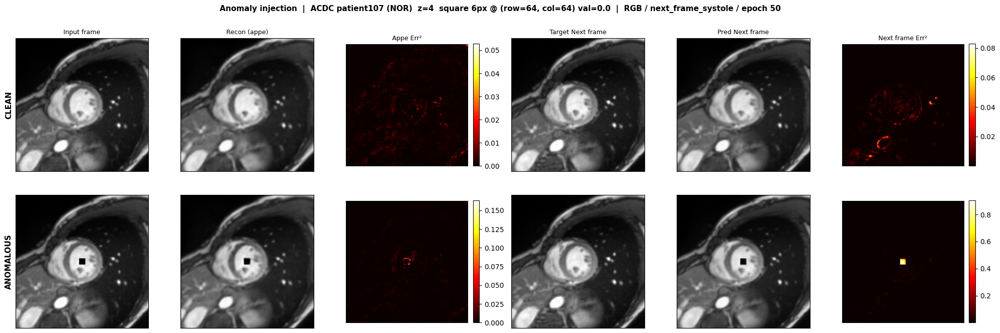

In [10]:
# =============================================================================
# Synthetic anomaly injection (self-contained) — pick ONE normal test image,
# insert a black square, and compare the model's reconstruction + ED/next-frame
# prediction: clean vs anomalous. Loads ONLY the single chosen slice and runs
# inference on just that frame (+ its squared copy) — NO full-test-set pass.
# =============================================================================

# ---- 1. choose the normal image --------------------------------------------
DATASET = 'ACDC'       # 'ACDC' | 'MM'   (which dataset to pull a NOR slice from)
PATIENT = 'patient107'        # None -> first NOR patient; or a patient/subject id (str)
SLICE   = None         # None -> middle z-slice;    or an int z-index
NF_T    = None         # next_frame mode only: input frame t (pair = t -> t+1);
                       #   None -> middle frame

# ---- 2. the black-square anomaly -------------------------------------------
SQ_SIZE  = 6          # square side length, pixels
SQ_CY    = 64          # square centre row    (0..127); ~64 = image centre / heart
SQ_CX    = 64          # square centre column (0..127)
SQ_VALUE = 0.0         # 0.0 = black ; try 1.0 = white, 0.5 = grey

# ---------------------------------------------------------------------------
import os, json as _json
import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt

for _n in ('MODEL_TYPE', 'MODEL_DATASET', 'MODEL_EPOCH', 'FRAME_MODE', 'TARGET_SIZE'):
    if _n not in globals():
        raise NameError(f"`{_n}` is not defined — run the Evaluation-configuration cell first.")

# ---- load ONE normal slice (matches the training loaders' preprocessing) ---
def _load_one_normal(dataset, patient, z_slice):
    if dataset == 'ACDC':
        if 'acdc_dir' not in globals():
            raise NameError("`acdc_dir` not defined — run the paths cell.")
        testing = os.path.join(acdc_dir, 'database', 'testing')
        _set, info = _scan_acdc_test_split(testing)
        nor = sorted(p for p, d in info.items() if d.get('Group') == 'NOR')
        if not nor:
            raise RuntimeError(f"No ACDC NOR patients found under {testing}")
        pid = patient if patient is not None else nor[0]
        if pid not in info or info[pid].get('Group') != 'NOR':
            raise ValueError(f"{pid!r} is not an ACDC NOR patient. Options: {nor}")
        ed = int(info[pid]['ED']) - 1          # ACDC Info.cfg is 1-based
        es = int(info[pid]['ES']) - 1
        arr = _read_volume_oriented(os.path.join(testing, pid, f'{pid}_4d.nii.gz'))
        src, options = 'ACDC', nor
    elif dataset == 'MM':
        import pandas as pd
        if 'mm_csv_path' not in globals():
            raise NameError("`mm_csv_path` not defined — run the paths cell.")
        search_dirs = [d for d in (globals().get('mm_testing_dir'),
                                   globals().get('mm_training_dir'),
                                   globals().get('mm_val_dir')) if d]
        dfl = pd.read_csv(mm_csv_path)
        look = {r['External code']: (int(r['ED']), int(r['ES']), r['Pathology'])
                for _, r in dfl.iterrows()}
        def _find(sid):
            for d in search_dirs:
                p = os.path.join(d, f'{sid}_sa.nii.gz')
                if os.path.exists(p):
                    return p
            return None
        nor = sorted(sid for sid, v in look.items()
                     if v[2] == 'NOR' and _find(sid) is not None)
        if not nor:
            raise RuntimeError("No M&M NOR subjects with a _sa.nii.gz in the configured dirs.")
        pid = patient if patient is not None else nor[0]
        if pid not in look:
            raise ValueError(f"{pid!r} not in the M&M CSV. NOR options: {nor}")
        ed, es, _ = look[pid]                  # M&M CSV is already 0-based
        arr = _read_volume_oriented(_find(pid))
        src, options = 'MM', nor
    else:
        raise ValueError("DATASET must be 'ACDC' or 'MM'")

    T, Z = arr.shape[0], arr.shape[1]
    z = int(np.clip(z_slice if z_slice is not None else Z // 2, 0, Z - 1))
    if FRAME_MODE in ('next_frame', 'next_frame_systole'):
        if FRAME_MODE == 'next_frame_systole':
            if es <= 0:
                raise RuntimeError(f"{pid}: ES({es}) <= 0; no systolic next-frame pair.")
            _lo, _hi = (ed if ed < es else 0), min(es - 1, T - 2)          # input t in [ED, ES-1], t+1 valid
            _default_t = (_lo + _hi) // 2
        else:
            _lo, _hi = 0, T - 2
            _default_t = T // 2
        if _hi < _lo:
            raise RuntimeError(f"{pid}: no valid next-frame pair in [{_lo}, {_hi}].")
        t = int(np.clip(NF_T if NF_T is not None else _default_t, _lo, _hi))
        t_in, t_out, pair_desc = t, t + 1, f't={t} -> {t + 1}'
    else:
        t_in, t_out, pair_desc = es, ed, f'ES={es} -> ED={ed}'      # input ES, target ED
    res = _preprocess_slice(arr, z, t_in, t_out, TARGET_SIZE, MODEL_TYPE, frame_mode=FRAME_MODE)
    if res is None:
        raise RuntimeError(f"Slice z={z} of {pid} was filtered out (frames nearly "
                           "identical / flow failed). Pick a different SLICE.")
    clean_in, aux_target = res
    meta = dict(pid=pid, source=src, z=z, Z=Z, T=T, ed=ed, es=es,
                pair=pair_desc, options=options)
    return clean_in.astype(np.float32), aux_target.astype(np.float32), meta

clean_in, aux_target, meta = _load_one_normal(DATASET, PATIENT, SLICE)
print(f"Loaded {meta['source']} {meta['pid']}  (NOR)  z={meta['z']}/{meta['Z'] - 1}  "
      f"{meta['pair']}  T={meta['T']}")
print(f"\n{DATASET} NOR patients you can set PATIENT to ({len(meta['options'])} total):")
print('  ' + ', '.join(map(str, meta['options'][:30]))
      + (' ...' if len(meta['options']) > 30 else ''))

# ---- inject the black square -----------------------------------------------
anom_in = clean_in.copy()
_r0, _r1 = max(0, SQ_CY - SQ_SIZE // 2), min(clean_in.shape[0], SQ_CY + SQ_SIZE // 2)
_c0, _c1 = max(0, SQ_CX - SQ_SIZE // 2), min(clean_in.shape[1], SQ_CX + SQ_SIZE // 2)
anom_in[_r0:_r1, _c0:_c1, :] = SQ_VALUE

# ---- run the configured model on both frames (one tiny 2-image batch) ------
_mod  = GAN_tf if MODEL_TYPE == 'flow' else GAN_tf_rgb
_ckpt = f'./training_saver/{MODEL_DATASET}/model_ckpt_{MODEL_EPOCH}.ckpt'
_recon, _auxp = run_tf_inference(np.stack([clean_in, anom_in]).astype(np.float32),
                                 _mod, _ckpt, rescale_aux=(MODEL_TYPE == 'rgb'))
recon_clean, recon_anom = _recon[0], _recon[1]
auxp_clean,  auxp_anom  = _auxp[0], _auxp[1]

# ---- training-NOR baseline (read cached JSON if present; no inference) ------
_mu_path = f'./training_saver/{MODEL_DATASET}/mu_baseline_{MODEL_EPOCH}.json'
if os.path.exists(_mu_path):
    _d = _json.load(open(_mu_path)); mu_appe = float(_d['mu_appe']); mu_aux = float(_d['mu_aux'])
else:
    mu_appe = mu_aux = None
    print(f"(no {_mu_path} — combined_paper score skipped)")

def _score(gt_img, pr_img, pr_aux):
    appe, aux = _per_sample_losses(gt_img, pr_img, aux_target, pr_aux, MODEL_TYPE)
    if mu_appe is None:
        return appe, aux, float('nan')
    comb = (np.log(max(aux,  1e-10) / max(mu_aux,  1e-10)) +
            0.2 * np.log(max(appe, 1e-10) / max(mu_appe, 1e-10)))
    return appe, aux, comb

_ca, _cx, _cc = _score(clean_in, recon_clean, auxp_clean)
_aa, _ax, _ac = _score(anom_in,  recon_anom,  auxp_anom)
print(f"\n{'='*62}")
print(f"  {'score':<20}{'clean':>12}{'anomalous':>12}{'delta':>14}")
print(f"  {'-'*58}")
print(f"  {'loss_appe_full':<20}{_ca:12.4f}{_aa:12.4f}{_aa-_ca:14.4f}")
print(f"  {'loss_aux_full':<20}{_cx:12.4f}{_ax:12.4f}{_ax-_cx:14.4f}")
print(f"  {'combined_paper':<20}{_cc:12.4f}{_ac:12.4f}{_ac-_cc:14.4f}")
print(f"  {'-'*58}")
if mu_appe is not None:
    print(f"  training-NOR baseline:  mu_appe={mu_appe:.4f}  mu_aux={mu_aux:.4f}")
print(f"{'='*62}")

# ---- visualise:  rows = clean / anomalous,  6 columns ----------------------
if FRAME_MODE in ('next_frame', 'next_frame_systole'):
    _aux_name, _in_name = 'Next frame', 'Input frame'
elif MODEL_TYPE == 'flow':
    _aux_name, _in_name = 'Flow', 'Input ES'
else:
    _aux_name, _in_name = 'ED', 'Input ES'

def _show_aux(ax, arr):
    if MODEL_TYPE == 'flow':
        ax.imshow(np.clip(flow_to_color(arr), 0.0, 1.0))
    else:
        ax.imshow(np.clip(arr, 0.0, 1.0), cmap='gray')

_titles = [_in_name, 'Recon (appe)', 'Appe Err²',
           f'Target {_aux_name}', f'Pred {_aux_name}', f'{_aux_name} Err²']
fig, ax = plt.subplots(2, 6, figsize=(20, 7))
for r, (tag, gin, grec, gaux) in enumerate([
        ('CLEAN',     clean_in, recon_clean, auxp_clean),
        ('ANOMALOUS', anom_in,  recon_anom,  auxp_anom)]):
    appe_err = np.mean((gin - grec) ** 2, axis=-1)
    aux_err  = np.mean((aux_target - gaux) ** 2, axis=-1)
    ax[r, 0].imshow(np.clip(gin,  0.0, 1.0), cmap='gray')
    ax[r, 1].imshow(np.clip(grec, 0.0, 1.0), cmap='gray')
    _im2 = ax[r, 2].imshow(appe_err, cmap='hot')
    fig.colorbar(_im2, ax=ax[r, 2], fraction=0.046, pad=0.04)
    _show_aux(ax[r, 3], aux_target)
    _show_aux(ax[r, 4], gaux)
    _im5 = ax[r, 5].imshow(aux_err, cmap='hot')
    fig.colorbar(_im5, ax=ax[r, 5], fraction=0.046, pad=0.04)
    for c in range(6):
        if r == 0:
            ax[r, c].set_title(_titles[c], fontsize=9)
        ax[r, c].set_xticks([]); ax[r, c].set_yticks([])
    ax[r, 0].set_ylabel(tag, fontsize=11, fontweight='bold')

plt.suptitle(
    f"Anomaly injection  |  {meta['source']} {meta['pid']} (NOR)  z={meta['z']}  "
    f"square {SQ_SIZE}px @ (row={SQ_CY}, col={SQ_CX}) val={SQ_VALUE}  |  "
    f"{MODEL_TYPE.upper()} / {FRAME_MODE} / epoch {MODEL_EPOCH}",
    fontweight='bold', fontsize=11)
plt.tight_layout(); plt.show()

## Comprehensive Score-Way x Aggregation AUC Sweep (single model)

For the checkpoint set in the **Evaluation configuration** cell (`MODEL_DATASET` / `MODEL_EPOCH` /
`MODEL_TYPE`), this section sweeps every anomaly-score recipe and reports which one separates
healthy (NOR) from diseased best, on the ACDC(val+test) + M&M(val+test) pool.

**Candidate scores**
- The **10 score-estimation-ways** that `utils.calc_measures_single_item` computes per frame --
  `PSNR_X, PSNR_inv, PSNR, SSIM, MSE, maxSE, std, MSE_1c, maxSE_1c, std_1c` -- applied to **each
  error stream**: appearance + flow + flow-angle + flow-magnitude (flow model), or appearance +
  predicted-frame (rgb model).
- The paper's **combined formula**, both the full-frame 2:1 (`utils.py:339`,
  `log(appe/mu) + 2*log(aux/mu)`) and the patch eq-8 5:1 (`log(aux/mu) + 0.2*log(appe/mu)`).

**Scoring granularity** -- per-frame, and per-patient by **mean / max / top-20%** -- each broken
out **per dataset (ACDC vs M&M)** and **per disease (each vs NOR)**.

**Two evaluation modes** -- *pooled* (score over val+test: optimistic upper bound) and *honest*
(pick the best recipe on the validation split, report it on the held-out test split).

> Notes. PSNR_X / PSNR_inv / PSNR / MSE are monotonic in per-frame MSE, so they give the *same*
> frame-level AUC; they diverge only after mean / top-20% patient aggregation. In `ed_es` mode a
> patient has only ~1-3 samples, so top-20% is effectively max. PSNR/SSIM ways are negated so that
> "higher = more anomalous" holds for every column (mirrors `utils.flip_scores`). The `_1c`
> (single-channel-sum) ways are degenerate (constant) for the 2-D angle/mag streams and will read
> AUC ~ 0.5.
>
> Run cells 0-2 (imports + helper defs) and the Evaluation-configuration cell first; this section
> is otherwise self-contained and reuses `run_tf_inference`, `_per_sample_losses`, `get_mu_baseline`.

In [30]:
# === Rich per-sample score table: 10 utils ways x every stream + paper combined =============
# Self-contained: needs cells 0-2 (defs) and the Evaluation-configuration cell (MODEL_*, paths).
import importlib
import numpy as np
import pandas as pd
import utils
from skimage.metrics import structural_similarity as ssim

WAY_NAMES = ['PSNR_X', 'PSNR_inv', 'PSNR', 'SSIM', 'MSE', 'maxSE', 'std',
             'MSE_1c', 'maxSE_1c', 'std_1c']
# utils.flip_scores inverts PSNR_X / PSNR / SSIM (higher = better). We negate those so every
# candidate column reads "higher = more anomalous" (rank-equivalent to 1/x, robust to zeros).
FLIP_WAYS = {'PSNR_X', 'PSNR', 'SSIM'}


def _calc_measures(item_true, item_hat, max_val_hat):
    # Re-implementation of utils.calc_measures_single_item (nested in utils -> not importable).
    # Returns the 10 ways in utils order for one (true, hat) image pair.
    se = (item_true - item_hat) ** 2
    psnr_x   = 10 * np.log10(np.max(item_hat) ** 2 / np.mean(se))
    psnr_inv = np.max(item_hat) ** 2 * np.mean(se)
    psnr     = 10 * np.log10(max_val_hat ** 2 / np.mean(se))
    is_mc    = len(item_true.shape) == 3 and item_true.shape[-1] > 1
    _ssim    = ssim(item_true, item_hat,
                    data_range=np.max([item_true, item_hat]) - np.min([item_true, item_hat]),
                    channel_axis=-1 if is_mc else None)
    mse, maxse, std = np.mean(se), np.max(se), np.std(se)
    if se.ndim == 3:
        mse1, maxse1, std1 = np.mean(np.sum(se, -1)), np.max(np.sum(se, -1)), np.std(np.sum(se, -1))
    else:
        mse1 = maxse1 = std1 = -1.0
    return np.array([psnr_x, psnr_inv, psnr, _ssim, mse, maxse, std, mse1, maxse1, std1])


def _streams_for_sample(gi, pi, gx, px, model_type):
    # dict stream-name -> (10,) way vector. Flow uses utils' paper function (4 streams).
    if model_type == 'flow':
        arr = utils.calc_anomaly_score_one_frame(gi, pi, gx, px)  # (4,10): appe, flow, angle, mag
        return {'appe': arr[0], 'flow': arr[1], 'angle': arr[2], 'mag': arr[3]}
    return {'appe': _calc_measures(gi, pi, 1.0), 'aux': _calc_measures(gx, px, 1.0)}


# -- load ACDC / M&M val+test, keeping the split tag (cell 7 concatenates and drops it) --------
_dl = importlib.import_module('data_loader_rgb' if MODEL_TYPE == 'rgb' else 'data_loader')
# es_ed reuses the ed_es loaders but flips the model-input phase to ED (mirrors run_model.py:192).
_dl.set_edes_direction('ed' if FRAME_MODE == 'es_ed' else 'es')
_loader_fm = 'ed_es' if FRAME_MODE == 'es_ed' else FRAME_MODE
_p1_parts, _p2_parts = [], []
_labels, _pids, _source, _slcs, _split = [], [], [], [], []


def _add(p1, p2, lbls, pids, sids, src, split):
    _p1_parts.append(np.asarray(p1)); _p2_parts.append(np.asarray(p2))
    _labels.extend(list(lbls)); _pids.extend(list(pids)); _slcs.extend(list(sids))
    _source.extend([src] * len(lbls)); _split.extend([split] * len(lbls))


if 'ACDC' in DATASETS:
    if _loader_fm == 'ed_es':
        _ld, _kw = _dl.load_acdc_test_val_ed_es_data, {}
    else:
        _ld, _kw = _dl.load_acdc_test_val_data, {'restrict_to_systole': _loader_fm == 'next_frame_systole'}
    (_vp1, _vp2, _vl, _vpid, _vsid, _tp1, _tp2, _tl, _tpid, _tsid) = _ld(acdc_dir, **_kw)
    _add(_vp1, _vp2, _vl, _vpid, _vsid, 'ACDC', 'val')
    _add(_tp1, _tp2, _tl, _tpid, _tsid, 'ACDC', 'test')

if 'MM' in DATASETS:
    if _loader_fm == 'ed_es':
        _mv = _dl.load_mm_validation_ed_es_data(mm_val_dir, mm_csv_path, TARGET_SIZE)
        _mt = _dl.load_mm_testing_ed_es_data(mm_testing_dir, mm_csv_path, TARGET_SIZE)
    else:
        _sys = _loader_fm == 'next_frame_systole'
        _mv = _dl.load_mm_validation_data(mm_val_dir, mm_csv_path, TARGET_SIZE, restrict_to_systole=_sys)
        _mt = _dl.load_mm_validation_data(mm_testing_dir, mm_csv_path, TARGET_SIZE, restrict_to_systole=_sys)
    _add(_mv[0], _mv[1], _mv[2], _mv[3], _mv[4], 'MM', 'val')
    _add(_mt[0], _mt[1], _mt[2], _mt[3], _mt[4], 'MM', 'test')

_p1 = np.concatenate(_p1_parts, axis=0)
_p2 = np.concatenate(_p2_parts, axis=0)
print(f'Pool: {len(_p1)} frame pairs / {len(set(zip(_source, _pids)))} patients  '
      f'(val={_split.count("val")}, test={_split.count("test")})')

# -- one inference pass (run_tf_inference resets the TF graph internally) ----------------------
_model = GAN_tf if MODEL_TYPE == 'flow' else GAN_tf_rgb
_ckpt = './training_saver/' + MODEL_DATASET + '/model_ckpt_' + str(MODEL_EPOCH) + '.ckpt'
_recon_img, _recon_aux = run_tf_inference(_p1, _model, _ckpt, rescale_aux=(MODEL_TYPE == 'rgb'))

# -- training-NOR mu for the combined formulas (cached JSON) -----------------------------------
mu_appe, mu_aux = get_mu_baseline(
    model_dataset=MODEL_DATASET, model_epoch=MODEL_EPOCH, model_type=MODEL_TYPE,
    frame_mode=_loader_fm, datasets=DATASETS, acdc_dir=acdc_dir,
    mm_dir=mm_training_dir, mm_csv=mm_csv_path, target_size=TARGET_SIZE, max_samples=None)

# -- per-sample: 10 ways x every stream + per-sample training-matched full losses --------------
_rows = []
for i in range(len(_p1)):
    gi, gx, pi, px = _p1[i], _p2[i], _recon_img[i], _recon_aux[i]
    row = {}
    for sname, vec in _streams_for_sample(gi, pi, gx, px, MODEL_TYPE).items():
        for w, wname in enumerate(WAY_NAMES):
            v = vec[w]
            row[sname + '__' + wname] = (-v if wname in FLIP_WAYS else v)
    la, lx = _per_sample_losses(gi, pi, gx, px, MODEL_TYPE)
    row['loss_appe_full'] = la; row['loss_aux_full'] = lx
    row['label'] = _labels[i]; row['pid'] = _pids[i]; row['source'] = _source[i]
    row['slice_idx'] = _slcs[i]; row['split'] = _split[i]
    _rows.append(row)

sweep_df = pd.DataFrame(_rows)
sweep_df['binary_label'] = (sweep_df['label'] != 'NOR').astype(int)

# -- paper combined scores (mu-normalised; both weightings) ------------------------------------
_eps = 1e-10
_la = np.maximum(sweep_df['loss_appe_full'].values, _eps)
_lx = np.maximum(sweep_df['loss_aux_full'].values, _eps)
sweep_df['combined__fullframe'] = np.log(_la / max(mu_appe, _eps)) + 2.0 * np.log(_lx / max(mu_aux, _eps))
sweep_df['combined__patch']     = np.log(_lx / max(mu_aux, _eps)) + 0.2 * np.log(_la / max(mu_appe, _eps))

STREAMS = (['appe', 'flow', 'angle', 'mag'] if MODEL_TYPE == 'flow' else ['appe', 'aux'])
SCORE_COLS = [s + '__' + w for s in STREAMS for w in WAY_NAMES] + ['combined__fullframe', 'combined__patch']
print(f'sweep_df: {sweep_df.shape[0]} rows x {len(SCORE_COLS)} candidate score columns  '
      f'(streams={STREAMS})')
print(f'  mu_appe={mu_appe:.4f}  mu_aux={mu_aux:.4f}  '
      f'class counts={sweep_df["binary_label"].value_counts().to_dict()}')
display(sweep_df.groupby(['source', 'split', 'label']).size().rename('n'))
# restore default ED/ES direction so later ed_es cells aren't left with a stale 'ed'.
_dl.set_edes_direction('es')

ACDC testing set composition:
  DCM: 10 patients
  HCM: 10 patients
  MINF: 10 patients
  NOR: 10 patients
  RV: 10 patients

Validation patients (12): ['patient102', 'patient111', 'patient116', 'patient117', 'patient123', 'patient129', 'patient133', 'patient135', 'patient139', 'patient143', 'patient144', 'patient147']
Test patients (38): ['patient101', 'patient103', 'patient104', 'patient105', 'patient106', 'patient107', 'patient108', 'patient109', 'patient110', 'patient112', 'patient113', 'patient114', 'patient115', 'patient118', 'patient119', 'patient120', 'patient121', 'patient122', 'patient124', 'patient125', 'patient126', 'patient127', 'patient128', 'patient130', 'patient131', 'patient132', 'patient134', 'patient136', 'patient137', 'patient138', 'patient140', 'patient141', 'patient142', 'patient145', 'patient146', 'patient148', 'patient149', 'patient150']
  patient101 (DCM)  ED=0  ES=13
  patient102 (NOR)  ED=0  ES=12
  patient103 (MINF)  ED=0  ES=10
  patient104 (HCM)  ED=0  ES=

c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf.py:165: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  d = tf.layers.batch_normalization(d, training=training)
c:\Users\Usuario\Desktop\MRes AI and Machine Learning\MRes_Project\Anomaly_detection_ICCV2019\GAN_tf.py:173: UserWarning: `tf.layers.batch_normalization` is deprecated and will be removed in a future version. Please use `tf.keras.layers.BatchNormalization` instead. In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
  u = tf.layers.batch_normalization(u, training=training)


INFO:tensorflow:Restoring parameters from ./training_saver/ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
Model loaded from ./training_saver/ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added/model_ckpt_50.ckpt
  Batch 20/96 done
  Batch 40/96 done
  Batch 60/96 done
  Batch 80/96 done
  Batch 96/96 done
Inference complete.
  mu_baseline loaded from .\training_saver\ACDC_MM_RECON_ES_ED_FLOW_NOR_v2_orient_spacing_added\mu_baseline_50.json
    mu_appe = 0.0588, mu_aux = 0.6045
sweep_df: 1529 rows x 42 candidate score columns  (streams=['appe', 'flow', 'angle', 'mag'])
  mu_appe=0.0588  mu_aux=0.6045  class counts={1: 1190, 0: 339}


source  split  label
ACDC    test   DCM       46
               HCM       45
               MINF      42
               NOR       36
               RV        71
        val    DCM       12
               HCM       10
               MINF      12
               NOR       22
               RV        20
MM      test   ARV       41
               DCM      258
               HCM      160
               HHD       66
               IHD       24
               LVNC      15
               NOR      218
               Other    192
        val    AHS        8
               ARV        8
               DCM       57
               HCM       64
               HHD       32
               NOR       63
               Other      7
Name: n, dtype: int64

In [12]:
# === AUC sweep: score x aggregation x dataset/disease, pooled + honest (val -> test) =========
import numpy as np, pandas as pd
from sklearn.metrics import roc_auc_score


def _auc(y, s):
    y = np.asarray(y); s = np.asarray(s, dtype=float)
    m = np.isfinite(s)
    y, s = y[m], s[m]
    return roc_auc_score(y, s) if len(np.unique(y)) > 1 else np.nan


def _top20(arr):
    arr = np.asarray(arr, dtype=float); n = len(arr)
    if n == 0:
        return np.nan
    k = max(1, int(np.ceil(0.2 * n)))
    return float(np.mean(np.sort(arr)[-k:]))


AGGS = {'frame': None, 'patient_mean': 'mean', 'patient_max': 'max', 'patient_top20': _top20}


def _aggregate(df, score_cols, how):
    # one row per (source,pid); how=None keeps per-frame rows as-is.
    if how is None:
        return df[['source', 'pid', 'label', 'binary_label'] + score_cols].copy()
    g = df.groupby(['source', 'pid'], sort=False)
    meta = g[['label', 'binary_label']].first()
    if how == 'mean':
        agg = g[score_cols].mean()
    elif how == 'max':
        agg = g[score_cols].max()
    else:
        agg = g[score_cols].agg(lambda x: _top20(x.values))
    return meta.join(agg).reset_index()


def _sweep(df, score_cols, diseases):
    out = []
    srcs = ['All'] + [s for s in ['ACDC', 'MM'] if (df['source'] == s).any()]
    for agg_name, how in AGGS.items():
        ad = _aggregate(df, score_cols, how)
        y = ad['binary_label'].values; src = ad['source'].values; lab = ad['label'].values
        for col in score_cols:
            stream, way = col.split('__', 1); s = ad[col].values
            for ds in srcs:
                m = np.ones(len(ad), bool) if ds == 'All' else (src == ds)
                out.append(dict(stream=stream, way=way, score=col, agg_name=agg_name,
                                dataset=ds, kind='overall', auc=_auc(y[m], s[m])))
            for d in diseases:
                m = (lab == 'NOR') | (lab == d)
                out.append(dict(stream=stream, way=way, score=col, agg_name=agg_name,
                                dataset=d, kind='disease', auc=_auc((lab[m] != 'NOR').astype(int), s[m])))
    return pd.DataFrame(out)


_diseases = sorted(l for l in sweep_df['label'].unique() if l != 'NOR')

auc_pooled = _sweep(sweep_df, SCORE_COLS, _diseases); auc_pooled['eval_mode'] = 'pooled'
auc_val  = _sweep(sweep_df[sweep_df['split'] == 'val'],  SCORE_COLS, _diseases); auc_val['eval_mode'] = 'val'
auc_test = _sweep(sweep_df[sweep_df['split'] == 'test'], SCORE_COLS, _diseases); auc_test['eval_mode'] = 'test'
auc_long = pd.concat([auc_pooled, auc_val, auc_test], ignore_index=True)

print(f'auc_long: {len(auc_long)} rows  {auc_long.eval_mode.value_counts().to_dict()}')
print(f'diseases: {_diseases}  |  datasets present: {sorted(sweep_df.source.unique())}')
print(f'patients: {sweep_df[sweep_df.split == "val"].groupby(["source", "pid"]).ngroups} val, '
      f'{sweep_df[sweep_df.split == "test"].groupby(["source", "pid"]).ngroups} test')

auc_long: 6552 rows  {'pooled': 2184, 'val': 2184, 'test': 2184}
diseases: ['AHS', 'ARV', 'DCM', 'HCM', 'HHD', 'IHD', 'LVNC', 'MINF', 'Other', 'RV']  |  datasets present: ['ACDC', 'MM']
patients: 45 val, 172 test


  TOP 15 recipes by pooled overall AUC (healthy vs unhealthy)


dataset                             ACDC     All      MM
stream   way       agg_name                             
flow     SSIM      patient_mean   0.8125  0.7345  0.7207
mag      SSIM      patient_mean   0.8075  0.7201  0.6998
combined patch     patient_mean   0.9300  0.7048  0.6565
flow     SSIM      patient_top20  0.7925  0.6843  0.6699
mag      SSIM      patient_top20  0.7475  0.6780  0.6661
combined fullframe patient_mean   0.9025  0.6717  0.6339
flow     PSNR      patient_mean   0.9450  0.6711  0.6004
         SSIM      patient_max    0.8150  0.6678  0.6528
                   frame          0.7314  0.6647  0.6544
         PSNR_X    patient_mean   0.9425  0.6635  0.5998
mag      SSIM      patient_max    0.7675  0.6620  0.6427
combined patch     patient_top20  0.8725  0.6554  0.6295
mag      SSIM      frame          0.7374  0.6538  0.6368
         PSNR_X    patient_mean   0.9250  0.6454  0.5791
         PSNR      patient_mean   0.9200  0.6436  0.5687

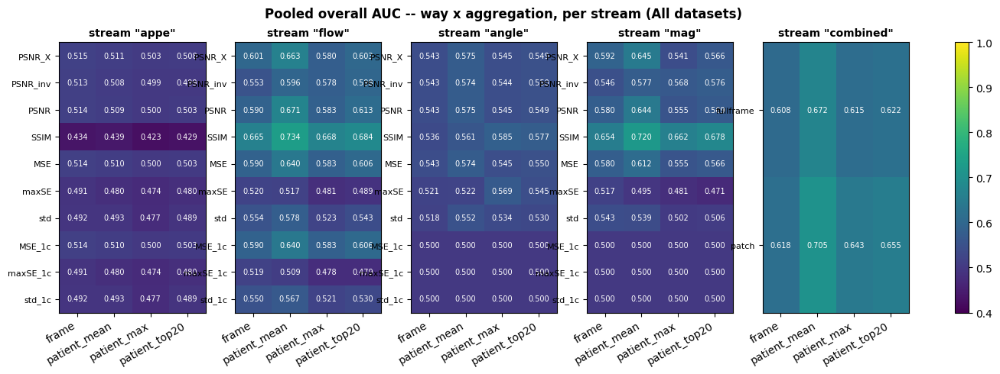

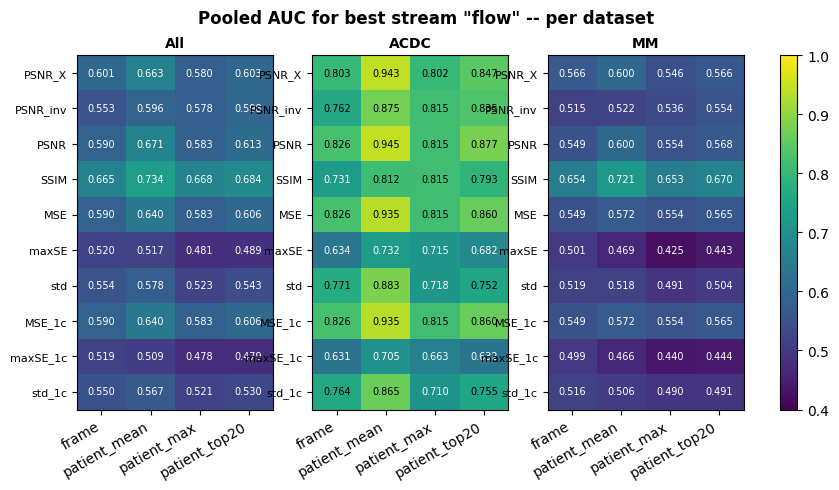

Best pooled recipe (All): stream=flow  way=SSIM  agg=patient_mean  AUC=0.7345
Per-disease AUC (agg=patient_mean) -- best recipe vs full-frame paper formula


dataset,AHS,ARV,DCM,HCM,HHD,IHD,LVNC,MINF,Other,RV
score,,,,,,,,,,
combined__fullframe,0.78,0.6800,0.6540,0.7938,0.5800,0.7333,0.70,0.582,0.6264,0.544
flow__SSIM,0.90,0.8143,0.6875,0.7395,0.8157,0.9333,0.67,0.854,0.7504,0.570


In [13]:
# === Best recipe (pooled) + per-stream AUC heatmaps + per-disease table =====================
import numpy as np, pandas as pd, matplotlib.pyplot as plt

_agg_order = list(AGGS.keys())
_pool_all = auc_pooled[(auc_pooled.kind == 'overall') & (auc_pooled.dataset == 'All')].copy()

# ---- ranked top-15 recipes by pooled overall AUC, with per-dataset columns ------------------
_wide = (auc_pooled[auc_pooled.kind == 'overall']
         .pivot_table(index=['stream', 'way', 'agg_name'], columns='dataset', values='auc'))
_rank = _wide.sort_values('All', ascending=False).head(15).round(4)
print('=' * 74); print('  TOP 15 recipes by pooled overall AUC (healthy vs unhealthy)'); print('=' * 74)
display(_rank)


def _heatmap(ax, sub, ways, title):
    M = np.full((len(ways), len(_agg_order)), np.nan)
    for r, w in enumerate(ways):
        for c, a in enumerate(_agg_order):
            v = sub[(sub.way == w) & (sub.agg_name == a)]['auc'].values
            if len(v):
                M[r, c] = v[0]
    im = ax.imshow(M, vmin=0.4, vmax=1.0, cmap='viridis', aspect='auto')
    ax.set_xticks(range(len(_agg_order))); ax.set_xticklabels(_agg_order, rotation=30, ha='right')
    ax.set_yticks(range(len(ways))); ax.set_yticklabels(ways, fontsize=8)
    for r in range(len(ways)):
        for c in range(len(_agg_order)):
            if np.isfinite(M[r, c]):
                ax.text(c, r, f'{M[r, c]:.3f}', ha='center', va='center', fontsize=7,
                        color=('w' if M[r, c] < 0.75 else 'k'))
    ax.set_title(title, fontweight='bold', fontsize=10)
    return im


# ---- heatmaps: rows = 10 ways, cols = aggregation, one panel per stream (All datasets) -------
_streams_plot = STREAMS + ['combined']
fig, axes = plt.subplots(1, len(_streams_plot), figsize=(3.1 * len(_streams_plot), 4.6))
axes = np.atleast_1d(axes)
im = None
for ax, stream in zip(axes, _streams_plot):
    sub = _pool_all[_pool_all.stream == stream]
    ways = [w for w in WAY_NAMES if (sub.way == w).any()] or sorted(sub.way.unique())
    im = _heatmap(ax, sub, ways, f'stream "{stream}"')
fig.suptitle('Pooled overall AUC -- way x aggregation, per stream (All datasets)', fontweight='bold')
fig.colorbar(im, ax=list(axes), fraction=0.025); plt.show()

# ---- per-dataset heatmap for the single best stream -----------------------------------------
_best = _pool_all.sort_values('auc', ascending=False).iloc[0]
_best_stream, _best_score, _best_agg = _best['stream'], _best['score'], _best['agg_name']
_dsets = ['All'] + [d for d in ['ACDC', 'MM'] if (auc_pooled.dataset == d).any()]
if len(_dsets) > 1:
    fig, axes = plt.subplots(1, len(_dsets), figsize=(3.1 * len(_dsets), 4.6))
    axes = np.atleast_1d(axes)
    for ax, ds in zip(axes, _dsets):
        sub = auc_pooled[(auc_pooled.kind == 'overall') & (auc_pooled.dataset == ds)
                         & (auc_pooled.stream == _best_stream)]
        ways = [w for w in WAY_NAMES if (sub.way == w).any()] or sorted(sub.way.unique())
        im = _heatmap(ax, sub, ways, f'{ds}')
    fig.suptitle(f'Pooled AUC for best stream "{_best_stream}" -- per dataset', fontweight='bold')
    fig.colorbar(im, ax=list(axes), fraction=0.025); plt.show()

# ---- per-disease AUC table for the best recipe and the full-frame paper score ---------------
print(f'Best pooled recipe (All): stream={_best_stream}  way={_best["way"]}  '
      f'agg={_best_agg}  AUC={_best["auc"]:.4f}')
_dis_tbl = (auc_pooled[(auc_pooled.kind == 'disease')
            & (auc_pooled.score.isin([_best_score, 'combined__fullframe']))
            & (auc_pooled.agg_name == _best_agg)]
            .pivot_table(index='score', columns='dataset', values='auc').round(4))
print(f'Per-disease AUC (agg={_best_agg}) -- best recipe vs full-frame paper formula')
display(_dis_tbl)

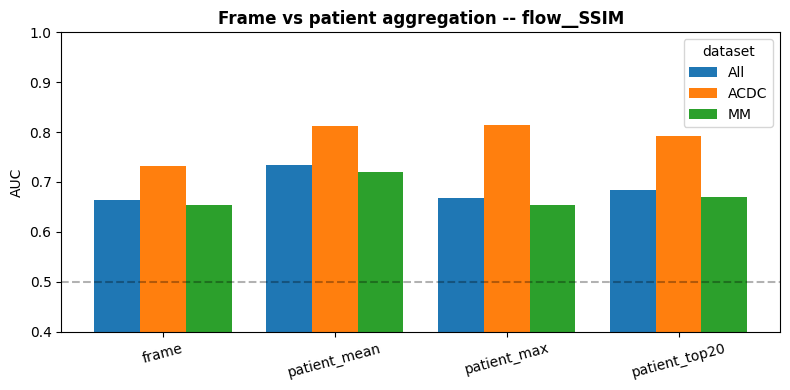

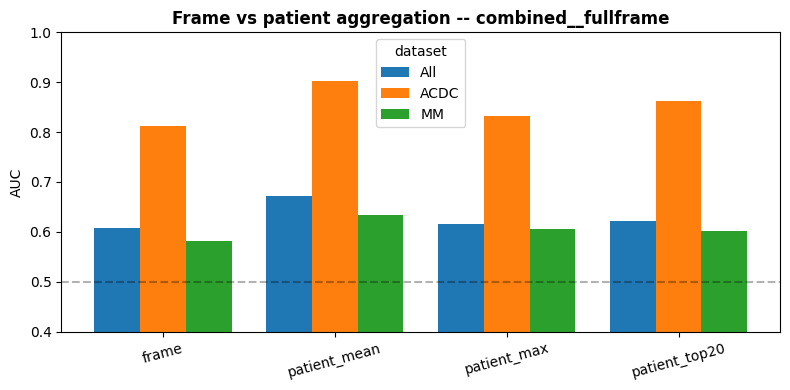

  HONEST val-selected -> test report   vs   POOLED optimistic best
  Selected on VAL (All): score=mag__SSIM  agg=patient_mean  val_AUC=0.7740
    -> TEST   AUC (same recipe): 0.7059
    -> POOLED AUC (same recipe): 0.7201
  Pooled optimistic best (All): score=flow__SSIM  agg=patient_mean  AUC=0.7345


,pick,score,agg,val_AUC,test_AUC,pooled_AUC
0,honest (val-selected),mag__SSIM,patient_mean,0.7740,0.7059,0.7201
1,pooled (optimistic),flow__SSIM,patient_mean,0.7644,0.7309,0.7345


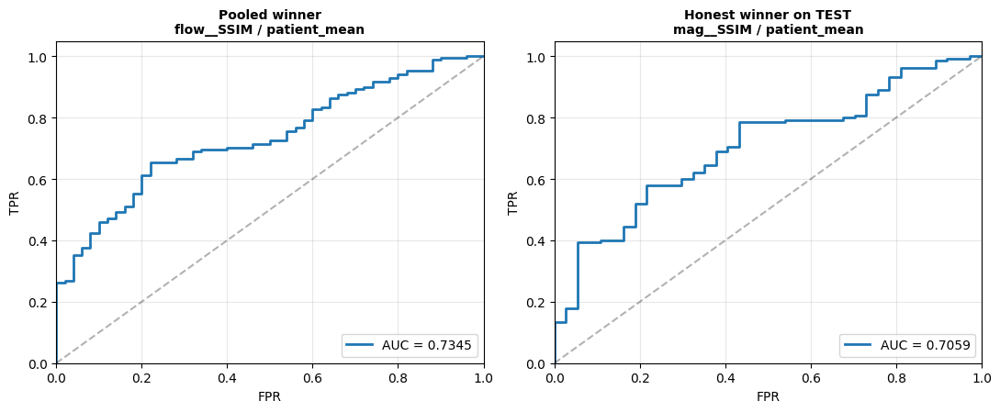

In [14]:
# === Frame vs patient aggregation + honest val->test selection + winner ROC =================
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# ---- frame vs patient bar charts for the best way and the full-frame paper score ------------
for _score in [_best_score, 'combined__fullframe']:
    rows = auc_pooled[(auc_pooled.kind == 'overall') & (auc_pooled.score == _score)]
    dsets = ['All'] + [d for d in ['ACDC', 'MM'] if (rows.dataset == d).any()]
    x = np.arange(len(_agg_order)); bw = 0.8 / len(dsets)
    fig, ax = plt.subplots(figsize=(8, 4))
    for k, ds in enumerate(dsets):
        vals = [rows[(rows.agg_name == a) & (rows.dataset == ds)]['auc'].values for a in _agg_order]
        vals = [v[0] if len(v) else np.nan for v in vals]
        ax.bar(x + k * bw, vals, bw, label=ds)
    ax.set_xticks(x + bw * (len(dsets) - 1) / 2); ax.set_xticklabels(_agg_order, rotation=15)
    ax.axhline(0.5, ls='--', c='k', alpha=0.3); ax.set_ylim(0.4, 1.0); ax.set_ylabel('AUC')
    ax.set_title(f'Frame vs patient aggregation -- {_score}', fontweight='bold')
    ax.legend(title='dataset'); plt.tight_layout(); plt.show()


# ---- honest: select best (score, agg) on VAL overall-All, report on TEST --------------------
def _pick_best(tbl):
    t = tbl[(tbl.kind == 'overall') & (tbl.dataset == 'All')].dropna(subset=['auc'])
    return t.sort_values('auc', ascending=False).iloc[0]


def _lookup(tbl, score, agg, ds='All'):
    r = tbl[(tbl.kind == 'overall') & (tbl.dataset == ds)
            & (tbl.score == score) & (tbl.agg_name == agg)]['auc'].values
    return float(r[0]) if len(r) else np.nan


_v_best = _pick_best(auc_val)
_sel_score, _sel_agg = _v_best['score'], _v_best['agg_name']
print('=' * 74); print('  HONEST val-selected -> test report   vs   POOLED optimistic best'); print('=' * 74)
print(f'  Selected on VAL (All): score={_sel_score}  agg={_sel_agg}  val_AUC={_v_best["auc"]:.4f}')
print(f'    -> TEST   AUC (same recipe): {_lookup(auc_test, _sel_score, _sel_agg):.4f}')
print(f'    -> POOLED AUC (same recipe): {_lookup(auc_pooled, _sel_score, _sel_agg):.4f}')
print(f'  Pooled optimistic best (All): score={_best_score}  agg={_best_agg}  '
      f'AUC={_lookup(auc_pooled, _best_score, _best_agg):.4f}')
_summary = pd.DataFrame([
    {'pick': 'honest (val-selected)', 'score': _sel_score, 'agg': _sel_agg,
     'val_AUC': round(_v_best['auc'], 4),
     'test_AUC': round(_lookup(auc_test, _sel_score, _sel_agg), 4),
     'pooled_AUC': round(_lookup(auc_pooled, _sel_score, _sel_agg), 4)},
    {'pick': 'pooled (optimistic)', 'score': _best_score, 'agg': _best_agg,
     'val_AUC': round(_lookup(auc_val, _best_score, _best_agg), 4),
     'test_AUC': round(_lookup(auc_test, _best_score, _best_agg), 4),
     'pooled_AUC': round(_lookup(auc_pooled, _best_score, _best_agg), 4)},
])
display(_summary)


# ---- ROC of pooled winner (on pool) and honest winner (on test split) -----------------------
def _score_vector(df, score, agg):
    ad = _aggregate(df, [score], AGGS[agg])
    return ad['binary_label'].values, ad[score].values


_panels = [
    (f'Pooled winner\n{_best_score} / {_best_agg}', sweep_df, _best_score, _best_agg),
    (f'Honest winner on TEST\n{_sel_score} / {_sel_agg}', sweep_df[sweep_df.split == 'test'], _sel_score, _sel_agg),
]
fig, axes = plt.subplots(1, 2, figsize=(11, 4.6))
for ax, (title, df, score, agg) in zip(axes, _panels):
    y, s = _score_vector(df, score, agg)
    if len(np.unique(y)) > 1:
        fpr, tpr, _ = roc_curve(y, s)
        ax.plot(fpr, tpr, lw=2, label=f'AUC = {roc_auc_score(y, s):.4f}')
    ax.plot([0, 1], [0, 1], 'k--', alpha=0.3)
    ax.set_xlabel('FPR'); ax.set_ylabel('TPR'); ax.set_title(title, fontweight='bold', fontsize=10)
    ax.legend(loc='lower right'); ax.grid(alpha=0.3); ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
plt.tight_layout(); plt.show()

## Appearance x Flow Metric-Weight Sweep (patient_mean)

Building on the sweep above: SSIM / PSNR / MSE were the strongest per-stream ways and `patient_mean`
the best aggregation -- but we never **fused** the appearance and flow streams. This section blends
them linearly

    score(w) = w * appe_metric + (1 - w) * flow_metric        # w in {0.0, 0.1, ..., 1.0}

so `w=1` is appearance-only, `w=0` is flow-only, `w=0.5` is an equal raw sum. Appearance and flow may
each use a **different** metric (3x3 = 9 metric pairs), giving 9 x 11 = **99 candidate scores**.
Everything is at **patient_mean** (the best aggregation), reported for All / ACDC / M&M.

> **Raw values (no scaling).** The streams sit on different numeric scales (appe-MSE ~ 0.05 vs
> flow ~ 0.6; negated-PSNR ~ -20 vs -12), so for scale-mismatched pairs the larger-magnitude stream
> dominates and the weight barely moves the AUC except near the extremes. Cell B prints each stream's
> raw mean/std so you can see this. (Switching to z-scored streams is a one-line change.)
>
> All six columns are already anomaly-oriented (SSIM/PSNR negated, MSE raw -> higher = more
> anomalous). Requires `sweep_df` from the section above (run that cell first). Sanity check: the
> `w=0` / flow-SSIM point should reproduce the earlier `flow__SSIM` patient_mean All AUC (~0.7345).

In [23]:
# === Appearance x Flow metric-weight sweep at patient_mean =================================
import numpy as np, pandas as pd
from sklearn.metrics import roc_auc_score

assert 'sweep_df' in globals(), "Run the 'Comprehensive Score-Way ...' cell first to build sweep_df."
METRICS = ['SSIM', 'PSNR', 'MSE']
MOTION = 'flow' if MODEL_TYPE == 'flow' else 'aux'   # second stream name (flow model vs rgb model)
_needed = [f'appe__{m}' for m in METRICS] + [f'{MOTION}__{m}' for m in METRICS]
_missing = [c for c in _needed if c not in sweep_df.columns]
assert not _missing, f"sweep_df missing columns: {_missing}"


def _auc_safe(y, s):
    y = np.asarray(y); s = np.asarray(s, dtype=float)
    m = np.isfinite(s); y, s = y[m], s[m]
    return roc_auc_score(y, s) if len(np.unique(y)) > 1 else np.nan


def _weight_sweep(pat, metrics, motion, weights):
    # blend score(w) = w*appe_metric + (1-w)*motion_metric (RAW), AUC per dataset, per pair, per w.
    y = pat['binary_label'].values
    src = pat['source'].values
    srcs = ['All'] + [s for s in ['ACDC', 'MM'] if (src == s).any()]
    rows = []
    for m_a in metrics:
        for m_f in metrics:
            a = pat[f'appe__{m_a}'].values
            f = pat[f'{motion}__{m_f}'].values
            for w in weights:
                comb = w * a + (1.0 - w) * f
                for ds in srcs:
                    mask = np.ones(len(pat), bool) if ds == 'All' else (src == ds)
                    rows.append(dict(appe_metric=m_a, flow_metric=m_f, w=float(w),
                                     dataset=ds, auc=_auc_safe(y[mask], comb[mask])))
    return pd.DataFrame(rows)


# -- patient_mean roll-up: one row per patient, mean of each of the 6 metric columns --
_agg = {c: 'mean' for c in _needed}
_agg.update({'label': 'first', 'binary_label': 'first'})
pat_mw = sweep_df.groupby(['source', 'pid'], sort=False).agg(_agg).reset_index()
print(f'Patients: {len(pat_mw)}  '
      f'({int((pat_mw.binary_label == 0).sum())} NOR / {int((pat_mw.binary_label == 1).sum())} unhealthy)')

# -- raw scale of each stream (makes the raw-weighting dominance explicit) --
_scale = pd.DataFrame({'mean': pat_mw[_needed].mean(),
                       'std': pat_mw[_needed].std(),
                       'abs_mean': pat_mw[_needed].abs().mean()}).round(4)
print('Raw per-stream scale (patient_mean values) -- the larger |.| dominates a raw weighted sum:')
display(_scale)

# -- the weight sweep --
WEIGHTS = np.round(np.linspace(0.0, 1.0, 11), 1)
wsweep_long = _weight_sweep(pat_mw, METRICS, MOTION, WEIGHTS)
print(f'wsweep_long: {len(wsweep_long)} rows  '
      f'({len(METRICS) ** 2} metric pairs x {len(WEIGHTS)} weights x '
      f'{wsweep_long.dataset.nunique()} datasets)')

# -- best blend + pure-stream references (All) --
_all = wsweep_long[wsweep_long.dataset == 'All']
_best = _all.loc[_all.auc.idxmax()]
_pure_appe = _all[_all.w == 1.0].sort_values('auc', ascending=False).iloc[0]
_pure_flow = _all[_all.w == 0.0].sort_values('auc', ascending=False).iloc[0]
_flow_ssim_w0 = _all[(_all.w == 0.0) & (_all.flow_metric == 'SSIM')].auc.iloc[0]
print('=' * 78)
print(f'  BEST blend (All):  appe-{_best.appe_metric} (w={_best.w:.1f})  +  '
      f'{MOTION}-{_best.flow_metric} (w={1 - _best.w:.1f})    AUC = {_best.auc:.4f}')
print(f'  Best appe-only   (w=1): appe-{_pure_appe.appe_metric}    AUC = {_pure_appe.auc:.4f}')
print(f'  Best {MOTION}-only (w=0): {MOTION}-{_pure_flow.flow_metric}    AUC = {_pure_flow.auc:.4f}')
print(f'  Sanity: {MOTION}-SSIM at w=0 -> {_flow_ssim_w0:.4f}  (cf. earlier {MOTION}__SSIM patient_mean All ~0.7345)')
print('=' * 78)

Patients: 217  (50 NOR / 167 unhealthy)
Raw per-stream scale (patient_mean values) -- the larger |.| dominates a raw weighted sum:


,mean,std,abs_mean
appe__SSIM,-0.7847,0.0488,0.7847
appe__PSNR,-25.0488,1.5934,25.0488
appe__MSE,0.0034,0.0014,0.0034
flow__SSIM,-0.5137,0.0638,0.5137
flow__PSNR,-5.2496,1.9177,5.2558
flow__MSE,3.7829,1.7779,3.7829


wsweep_long: 297 rows  (9 metric pairs x 11 weights x 3 datasets)
  BEST blend (All):  appe-MSE (w=0.1)  +  flow-SSIM (w=0.9)    AUC = 0.7346
  Best appe-only   (w=1): appe-MSE    AUC = 0.5098
  Best flow-only (w=0): flow-SSIM    AUC = 0.7345
  Sanity: flow-SSIM at w=0 -> 0.7345  (cf. earlier flow__SSIM patient_mean All ~0.7345)


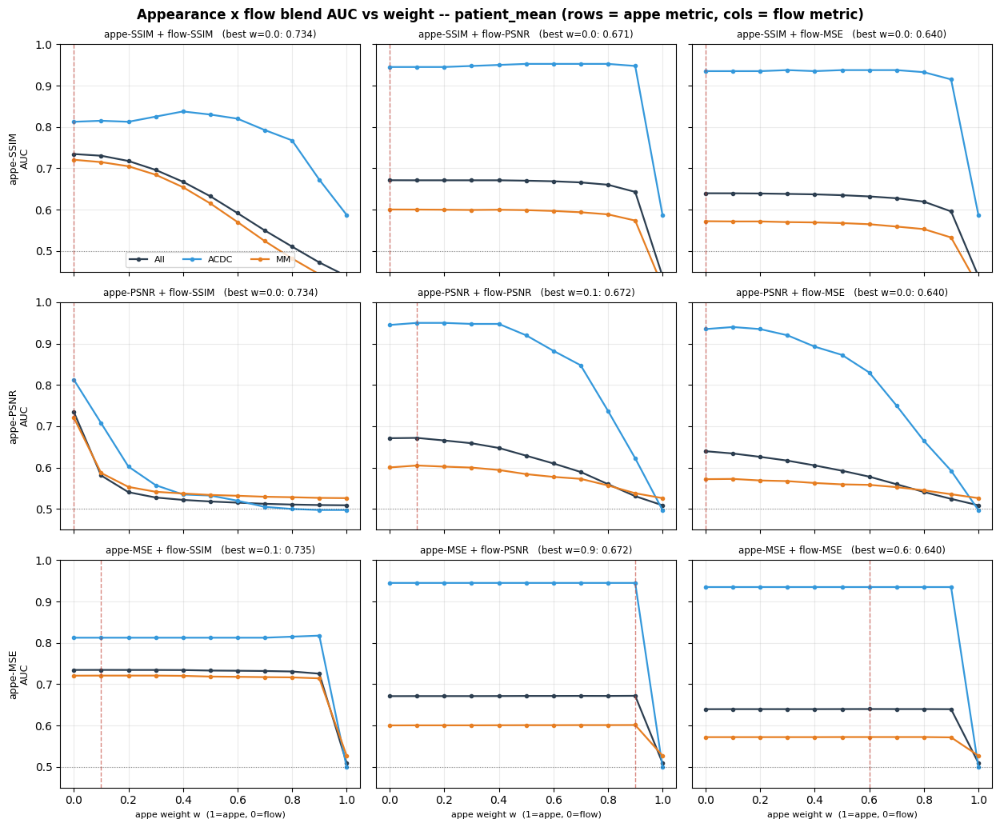

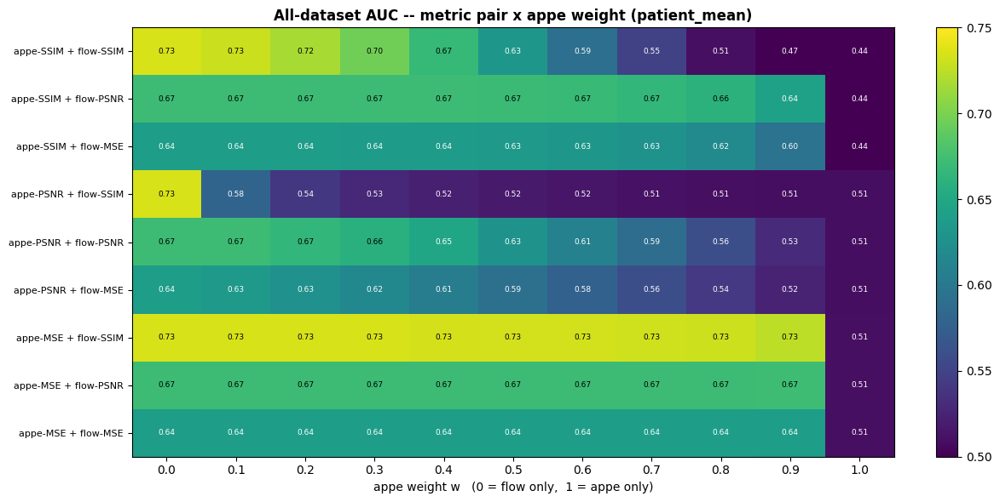

TOP 10 appe x flow blends by All AUC (patient_mean):


dataset,appe_metric,flow_metric,w,ACDC,All,MM
0,MSE,SSIM,0.1,0.8125,0.7346,0.7209
1,MSE,SSIM,0.2,0.8125,0.7345,0.7209
2,MSE,SSIM,0.0,0.8125,0.7345,0.7207
3,SSIM,SSIM,0.0,0.8125,0.7345,0.7207
4,PSNR,SSIM,0.0,0.8125,0.7345,0.7207
5,MSE,SSIM,0.3,0.8125,0.7345,0.7209
6,MSE,SSIM,0.4,0.8125,0.7343,0.7203
7,MSE,SSIM,0.5,0.8125,0.7331,0.7185
8,MSE,SSIM,0.6,0.8125,0.7326,0.7179
9,MSE,SSIM,0.7,0.8125,0.7320,0.7171


Best appe-weight per metric pair (All):


,pair,best_w,AUC_All
0,appe-SSIM + flow-SSIM,0.0,0.7345
1,appe-SSIM + flow-PSNR,0.0,0.6711
2,appe-SSIM + flow-MSE,0.0,0.6396
3,appe-PSNR + flow-SSIM,0.0,0.7345
4,appe-PSNR + flow-PSNR,0.1,0.6719
5,appe-PSNR + flow-MSE,0.0,0.6396
6,appe-MSE + flow-SSIM,0.1,0.7346
7,appe-MSE + flow-PSNR,0.9,0.6720
8,appe-MSE + flow-MSE,0.6,0.6400


In [24]:
# === Visualize: 3x3 grid of AUC-vs-weight, heatmap, and best-config tables =================
import numpy as np, pandas as pd, matplotlib.pyplot as plt

METRICS = ['SSIM', 'PSNR', 'MSE']
MOTION = 'flow' if MODEL_TYPE == 'flow' else 'aux'
WEIGHTS = np.round(np.linspace(0.0, 1.0, 11), 1)
_dcolors = {'All': '#2c3e50', 'ACDC': '#3498db', 'MM': '#e67e22'}
_dsets = ['All'] + [d for d in ['ACDC', 'MM'] if (wsweep_long.dataset == d).any()]

# -- 3x3 grid: rows = appe metric, cols = flow metric; AUC vs w with 3 dataset lines --
fig, axes = plt.subplots(len(METRICS), len(METRICS),
                         figsize=(4.2 * len(METRICS), 3.5 * len(METRICS)), sharex=True, sharey=True)
for i, m_a in enumerate(METRICS):
    for j, m_f in enumerate(METRICS):
        ax = axes[i, j]
        sub = wsweep_long[(wsweep_long.appe_metric == m_a) & (wsweep_long.flow_metric == m_f)]
        for ds in _dsets:
            d = sub[sub.dataset == ds].sort_values('w')
            ax.plot(d.w, d.auc, marker='o', ms=3, lw=1.6, color=_dcolors[ds], label=ds)
        dall = sub[sub.dataset == 'All']
        ttl = f'appe-{m_a} + {MOTION}-{m_f}'
        if dall.auc.notna().any():
            br = dall.loc[dall.auc.idxmax()]
            ax.axvline(br.w, color='#c0392b', ls='--', lw=1, alpha=0.6)
            ttl += f'   (best w={br.w:.1f}: {br.auc:.3f})'
        ax.set_title(ttl, fontsize=8.5)
        ax.axhline(0.5, color='k', ls=':', lw=0.8, alpha=0.4)
        ax.grid(alpha=0.25); ax.set_ylim(0.45, 1.0)
        if i == len(METRICS) - 1:
            ax.set_xlabel(f'appe weight w  (1=appe, 0={MOTION})', fontsize=8)
        if j == 0:
            ax.set_ylabel(f'appe-{m_a}\nAUC', fontsize=9)
axes[0, 0].legend(fontsize=8, loc='lower center', ncol=3)
fig.suptitle(f'Appearance x {MOTION} blend AUC vs weight -- patient_mean '
             f'(rows = appe metric, cols = {MOTION} metric)', fontweight='bold')
plt.tight_layout(); plt.show()

# -- heatmap: 9 metric pairs x 11 weights, colour = All AUC --
_all = wsweep_long[wsweep_long.dataset == 'All']
_pairs = [(a, f) for a in METRICS for f in METRICS]
M = np.full((len(_pairs), len(WEIGHTS)), np.nan)
for r, (a, f) in enumerate(_pairs):
    for c, w in enumerate(WEIGHTS):
        v = _all[(_all.appe_metric == a) & (_all.flow_metric == f) & (np.isclose(_all.w, w))].auc.values
        if len(v):
            M[r, c] = v[0]
fig, ax = plt.subplots(figsize=(0.85 * len(WEIGHTS) + 2.5, 0.5 * len(_pairs) + 1.5))
im = ax.imshow(M, vmin=0.5, vmax=max(0.75, np.nanmax(M)), cmap='viridis', aspect='auto')
ax.set_xticks(range(len(WEIGHTS))); ax.set_xticklabels([f'{w:.1f}' for w in WEIGHTS])
ax.set_yticks(range(len(_pairs)))
ax.set_yticklabels([f'appe-{a} + {MOTION}-{f}' for a, f in _pairs], fontsize=8)
ax.set_xlabel(f'appe weight w   (0 = {MOTION} only,  1 = appe only)')
for r in range(len(_pairs)):
    for c in range(len(WEIGHTS)):
        if np.isfinite(M[r, c]):
            ax.text(c, r, f'{M[r, c]:.2f}', ha='center', va='center', fontsize=6.5,
                    color=('w' if M[r, c] < 0.65 else 'k'))
ax.set_title('All-dataset AUC -- metric pair x appe weight (patient_mean)', fontweight='bold')
fig.colorbar(im, ax=ax, fraction=0.046); plt.tight_layout(); plt.show()

# -- top-10 blends + best-weight-per-pair tables --
_wide = (wsweep_long.pivot_table(index=['appe_metric', 'flow_metric', 'w'],
                                 columns='dataset', values='auc').reset_index())
_top = _wide.dropna(subset=['All']).sort_values('All', ascending=False).head(10).reset_index(drop=True)
print('TOP 10 appe x flow blends by All AUC (patient_mean):')
display(_top.round(4))

_bestper = []
for a in METRICS:
    for f in METRICS:
        s = _all[(_all.appe_metric == a) & (_all.flow_metric == f)].dropna(subset=['auc'])
        if len(s):
            b = s.loc[s.auc.idxmax()]
            _bestper.append(dict(pair=f'appe-{a} + {MOTION}-{f}', best_w=b.w, AUC_All=round(b.auc, 4)))
print('Best appe-weight per metric pair (All):')
display(pd.DataFrame(_bestper))

## Normalized Appearance x Flow Weight Sweep (patient_mean)

The raw sweep above was dominated by stream scale (appe-MSE ~ 0.003 vs flow ~ 0.6), so the weight
could not act as a fair mix. This section **normalizes each stream before blending**, the way
`utils.py` does, so `w` is meaningful and we can see whether any appe+flow blend actually beats
flow-SSIM alone.

**How `utils.py` normalizes (utils.py:246-339).** It (1) turns each metric into a positive
"higher = worse" error via the reciprocal (`1/PSNR`, `1/SSIM`; MSE is already positive), (2) divides by
the training mean `mu`, and (3) takes the log:  `combined = log(appe/mu_appe) + 2*log(flow/mu_flow)`.

**We can drop `mu`.** At a fixed `w`, the term `w*log(mu_appe) + (1-w)*log(mu_flow)` is the same
constant for every patient, so it does not change the patient ranking -> **mu has no effect on AUC**.
So "log-mu" reduces to **log of the positive error** here (no per-metric mu, no extra inference).

Three normalizations are run and compared (patient_mean, All / ACDC / M&M):
- **raw**    -- the stored value (reproduces the section above; scale-dominated),
- **logmu**  -- `log(positive_error)` (the utils.py method),
- **zscore** -- `(x - mean) / std` per stream (sign-agnostic; `w=0.5` = exactly equal contribution).

Positive-error forms (the stored columns are negation-flipped, so `col = -SSIM`, `-PSNR`, `+MSE`):
`MSE -> col`,   `SSIM -> 1 + col` (= 1-SSIM),   `PSNR -> -1/col` (= 1/PSNR).

> Requires `sweep_df` from the Comprehensive sweep cell. Sanity: every method's `w=0` / flow-SSIM
> point should still reproduce the earlier `flow__SSIM` patient_mean All AUC (~0.7345), since all
> transforms are monotone per stream.

In [31]:
# === Normalized appearance x flow weight sweep (raw / logmu / zscore) ======================
import numpy as np, pandas as pd
from sklearn.metrics import roc_auc_score

assert 'sweep_df' in globals(), "Run the 'Comprehensive Score-Way ...' cell first to build sweep_df."
METRICS = ['SSIM', 'PSNR', 'MSE']
MOTION = 'flow' if MODEL_TYPE == 'flow' else 'aux'
_cols = [f'appe__{m}' for m in METRICS] + [f'{MOTION}__{m}' for m in METRICS]
assert all(c in sweep_df.columns for c in _cols), f"missing: {[c for c in _cols if c not in sweep_df.columns]}"
_EPS = 1e-9


def _auc_safe(y, s):
    y = np.asarray(y); s = np.asarray(s, dtype=float)
    m = np.isfinite(s); y, s = y[m], s[m]
    return roc_auc_score(y, s) if len(np.unique(y)) > 1 else np.nan


def _pos_error(col_vals, metric):
    # positive "higher = worse" error from the stored (negation-flipped) column.
    # stored: SSIM = -SSIM, PSNR = -PSNR, MSE = +MSE.
    if metric == 'MSE':
        return np.maximum(col_vals, _EPS)
    if metric == 'SSIM':
        return np.maximum(1.0 + col_vals, _EPS)                    # 1 - SSIM
    return np.maximum(-1.0 / np.minimum(col_vals, -_EPS), _EPS)    # 1 / PSNR   (col < 0)


def _normalize(col_vals, metric, method):
    if method == 'raw':
        return col_vals.astype(float)
    if method == 'logmu':
        return np.log(_pos_error(col_vals, metric))               # mu cancels in AUC -> just log(e)
    x = col_vals.astype(float)                                     # zscore
    return (x - x.mean()) / (x.std() + _EPS)


def _norm_sweep(pat, metrics, motion, weights, method):
    y = pat['binary_label'].values
    src = pat['source'].values
    srcs = ['All'] + [s for s in ['ACDC', 'MM'] if (src == s).any()]
    A = {m: _normalize(pat[f'appe__{m}'].values, m, method) for m in metrics}
    F = {m: _normalize(pat[f'{motion}__{m}'].values, m, method) for m in metrics}
    rows = []
    for m_a in metrics:
        for m_f in metrics:
            for w in weights:
                comb = w * A[m_a] + (1.0 - w) * F[m_f]
                for ds in srcs:
                    mask = np.ones(len(pat), bool) if ds == 'All' else (src == ds)
                    rows.append(dict(method=method, appe_metric=m_a, flow_metric=m_f,
                                     w=float(w), dataset=ds, auc=_auc_safe(y[mask], comb[mask])))
    return pd.DataFrame(rows)


# -- patient_mean roll-up (fresh; depends only on sweep_df, not the raw-sweep cell) --
_agg = {c: 'mean' for c in _cols}; _agg['binary_label'] = 'first'
pat_nm = sweep_df.groupby(['source', 'pid'], sort=False).agg(_agg).reset_index()
WEIGHTS = np.round(np.linspace(0.0, 1.0, 11), 1)

wsweep_norm_long = pd.concat(
    [_norm_sweep(pat_nm, METRICS, MOTION, WEIGHTS, mth) for mth in ['raw', 'logmu', 'zscore']],
    ignore_index=True)
print(f'wsweep_norm_long: {len(wsweep_norm_long)} rows  '
      f'(3 methods x {len(METRICS) ** 2} pairs x {len(WEIGHTS)} weights x '
      f'{wsweep_norm_long.dataset.nunique()} datasets)')

# -- pure flow-SSIM baseline (w=0) and best blend per method (All) --
_all = wsweep_norm_long[wsweep_norm_long.dataset == 'All']
_flow_ssim = _all[(_all.method == 'logmu') & (_all.w == 0.0) & (_all.flow_metric == 'SSIM')].auc.iloc[0]
print('=' * 82)
print(f'  Pure {MOTION}-SSIM baseline (w=0): AUC = {_flow_ssim:.4f}   (cf. earlier ~0.7345)')
print('-' * 82)
for mth in ['raw', 'logmu', 'zscore']:
    sub = _all[_all.method == mth].dropna(subset=['auc'])
    b = sub.loc[sub.auc.idxmax()]
    lift = b.auc - _flow_ssim
    flag = 'BEATS flow-SSIM' if lift > 1e-4 else 'no gain over flow-SSIM'
    print(f'  [{mth:6s}] best: appe-{b.appe_metric} (w={b.w:.1f}) + {MOTION}-{b.flow_metric}    '
          f'AUC = {b.auc:.4f}   ({flag}, {lift:+.4f})')
print('=' * 82)

wsweep_norm_long: 891 rows  (3 methods x 9 pairs x 11 weights x 3 datasets)
  Pure flow-SSIM baseline (w=0): AUC = 0.7345   (cf. earlier ~0.7345)
----------------------------------------------------------------------------------
  [raw   ] best: appe-MSE (w=0.1) + flow-SSIM    AUC = 0.7346   (BEATS flow-SSIM, +0.0001)
  [logmu ] best: appe-SSIM (w=0.0) + flow-SSIM    AUC = 0.7345   (no gain over flow-SSIM, +0.0000)
  [zscore] best: appe-SSIM (w=0.0) + flow-SSIM    AUC = 0.7345   (no gain over flow-SSIM, +0.0000)


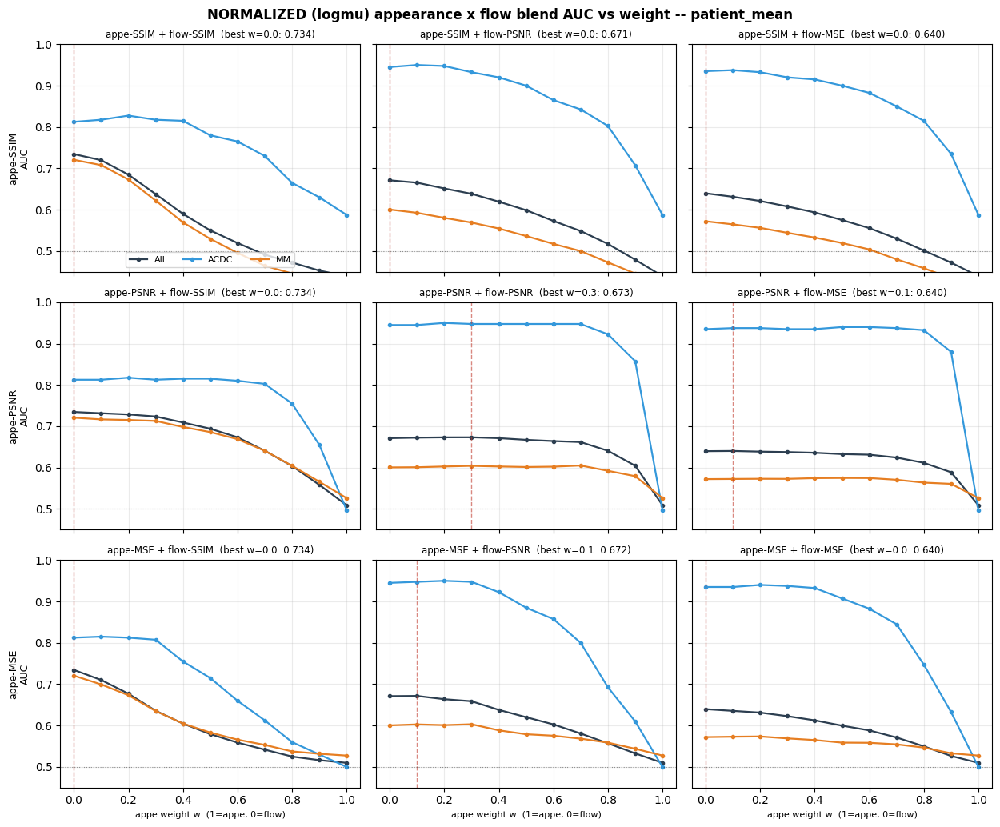

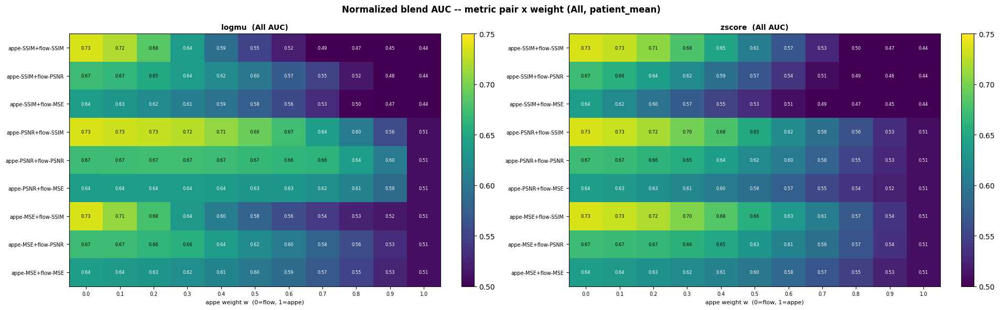

Best blend per normalization method (patient_mean):


,method,appe_metric,flow_metric,best_w,AUC_All,AUC_ACDC,AUC_MM
0,raw,MSE,SSIM,0.1,0.7346,0.8125,0.7209
1,logmu,SSIM,SSIM,0.0,0.7345,0.8125,0.7207
2,zscore,SSIM,SSIM,0.0,0.7345,0.8125,0.7207


TOP 10 logmu blends by All AUC (patient_mean):


,appe_metric,flow_metric,w,auc
0,SSIM,SSIM,0.0,0.7345
1,MSE,SSIM,0.0,0.7345
2,PSNR,SSIM,0.0,0.7345
3,PSNR,SSIM,0.1,0.7314
4,PSNR,SSIM,0.2,0.7285
5,PSNR,SSIM,0.3,0.7235
6,SSIM,SSIM,0.1,0.7198
7,MSE,SSIM,0.1,0.7102
8,PSNR,SSIM,0.4,0.7091
9,PSNR,SSIM,0.5,0.6940


In [32]:
# === Visualize normalized sweep: logmu 3x3 grid + logmu/zscore heatmaps + method comparison ===
import numpy as np, pandas as pd, matplotlib.pyplot as plt

METRICS = ['SSIM', 'PSNR', 'MSE']
MOTION = 'flow' if MODEL_TYPE == 'flow' else 'aux'
WEIGHTS = np.round(np.linspace(0.0, 1.0, 11), 1)
_dcolors = {'All': '#2c3e50', 'ACDC': '#3498db', 'MM': '#e67e22'}
_dsets = ['All'] + [d for d in ['ACDC', 'MM'] if (wsweep_norm_long.dataset == d).any()]
PRIMARY = 'logmu'
_pairs = [(a, f) for a in METRICS for f in METRICS]


def _heatmap_pairs(ax, df_all, title):
    M = np.full((len(_pairs), len(WEIGHTS)), np.nan)
    for r, (a, f) in enumerate(_pairs):
        for c, w in enumerate(WEIGHTS):
            v = df_all[(df_all.appe_metric == a) & (df_all.flow_metric == f)
                       & (np.isclose(df_all.w, w))].auc.values
            if len(v):
                M[r, c] = v[0]
    im = ax.imshow(M, vmin=0.5, vmax=max(0.75, np.nanmax(M)), cmap='viridis', aspect='auto')
    ax.set_xticks(range(len(WEIGHTS))); ax.set_xticklabels([f'{w:.1f}' for w in WEIGHTS], fontsize=7)
    ax.set_yticks(range(len(_pairs)))
    ax.set_yticklabels([f'appe-{a}+{MOTION}-{f}' for a, f in _pairs], fontsize=7)
    for r in range(len(_pairs)):
        for c in range(len(WEIGHTS)):
            if np.isfinite(M[r, c]):
                ax.text(c, r, f'{M[r, c]:.2f}', ha='center', va='center', fontsize=6,
                        color=('w' if M[r, c] < 0.65 else 'k'))
    ax.set_xlabel(f'appe weight w  (0={MOTION}, 1=appe)', fontsize=8)
    ax.set_title(title, fontweight='bold', fontsize=10)
    return im


# -- 3x3 grid for the primary (logmu) method --
_pri = wsweep_norm_long[wsweep_norm_long.method == PRIMARY]
fig, axes = plt.subplots(len(METRICS), len(METRICS),
                         figsize=(4.2 * len(METRICS), 3.5 * len(METRICS)), sharex=True, sharey=True)
for i, m_a in enumerate(METRICS):
    for j, m_f in enumerate(METRICS):
        ax = axes[i, j]
        sub = _pri[(_pri.appe_metric == m_a) & (_pri.flow_metric == m_f)]
        for ds in _dsets:
            d = sub[sub.dataset == ds].sort_values('w')
            ax.plot(d.w, d.auc, marker='o', ms=3, lw=1.6, color=_dcolors[ds], label=ds)
        dall = sub[sub.dataset == 'All']
        ttl = f'appe-{m_a} + {MOTION}-{m_f}'
        if dall.auc.notna().any():
            br = dall.loc[dall.auc.idxmax()]
            ax.axvline(br.w, color='#c0392b', ls='--', lw=1, alpha=0.6)
            ttl += f'  (best w={br.w:.1f}: {br.auc:.3f})'
        ax.set_title(ttl, fontsize=8.5)
        ax.axhline(0.5, color='k', ls=':', lw=0.8, alpha=0.4)
        ax.grid(alpha=0.25); ax.set_ylim(0.45, 1.0)
        if i == len(METRICS) - 1:
            ax.set_xlabel(f'appe weight w  (1=appe, 0={MOTION})', fontsize=8)
        if j == 0:
            ax.set_ylabel(f'appe-{m_a}\nAUC', fontsize=9)
axes[0, 0].legend(fontsize=8, loc='lower center', ncol=3)
fig.suptitle(f'NORMALIZED (logmu) appearance x {MOTION} blend AUC vs weight -- patient_mean',
             fontweight='bold')
plt.tight_layout(); plt.show()

# -- heatmaps: logmu vs zscore side by side (All AUC) --
fig, axes = plt.subplots(1, 2, figsize=(1.7 * (0.8 * len(WEIGHTS) + 2.5), 0.5 * len(_pairs) + 1.5))
for ax, mth in zip(axes, ['logmu', 'zscore']):
    sub = wsweep_norm_long[(wsweep_norm_long.method == mth) & (wsweep_norm_long.dataset == 'All')]
    im = _heatmap_pairs(ax, sub, f'{mth}  (All AUC)')
    fig.colorbar(im, ax=ax, fraction=0.046)
fig.suptitle('Normalized blend AUC -- metric pair x weight (All, patient_mean)', fontweight='bold')
plt.tight_layout(); plt.show()

# -- comparison table: best blend per method, with per-dataset AUCs --
_rows = []
for mth in ['raw', 'logmu', 'zscore']:
    sub = wsweep_norm_long[(wsweep_norm_long.method == mth) & (wsweep_norm_long.dataset == 'All')].dropna(subset=['auc'])
    b = sub.loc[sub.auc.idxmax()]
    rec = {'method': mth, 'appe_metric': b.appe_metric, 'flow_metric': b.flow_metric, 'best_w': b.w}
    for ds in _dsets:
        v = wsweep_norm_long[(wsweep_norm_long.method == mth) & (wsweep_norm_long.dataset == ds)
                             & (wsweep_norm_long.appe_metric == b.appe_metric)
                             & (wsweep_norm_long.flow_metric == b.flow_metric)
                             & (np.isclose(wsweep_norm_long.w, b.w))].auc.values
        rec[f'AUC_{ds}'] = round(float(v[0]), 4) if len(v) else np.nan
    _rows.append(rec)
print('Best blend per normalization method (patient_mean):')
display(pd.DataFrame(_rows))

# -- top-10 logmu blends --
_top = (_pri[_pri.dataset == 'All'].dropna(subset=['auc']).sort_values('auc', ascending=False)
        .head(10)[['appe_metric', 'flow_metric', 'w', 'auc']].reset_index(drop=True))
print('TOP 10 logmu blends by All AUC (patient_mean):')
display(_top.round(4))

## Cross-Dataset Weight Sweep -- Select on M&M-val, Report on ACDC + M&M-test (held-out) (patient_mean)

ACDC has no validation set (only a 50-patient test set), and a single ACDC sub-split is too small to be
representative. So we **select the appearance x flow recipe on the M&M Validation folder only**, then
report it on data the formula never saw -- so **both ACDC and M&M-test are honest held-out numbers**:
- **ACDC alone** (all 50 patients) -- clean in-domain test (ACDC was not used to pick the formula),
- **M&M-test alone** -- cross-domain held-out test,
- **pooled** = ACDC + M&M-test (all together).

Swept (patient_mean): normalization in {`raw`, `logmu`, `zscore`} (per-set self-normalized),
appe x flow metric in {SSIM, PSNR, MSE} (9 pairs), weight `w` in 0.00..1.00 step 0.05.
3 x 9 x 21 = 567 recipes; the best is picked by **M&M-val** AUC, then reported on the three held-out views.

> The selection set (M&M-val ~33 patients) is small, so the picked recipe is noisy -- but the formula
> is low-complexity and the ACDC / M&M-test numbers are honest (the formula never saw them). Small
> sets -> AUC SE ~ 0.05-0.08. Sanity: `w=0`/flow-SSIM on ACDC ~ 0.8125. Requires `sweep_df` from cell 44.

In [37]:
# === Cross-dataset weight sweep: select on M&M-val, report on ACDC / M&M-test (held-out) ====
import numpy as np, pandas as pd
from sklearn.metrics import roc_auc_score

assert 'sweep_df' in globals(), "Run the 'Comprehensive Score-Way ...' cell first to build sweep_df."
METRICS = ['SSIM', 'PSNR', 'MSE']
MOTION = 'flow' if MODEL_TYPE == 'flow' else 'aux'
_cols = [f'appe__{m}' for m in METRICS] + [f'{MOTION}__{m}' for m in METRICS]
assert all(c in sweep_df.columns for c in _cols), f"missing: {[c for c in _cols if c not in sweep_df.columns]}"
_EPS = 1e-9


def _auc_safe(y, s):
    y = np.asarray(y); s = np.asarray(s, dtype=float)
    m = np.isfinite(s); y, s = y[m], s[m]
    return roc_auc_score(y, s) if len(np.unique(y)) > 1 else np.nan


def _pos_error(col_vals, metric):
    if metric == 'MSE':
        return np.maximum(col_vals, _EPS)
    if metric == 'SSIM':
        return np.maximum(1.0 + col_vals, _EPS)                    # 1 - SSIM
    return np.maximum(-1.0 / np.minimum(col_vals, -_EPS), _EPS)    # 1 / PSNR


def _normalize(col_vals, metric, method):
    if method == 'raw':
        return col_vals.astype(float)
    if method == 'logmu':
        return np.log(_pos_error(col_vals, metric))
    x = col_vals.astype(float)
    return (x - x.mean()) / (x.std() + _EPS)


def _prep(pat, method, metrics, motion):
    # per-set self-normalized appearance / motion streams.
    y = pat['binary_label'].values
    A = {m: _normalize(pat[f'appe__{m}'].values, m, method) for m in metrics}
    F = {m: _normalize(pat[f'{motion}__{m}'].values, m, method) for m in metrics}
    return y, A, F


def _xsweep(sets, metrics, motion, weights, methods):
    # sets: dict name -> patient-level frame. AUC computed on each set (self-normalized).
    rows = []
    for method in methods:
        prep = {name: _prep(pat, method, metrics, motion) for name, pat in sets.items()}
        for m_a in metrics:
            for m_f in metrics:
                for w in weights:
                    rec = dict(method=method, appe_metric=m_a, flow_metric=m_f, w=float(w))
                    for name, (y, A, F) in prep.items():
                        rec[f'auc_{name}'] = _auc_safe(y, w * A[m_a] + (1.0 - w) * F[m_f])
                    rows.append(rec)
    return pd.DataFrame(rows)


# -- patient_mean rollups --
_agg = {c: 'mean' for c in _cols}; _agg['binary_label'] = 'first'


def _roll(df):
    return df.groupby(['source', 'pid'], sort=False).agg(_agg).reset_index()


_acdc   = sweep_df[sweep_df.source == 'ACDC']
_mmval  = sweep_df[(sweep_df.source == 'MM') & (sweep_df.split == 'val')]
_mmtest = sweep_df[(sweep_df.source == 'MM') & (sweep_df.split == 'test')]

pat_mmval  = _roll(_mmval)                          # SELECT = M&M-val only
pat_acdc   = _roll(_acdc)                           # REPORT: ACDC (held-out, not in selection)
pat_mmtest = _roll(_mmtest)                         # REPORT: M&M-test (held-out)
pat_pool   = _roll(pd.concat([_acdc, _mmtest]))     # REPORT: pooled = ACDC + M&M-test

_sets = {'select': pat_mmval, 'rep_acdc': pat_acdc, 'rep_mmtest': pat_mmtest, 'rep_pool': pat_pool}
for _n, _p in _sets.items():
    print(f'  {_n:10s}: {len(_p):4d} patients  '
          f'({int((_p.binary_label == 0).sum())} NOR / {int((_p.binary_label == 1).sum())} unhealthy)')

WEIGHTS = np.round(np.linspace(0.0, 1.0, 21), 2)
xsweep_long = _xsweep(_sets, METRICS, MOTION, WEIGHTS, ['raw', 'logmu', 'zscore'])
print(f'xsweep_long: {len(xsweep_long)} recipes (3 methods x {len(METRICS) ** 2} pairs x {len(WEIGHTS)} weights)')

# -- honest pick: best on M&M-val, report on the held-out sets --
_best = xsweep_long.loc[xsweep_long.auc_select.idxmax()]
_fssim = xsweep_long[(xsweep_long.w == 0.0) & (xsweep_long.flow_metric == 'SSIM')
                     & (xsweep_long.method == 'logmu')].iloc[0]
_da = _best.auc_rep_acdc - _fssim.auc_rep_acdc
_dm = _best.auc_rep_mmtest - _fssim.auc_rep_mmtest
print('=' * 88)
print('  Selected on M&M-Validation folder:')
print(f'    BEST: [{_best.method}] appe-{_best.appe_metric} (w={_best.w:.2f}) + '
      f'{MOTION}-{_best.flow_metric}    AUC_select(M&M-val) = {_best.auc_select:.4f}')
print('  Reported AUC (held-out -- formula NOT tuned on these):')
print(f'    ACDC alone (all 50)        = {_best.auc_rep_acdc:.4f}')
print(f'    M&M-test alone (held-out)  = {_best.auc_rep_mmtest:.4f}')
print(f'    pooled (ACDC + M&M-test)   = {_best.auc_rep_pool:.4f}')
print(f'  Baseline pure {MOTION}-SSIM (w=0): ACDC={_fssim.auc_rep_acdc:.4f}  '
      f'M&M-test={_fssim.auc_rep_mmtest:.4f}  pooled={_fssim.auc_rep_pool:.4f}')
print(f'  => vs flow-SSIM:  ACDC {_da:+.4f} ({"beats" if _da > 1e-4 else "no gain"}),  '
      f'M&M-test {_dm:+.4f} ({"beats" if _dm > 1e-4 else "no gain"})')
print('=' * 88)

  select    :   33 patients  (9 NOR / 24 unhealthy)
  rep_acdc  :   50 patients  (10 NOR / 40 unhealthy)
  rep_mmtest:  134 patients  (31 NOR / 103 unhealthy)
  rep_pool  :  184 patients  (41 NOR / 143 unhealthy)
xsweep_long: 567 recipes (3 methods x 9 pairs x 21 weights)
  Selected on M&M-Validation folder:
    BEST: [zscore] appe-MSE (w=0.20) + flow-SSIM    AUC_select(M&M-val) = 0.7130
  Reported AUC (held-out -- formula NOT tuned on these):
    ACDC alone (all 50)        = 0.8150
    M&M-test alone (held-out)  = 0.7116
    pooled (ACDC + M&M-test)   = 0.7240
  Baseline pure flow-SSIM (w=0): ACDC=0.8125  M&M-test=0.7310  pooled=0.7447
  => vs flow-SSIM:  ACDC +0.0025 (beats),  M&M-test -0.0194 (no gain)


TOP 12 recipes by SELECT (M&M-val) AUC -- with held-out report columns:


,method,appe_metric,flow_metric,w,auc_select,auc_rep_acdc,auc_rep_mmtest,auc_rep_pool
0,zscore,MSE,SSIM,0.20,0.7130,0.8150,0.7116,0.7240
1,logmu,PSNR,SSIM,0.25,0.7083,0.8175,0.7181,0.7334
2,zscore,PSNR,SSIM,0.20,0.7083,0.8100,0.7072,0.7216
3,raw,MSE,SSIM,0.90,0.7083,0.8175,0.7169,0.7310
4,zscore,MSE,SSIM,0.30,0.7083,0.8025,0.6912,0.7051
5,zscore,MSE,SSIM,0.25,0.7083,0.8050,0.7003,0.7148
6,zscore,MSE,SSIM,0.15,0.7083,0.8150,0.7169,0.7312
7,logmu,MSE,SSIM,0.05,0.7083,0.8175,0.7200,0.7348
8,logmu,PSNR,SSIM,0.35,0.7083,0.8100,0.7075,0.7216
9,logmu,PSNR,SSIM,0.30,0.7083,0.8125,0.7153,0.7288


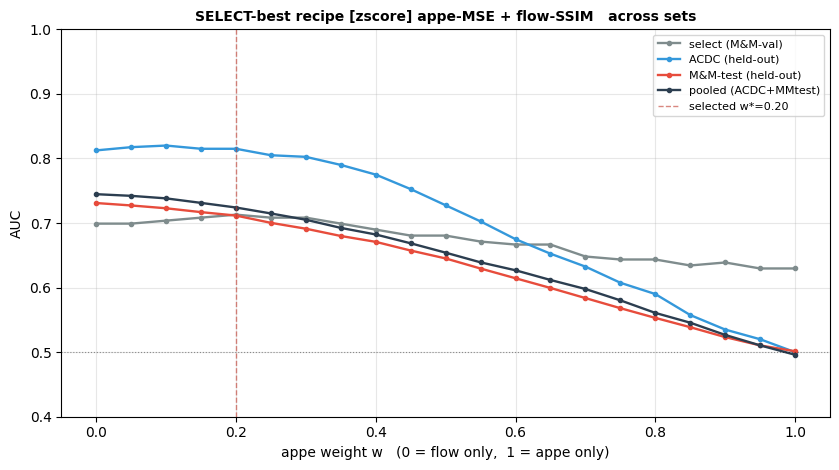

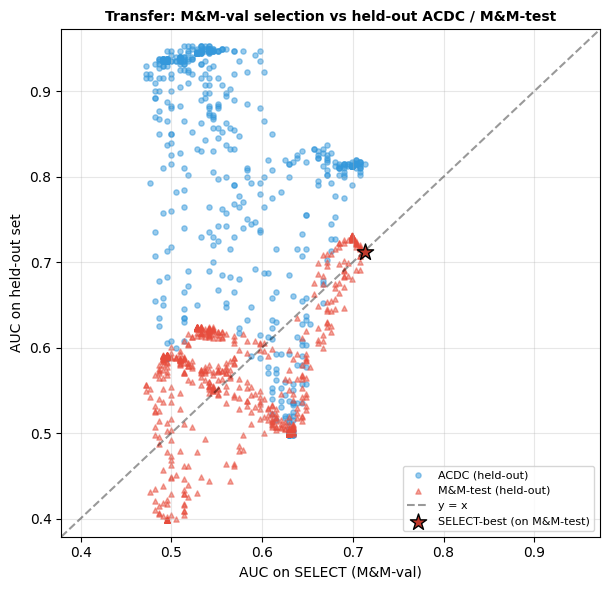

In [38]:
# === Visualize: top table, AUC-vs-w (best pair, all sets), M&M-val -> held-out transfer scatter =
import numpy as np, pandas as pd, matplotlib.pyplot as plt

METRICS = ['SSIM', 'PSNR', 'MSE']
MOTION = 'flow' if MODEL_TYPE == 'flow' else 'aux'
_setcols = ['auc_select', 'auc_rep_acdc', 'auc_rep_mmtest', 'auc_rep_pool']
_setlabel = {'auc_select': 'select (M&M-val)', 'auc_rep_acdc': 'ACDC (held-out)',
             'auc_rep_mmtest': 'M&M-test (held-out)', 'auc_rep_pool': 'pooled (ACDC+MMtest)'}

# -- top-12 by SELECT (M&M-val) AUC, with all held-out report columns --
_top = (xsweep_long.dropna(subset=['auc_select']).sort_values('auc_select', ascending=False)
        .head(12)[['method', 'appe_metric', 'flow_metric', 'w'] + _setcols].reset_index(drop=True))
print('TOP 12 recipes by SELECT (M&M-val) AUC -- with held-out report columns:')
display(_top.round(4))

# -- AUC vs w for the SELECT-best (method, pair): one line per set --
_b = xsweep_long.loc[xsweep_long.auc_select.idxmax()]
_sub = xsweep_long[(xsweep_long.method == _b.method) & (xsweep_long.appe_metric == _b.appe_metric)
                   & (xsweep_long.flow_metric == _b.flow_metric)].sort_values('w')
_colors = {'auc_select': '#7f8c8d', 'auc_rep_acdc': '#3498db',
           'auc_rep_mmtest': '#e74c3c', 'auc_rep_pool': '#2c3e50'}
fig, ax = plt.subplots(figsize=(8.5, 4.8))
for col in _setcols:
    ax.plot(_sub.w, _sub[col], marker='o', ms=3, lw=1.7, color=_colors[col], label=_setlabel[col])
ax.axvline(_b.w, color='#c0392b', ls='--', lw=1, alpha=0.6, label=f'selected w*={_b.w:.2f}')
ax.axhline(0.5, color='k', ls=':', lw=0.8, alpha=0.4)
ax.set_xlabel(f'appe weight w   (0 = {MOTION} only,  1 = appe only)')
ax.set_ylabel('AUC'); ax.set_ylim(0.4, 1.0); ax.grid(alpha=0.3)
ax.set_title(f'SELECT-best recipe [{_b.method}] appe-{_b.appe_metric} + {MOTION}-{_b.flow_metric}'
             f'   across sets', fontweight='bold', fontsize=10)
ax.legend(fontsize=8); plt.tight_layout(); plt.show()

# -- transfer scatter: M&M-val (select) AUC vs held-out AUCs --
fig, ax = plt.subplots(figsize=(6.2, 6))
for col, c, mk in [('auc_rep_acdc', '#3498db', 'o'), ('auc_rep_mmtest', '#e74c3c', '^')]:
    ax.scatter(xsweep_long.auc_select, xsweep_long[col], s=14, alpha=0.5, color=c,
               marker=mk, label=_setlabel[col])
_v = pd.concat([xsweep_long.auc_select, xsweep_long.auc_rep_acdc, xsweep_long.auc_rep_mmtest])
_lim = [_v.min() - 0.02, _v.max() + 0.02]
ax.plot(_lim, _lim, 'k--', alpha=0.4, label='y = x')
ax.scatter([_b.auc_select], [_b.auc_rep_mmtest], s=150, marker='*', color='#c0392b',
           edgecolor='k', zorder=5, label='SELECT-best (on M&M-test)')
ax.set_xlabel('AUC on SELECT (M&M-val)'); ax.set_ylabel('AUC on held-out set')
ax.set_xlim(_lim); ax.set_ylim(_lim); ax.grid(alpha=0.3)
ax.set_title('Transfer: M&M-val selection vs held-out ACDC / M&M-test', fontweight='bold', fontsize=10)
ax.legend(fontsize=8, loc='best'); plt.tight_layout(); plt.show()

## Per-Disease Results Table -- Validation-Winning Formula on the Held-out Test Sets (patient_mean)

Applies the recipe the cross-dataset sweep selected on M&M-val --
**`zscore`  appe-MSE (w=0.20) + flow-SSIM** -- to the **held-out test sets**, and decomposes it into
its two streams so you can see each one alone vs combined, per dataset and per disease:

    A(p) = w * z[ appe_MSE(p) ]  +  (1 - w) * z[ flow_SSIM_stored(p) ]   (patient_mean)
      w = 1.0  -> Appearance alone (appe-MSE)
      w = 0.0  -> Flow alone (flow-SSIM)
      w = 0.20 -> Combined (the winning formula)

- **ACDC** = all 50 ACDC patients, **M&M** = M&M Testing folder, **Combined** = ACDC + M&M-test.
  (M&M-Validation is the selection set, so it is excluded here.)
- `z[.]` is standardized **per evaluation set** (so the Combined formula's Overall row reproduces the
  sweep's held-out AUCs: ACDC ~ 0.8150, M&M ~ 0.7116, Combined ~ 0.7240). For deployment you would
  freeze the mean/std from a reference cohort instead.
- Tables: **Appearance alone**, **Flow alone**, **Combined**, the **delta (Combined - Flow alone)**
  (so you see per disease whether adding appearance helps), and **patient counts**.

> Per-disease n is small (ACDC: 10 per disease vs 10 NOR -> AUC SE ~ 0.12; some M&M groups are tiny),
> so per-disease cells are noisy -- the Overall row and the large groups (DCM/HCM) are the reliable
> ones. Requires `sweep_df` from cell 44.

In [40]:
# === Per-disease AUC table: appearance-alone / flow-alone / combined, per dataset =========
import numpy as np, pandas as pd
from sklearn.metrics import roc_auc_score

assert 'sweep_df' in globals(), "Run the 'Comprehensive Score-Way ...' cell first to build sweep_df."
MOTION = 'flow' if MODEL_TYPE == 'flow' else 'aux'
# -- winning recipe (selected on M&M-val by the cross-dataset sweep) -- edit if your model differs --
WIN_APPE, WIN_FLOW, WIN_W = 'MSE', 'SSIM', 0.20
_appe_col, _flow_col = f'appe__{WIN_APPE}', f'{MOTION}__{WIN_FLOW}'
_EPS = 1e-9


def _z(x):
    x = np.asarray(x, dtype=float)
    return (x - x.mean()) / (x.std() + _EPS)


def _auc_safe(y, s):
    y = np.asarray(y); s = np.asarray(s, dtype=float)
    m = np.isfinite(s); y, s = y[m], s[m]
    return roc_auc_score(y, s) if len(np.unique(y)) > 1 else np.nan


def _score(pat, w):
    # A = w * z(appe) + (1-w) * z(flow). w=1 -> appearance alone; w=0 -> flow alone. Per-set z-score.
    return w * _z(pat[_appe_col].values) + (1.0 - w) * _z(pat[_flow_col].values)


def _cohort_aucs(pat, w):
    s = _score(pat, w)
    lab = pat['label'].values
    out = {'Overall': _auc_safe((lab != 'NOR').astype(int), s)}
    for d in sorted(x for x in np.unique(lab) if x != 'NOR'):
        m = (lab == 'NOR') | (lab == d)
        out[d] = _auc_safe((lab[m] != 'NOR').astype(int), s[m])
    return out


# -- patient_mean rollups for the held-out test sets --
_agg = {_appe_col: 'mean', _flow_col: 'mean', 'label': 'first'}


def _roll(df):
    return df.groupby(['source', 'pid'], sort=False).agg(_agg).reset_index()


_acdc   = sweep_df[sweep_df.source == 'ACDC']
_mmtest = sweep_df[(sweep_df.source == 'MM') & (sweep_df.split == 'test')]
cohorts = {'ACDC': _roll(_acdc), 'M&M': _roll(_mmtest), 'Combined': _roll(pd.concat([_acdc, _mmtest]))}
for _n, _p in cohorts.items():
    _lab = _p['label'].values
    print(f'  {_n:9s}: {len(_p):4d} patients  ({int((_lab == "NOR").sum())} NOR / '
          f'{int((_lab != "NOR").sum())} unhealthy)')


def _table(w):
    cols = {name: _cohort_aucs(pat, w) for name, pat in cohorts.items()}
    rows = ['Overall'] + sorted({d for c in cols.values() for d in c if d != 'Overall'})
    return pd.DataFrame({name: [cols[name].get(r, np.nan) for r in rows] for name in cohorts}, index=rows)


_appe = _table(1.0)     # appearance alone (appe-MSE)
_flow = _table(0.0)     # flow alone (flow-SSIM)
_comb = _table(WIN_W)   # combined (winning formula)
_delta = _comb - _flow

print(f'\n=== APPEARANCE alone (appe-{WIN_APPE}, w=1) -- AUC ===')
display(_appe.round(4))
print(f'=== FLOW alone ({MOTION}-{WIN_FLOW}, w=0) -- AUC ===')
display(_flow.round(4))
print(f'=== COMBINED (winning: zscore appe-{WIN_APPE} w={WIN_W} + {MOTION}-{WIN_FLOW}) -- AUC ===')
display(_comb.round(4))
print(f'=== DELTA (Combined - Flow alone): >0 means adding appearance helps ===')
display(_delta.round(4))

# -- patient counts per disease per dataset --
def _counts(pat):
    lab = pat['label'].values
    out = {'NOR': int((lab == 'NOR').sum())}
    for d in sorted(x for x in np.unique(lab) if x != 'NOR'):
        out[d] = int((lab == d).sum())
    return out


_cnt = {name: _counts(pat) for name, pat in cohorts.items()}
_crows = ['NOR'] + sorted({d for c in _cnt.values() for d in c if d != 'NOR'})
print('=== Patient counts (per disease per dataset) ===')
display(pd.DataFrame({name: [_cnt[name].get(r, 0) for r in _crows] for name in cohorts}, index=_crows))

  ACDC     :   50 patients  (10 NOR / 40 unhealthy)
  M&M      :  134 patients  (31 NOR / 103 unhealthy)
  Combined :  184 patients  (41 NOR / 143 unhealthy)

=== APPEARANCE alone (appe-MSE, w=1) -- AUC ===


,ACDC,M&M,Combined
Overall,0.50,0.5014,0.4960
ARV,NaN,0.4032,0.4756
DCM,0.48,0.3972,0.4325
HCM,0.67,0.7041,0.6452
HHD,NaN,0.3903,0.4585
IHD,NaN,0.7527,0.8130
LVNC,NaN,0.7742,0.8293
MINF,0.54,NaN,0.3073
Other,NaN,0.4758,0.5620
RV,0.31,NaN,0.2073


=== FLOW alone (flow-SSIM, w=0) -- AUC ===


,ACDC,M&M,Combined
Overall,0.8125,0.7310,0.7447
ARV,NaN,0.7634,0.7967
DCM,0.9200,0.6488,0.7160
HCM,0.7000,0.8065,0.7472
HHD,NaN,0.7968,0.8146
IHD,NaN,0.9140,0.9350
LVNC,NaN,0.6774,0.6829
MINF,0.9400,NaN,0.8585
Other,NaN,0.7245,0.7561
RV,0.6900,NaN,0.5780


=== COMBINED (winning: zscore appe-MSE w=0.2 + flow-SSIM) -- AUC ===


,ACDC,M&M,Combined
Overall,0.815,0.7116,0.7240
ARV,NaN,0.7312,0.7724
DCM,0.920,0.5972,0.6743
HCM,0.780,0.8345,0.7546
HHD,NaN,0.7355,0.7756
IHD,NaN,0.9247,0.9350
LVNC,NaN,0.7258,0.7683
MINF,0.960,NaN,0.8098
Other,NaN,0.7177,0.7561
RV,0.600,NaN,0.5317


=== DELTA (Combined - Flow alone): >0 means adding appearance helps ===


,ACDC,M&M,Combined
Overall,0.0025,-0.0194,-0.0206
ARV,NaN,-0.0323,-0.0244
DCM,0.0000,-0.0516,-0.0417
HCM,0.0800,0.0281,0.0074
HHD,NaN,-0.0613,-0.0390
IHD,NaN,0.0108,0.0000
LVNC,NaN,0.0484,0.0854
MINF,0.0200,NaN,-0.0488
Other,NaN,-0.0067,0.0000
RV,-0.0900,NaN,-0.0463


=== Patient counts (per disease per dataset) ===


,ACDC,M&M,Combined
NOR,10,31,41
ARV,0,6,6
DCM,10,35,45
HCM,10,23,33
HHD,0,10,10
IHD,0,3,3
LVNC,0,2,2
MINF,10,0,10
Other,0,24,24
RV,10,0,10


## Hero figures -- normal vs. diseased (winning score)

The figures that tell the whole story in one glance. Every panel uses the recipe that
won on M&M validation:

$$\text{score} \;=\; 0.2 \cdot z(\text{appe-MSE}) \;+\; 0.8 \cdot z(\text{flow-SSIM})$$

Six columns, left to right: **input ES &middot; reconstructed ES &middot; appearance error
&middot; predicted motion &middot; GT motion &middot; motion error**. Normal rows reconstruct
cleanly with flat error maps; diseased rows concentrate error on the pathological wall
(thick septum for HCM, dead segment for MINF). The two error columns share a colour scale
across the rows, so "lights up" is literal.

This first cell defines the shared helpers (`hero_build_pool`, `hero_panels`, `hero_pick`,
`hero_middle_frame`, `render_hero`) -- **run it before the ACDC and manual sections below**
-- and renders the **combined (ACDC + M&M-test)** figure: cleanest NOR vs. clearest
HCM/MINF, auto-selected by the winning score. Reuses the in-memory inference arrays +
`sweep_df` from the *Rich per-sample score table* (sweep) cell (no re-inference). PNG ->
`generated/hero_figure/hero_normal_vs_disease.png`.

  NOR      : MM/H1N8S6  slice 4  score=-2.78
  HCM      : MM/A6B7Y4  slice 5  score=+1.95
  saved -> generated\hero_figure\hero_normal_vs_disease.png


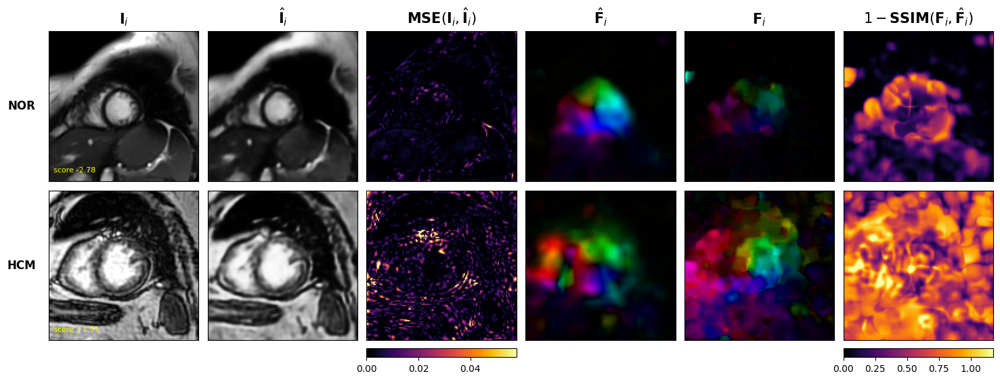

In [51]:
# === HERO FIGURES: shared helpers + combined figure (ACDC + M&M) =============
# Winning anomaly score (selected on M&M validation):
#     score = 0.2 * z(appe-MSE) + 0.8 * z(flow-SSIM)
# This cell defines the reusable helpers (hero_build_pool / hero_panels /
# hero_pick / hero_middle_frame / render_hero) used by THIS combined figure and
# by the ACDC-only and manual-selection sections below -- run it before those.
# Reuses the in-memory inference arrays from the sweep cell (NO re-inference):
#     _p1 (input ES) . _recon_img (reconstructed ES) . _p2 (GT flow) . _recon_aux (pred flow)
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

assert MODEL_TYPE == 'flow', "Hero figures are built for the flow model (predicted vs GT optical flow)."
for _name in ('sweep_df', '_p1', '_p2', '_recon_img', '_recon_aux'):
    assert _name in globals(), f"{_name} missing -- run the 'Rich per-sample score table' (sweep) cell first."
assert len(sweep_df) == len(_p1), "sweep_df is out of sync with the inference arrays; re-run the sweep cell."

_EPS = 1e-9
WIN_W = 0.20                              # appearance weight in the winning blend
APPE_COL, FLOW_COL = 'appe__MSE', 'flow__SSIM'
# bold math column titles (\mathbf bolds the symbols; mathtext renders \text as upright)
HERO_COLS = [r'$\mathbf{I}_i$', r'$\hat{\mathbf{I}}_i$',
             r'$\mathbf{MSE}(\mathbf{I}_i,\hat{\mathbf{I}}_i)$',
             r'$\hat{\mathbf{F}}_i$', r'$\mathbf{F}_i$',
             r'$1-\mathbf{SSIM}(\mathbf{F}_i,\hat{\mathbf{F}}_i)$']
_HERO_OUT_DIR = os.path.join('generated', 'hero_figure')


def hero_build_pool(sources):
    """Per-frame winning score over the chosen source(s), z-scored PER source.
    M&M is restricted to its test split (val is the recipe-selection set); ACDC keeps
    val+test. Adds arr_idx (position in _p1/_recon_*), win, mid_dist, is_mid."""
    pool = sweep_df[sweep_df.source.isin(sources)].copy()
    pool = pool[(pool.source != 'MM') | (pool.split == 'test')].copy()
    assert len(pool), f"No frames for sources={sources} in sweep_df."
    pool['arr_idx'] = np.arange(len(sweep_df))[pool.index.values]      # position in the arrays
    for _src, _g in pool.groupby('source'):
        pool.loc[_g.index, 'z_appe'] = (_g[APPE_COL] - _g[APPE_COL].mean()) / (_g[APPE_COL].std() + _EPS)
        pool.loc[_g.index, 'z_flow'] = (_g[FLOW_COL] - _g[FLOW_COL].mean()) / (_g[FLOW_COL].std() + _EPS)
    pool['win'] = WIN_W * pool['z_appe'] + (1.0 - WIN_W) * pool['z_flow']
    _med = pool.groupby(['source', 'pid'])['slice_idx'].transform('median')
    pool['mid_dist'] = (pool['slice_idx'] - _med).abs()
    pool['is_mid'] = pool['mid_dist'] <= 1
    return pool


def hero_panels(i):
    """The six panels for one sample index i (position in the inference arrays)."""
    inp = np.clip(_p1[i], 0.0, 1.0)                   # input ES (H,W,3 grayscale-replicated)
    rec = np.clip(_recon_img[i], 0.0, 1.0)           # reconstructed ES
    gtf, prf = _p2[i], _recon_aux[i]                   # GT / predicted flow [dx, dy, mag]
    appe_map = ((inp - rec) ** 2).mean(-1)            # per-pixel squared error (mean == appe-MSE)
    _dr = float(np.max([gtf, prf]) - np.min([gtf, prf])) or 1.0
    _, _S = ssim(gtf, prf, data_range=_dr, channel_axis=-1, full=True)
    motion_map = 1.0 - (_S.mean(-1) if _S.ndim == 3 else _S)   # flow-SSIM dissimilarity map
    return inp[..., 0], rec[..., 0], appe_map, flow_to_color(prf), flow_to_color(gtf), motion_map


def hero_pick(pool, mask, most_anomalous):
    """Patient with the most/least anomalous mean winning score, then its peak/cleanest
    frame. Mid-ventricular slices preferred; falls back to all slices if none."""
    sub = pool[mask & pool['is_mid']]
    if sub.empty:
        sub = pool[mask]
    if sub.empty:
        return None
    pm = sub.groupby(['source', 'pid'])['win'].mean()
    pid = pm.idxmax() if most_anomalous else pm.idxmin()
    pat = sub[(sub.source == pid[0]) & (sub.pid == pid[1])]
    return pat.loc[pat['win'].idxmax() if most_anomalous else pat['win'].idxmin()]


def hero_middle_frame(pool, source, pid):
    """The frame at this patient's MIDDLE (median) slice, regardless of score."""
    sub = pool[(pool.source == source) & (pool.pid == pid)]
    if sub.empty:
        return None
    return sub.loc[sub['mid_dist'].idxmin()]


def render_hero(rows, out_name=None):
    """rows: list of (row_label, meta_row). Returns the Figure (caller shows / closes it).
    Bold math column titles, class-only row labels, no figure title. Every panel is the
    SAME size (a dedicated thin row holds the two error colourbars, so they don't shrink
    columns 3/6). Error columns share a colour scale across rows. Saves a 300-dpi PNG."""
    panels = [hero_panels(int(m['arr_idx'])) for _, m in rows]
    appe_vmax = float(np.percentile(np.concatenate([p[2].ravel() for p in panels]), 99.5)) or _EPS
    mot_vmax = float(np.percentile(np.concatenate([p[5].ravel() for p in panels]), 99.5)) or _EPS
    nrows = len(rows)
    fig = plt.figure(figsize=(15, 2.5 * nrows + 0.7))
    # nrows x 6 equal image cells on top, plus a thin row for the two colourbars
    gs = fig.add_gridspec(nrows + 1, 6, height_ratios=[1] * nrows + [0.06],
                          left=0.06, right=0.99, top=0.90, bottom=0.05, wspace=0.06, hspace=0.06)
    axes = np.empty((nrows, 6), dtype=object)
    im_appe = im_mot = None
    for r, ((rlabel, meta), pan) in enumerate(zip(rows, panels)):
        img_es, rec_es, appe_map, pred_rgb, gt_rgb, motion_map = pan
        cells = [(img_es, 'gray', 0, 1), (rec_es, 'gray', 0, 1),
                 (appe_map, 'inferno', 0, appe_vmax),
                 (np.clip(pred_rgb, 0, 1), None, None, None),
                 (np.clip(gt_rgb, 0, 1), None, None, None),
                 (motion_map, 'inferno', 0, mot_vmax)]
        for c, (arr, cmap, vmin, vmax) in enumerate(cells):
            ax = fig.add_subplot(gs[r, c])
            axes[r, c] = ax
            if cmap is None:
                ax.imshow(arr)
            else:
                im = ax.imshow(arr, cmap=cmap, vmin=vmin, vmax=vmax)
                if c == 2:
                    im_appe = im
                elif c == 5:
                    im_mot = im
            ax.set_xticks([])
            ax.set_yticks([])
        axes[r, 0].set_ylabel(rlabel, fontsize=12, fontweight='bold', rotation=0,
                              ha='right', va='center', labelpad=14)
        axes[r, 0].text(0.03, 0.05, f"score {meta['win']:+.2f}", transform=axes[r, 0].transAxes,
                        color='yellow', fontsize=8, ha='left', va='bottom')
    for c, t in enumerate(HERO_COLS):
        axes[0, c].set_title(t, fontsize=15, fontweight='bold', pad=8)
    fig.colorbar(im_appe, cax=fig.add_subplot(gs[nrows, 2]), orientation='horizontal')
    fig.colorbar(im_mot, cax=fig.add_subplot(gs[nrows, 5]), orientation='horizontal')
    if out_name:
        os.makedirs(_HERO_OUT_DIR, exist_ok=True)
        fp = os.path.join(_HERO_OUT_DIR, out_name)
        fig.savefig(fp, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"  saved -> {fp}")
    return fig


# -- combined figure: cleanest NOR + clearest HCM/MINF across ACDC + M&M-test -------------------
_pool_comb = hero_build_pool(['ACDC', 'MM'])
_dis_mask = _pool_comb['label'].isin(['HCM', 'MINF'])
if not _dis_mask.any():
    _dis_mask = _pool_comb['label'].ne('NOR')
    print("  (no HCM/MINF in pool -- using the most anomalous non-NOR case)")
_dis = hero_pick(_pool_comb, _dis_mask, True)
_nor = hero_pick(_pool_comb, _pool_comb['label'].eq('NOR'), False)
print(f"  NOR      : {_nor['source']}/{_nor['pid']}  slice {int(_nor['slice_idx'])}  score={_nor['win']:+.2f}")
print(f"  {str(_dis['label']):<8s} : {_dis['source']}/{_dis['pid']}  slice {int(_dis['slice_idx'])}  score={_dis['win']:+.2f}")
_rows = [(str(_nor['label']), _nor), (str(_dis['label']), _dis)]
render_hero(_rows, out_name='hero_normal_vs_disease.png')
plt.show()

### Hero figure -- ACDC only

The same figure restricted to **ACDC** (pool and per-source z-scoring both ACDC-only --
this is the dataset that contains MINF). Cleanest NOR vs. clearest HCM/MINF, auto-selected
by the winning score. PNG -> `generated/hero_figure/hero_acdc_normal_vs_disease.png`.

  NOR      : ACDC/patient125  slice 9  score=-1.29
  MINF     : ACDC/patient143  slice 4  score=+1.21
  saved -> generated\hero_figure\hero_acdc_normal_vs_disease.png


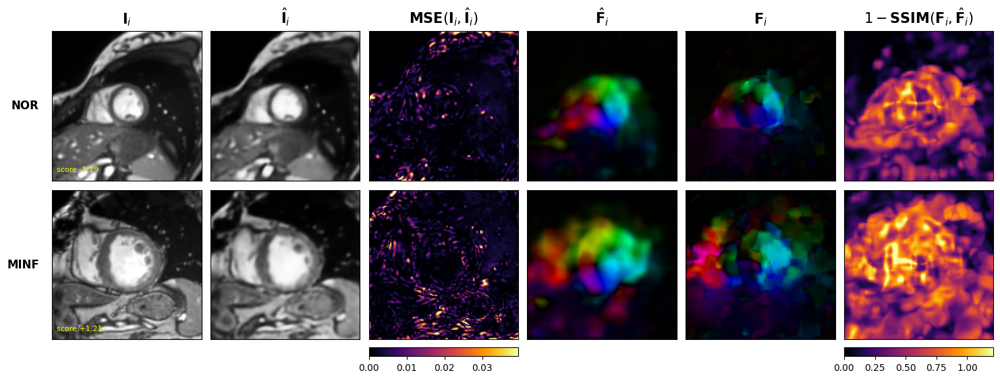

In [52]:
# === HERO FIGURE -- ACDC only ================================================
# Same winning recipe, but the pool AND the per-source z-scoring are restricted to
# ACDC (which is where MINF lives). Reuses the helpers from the combined hero cell.
assert 'render_hero' in globals(), "Run the combined hero-figure cell first (it defines the helpers)."
import matplotlib.pyplot as plt

_pool_acdc = hero_build_pool(['ACDC'])
_dis_mask_a = _pool_acdc['label'].isin(['HCM', 'MINF'])
if not _dis_mask_a.any():
    _dis_mask_a = _pool_acdc['label'].ne('NOR')
    print("  (no HCM/MINF in ACDC pool -- using the most anomalous non-NOR case)")
_dis_a = hero_pick(_pool_acdc, _dis_mask_a, True)
_nor_a = hero_pick(_pool_acdc, _pool_acdc['label'].eq('NOR'), False)
print(f"  NOR      : ACDC/{_nor_a['pid']}  slice {int(_nor_a['slice_idx'])}  score={_nor_a['win']:+.2f}")
print(f"  {str(_dis_a['label']):<8s} : ACDC/{_dis_a['pid']}  slice {int(_dis_a['slice_idx'])}  score={_dis_a['win']:+.2f}")
_rows_a = [(str(_nor_a['label']), _nor_a), (str(_dis_a['label']), _dis_a)]
render_hero(_rows_a, out_name='hero_acdc_normal_vs_disease.png')
plt.show()

### Hero figure -- manual patient selection (middle slice)

Pick **any** patient from the dropdown and the same six-panel layout renders for that
patient at its **middle slice** (median z), with a cleanest-NOR reference row on top for
contrast. The **Dataset** filter narrows the patient list (and the reference). Needs
`ipywidgets`. Each render is also exported to
`generated/hero_figure/hero_manual_selection.png`.

In [ ]:
# === HERO FIGURE -- manual patient selection (always the MIDDLE slice) =======
# Pick any patient from the dropdown; the figure shows a cleanest-NOR reference row
# (top) and the selected patient at its MIDDLE slice (bottom) in the same 6-panel
# layout. Row labels show only the class; the selection details are printed (not on
# the image). The Dataset filter narrows the patient list and the NOR reference.
# Each render is also exported to generated/hero_figure/hero_manual_selection.png.
assert 'render_hero' in globals(), "Run the combined hero-figure cell first (it defines the helpers)."
import matplotlib.pyplot as plt
try:
    import ipywidgets as widgets
    from IPython.display import display, clear_output
except ImportError:
    widgets = None
    print("ipywidgets not available -- install it to use the interactive selector.")

_pool_int = hero_build_pool(['ACDC', 'MM'])


def _hero_patient_options(dataset):
    pl = _pool_int if dataset == 'All' else _pool_int[_pool_int.source == dataset]
    pats = (pl[['source', 'pid', 'label']].drop_duplicates()
            .sort_values(['source', 'label', 'pid']))
    return [(f"{r.source:5s} {r.pid}  [{r.label}]", (r.source, r.pid)) for r in pats.itertuples()]


def _hero_nor_ref(dataset):
    srcs = ['ACDC', 'MM'] if dataset == 'All' else [dataset]
    pool = hero_build_pool(srcs)
    return hero_pick(pool, pool['label'].eq('NOR'), False)


if widgets is not None:
    _dd_ds = widgets.Dropdown(options=['All', 'ACDC', 'MM'], value='All', description='Dataset:')
    _dd_pat = widgets.Dropdown(options=_hero_patient_options('All'), description='Patient:',
                               layout=widgets.Layout(width='360px'))
    _hero_out = widgets.Output()

    def _hero_draw(*_):
        with _hero_out:
            clear_output(wait=True)
            src, pid = _dd_pat.value
            sel = hero_middle_frame(_pool_int, src, pid)
            ref = _hero_nor_ref(_dd_ds.value)
            if sel is None or ref is None:
                print("No frames for that selection.")
                return
            print(f"{src} {pid} [{sel['label']}]  --  middle slice idx {int(sel['slice_idx'])}")
            rows = [(str(ref['label']), ref), (str(sel['label']), sel)]
            fig = render_hero(rows, out_name='hero_manual_selection.png')
            display(fig)
            plt.close(fig)

    def _hero_on_dataset(_):
        _dd_pat.options = _hero_patient_options(_dd_ds.value)
        _hero_draw()

    _dd_ds.observe(_hero_on_dataset, names='value')
    _dd_pat.observe(_hero_draw, names='value')
    display(widgets.VBox([widgets.HBox([_dd_ds, _dd_pat]), _hero_out]))
    _hero_draw()

### Reconstruction + flow only (no anomaly maps)

A clean qualitative view of the model's outputs -- **four columns**: input $I_i$,
reconstruction $\hat{I}_i$, **ground-truth flow $F_i$** (3rd), **generated flow
$\hat{F}_i$** (4th). No appearance / motion error maps and no colourbars. Pick **one
normal (NOR) patient and two diseased patients** from the dropdowns; each row renders
that patient at its **middle slice** (median z). Defaults to the cleanest NOR + the two
most-anomalous diseased cases. Reuses the helpers from the combined hero-figure cell --
run that first. PNG -> `generated/hero_figure/reconflow_manual.png`.

In [55]:
# === RECON + FLOW viewer -- no anomaly maps (input | recon | GT flow | gen flow) ===
# A clean qualitative view of the model's outputs: four equal panels per row --
# input I_i, reconstruction hat{I}_i, GROUND-TRUTH flow F_i (3rd column), GENERATED
# flow hat{F}_i (4th column). No appearance / motion error maps and no colourbars.
# Pick ONE normal (NOR) patient + TWO diseased patients; each row is rendered at that
# patient's MIDDLE slice. Reuses the helpers from the combined hero-figure cell.
# PNG -> generated/hero_figure/reconflow_manual.png.
assert 'hero_panels' in globals(), "Run the combined hero-figure cell first (it defines the helpers)."
import os
import numpy as np
import matplotlib.pyplot as plt
try:
    import ipywidgets as widgets
    from IPython.display import display, clear_output
except ImportError:
    widgets = None
    print("ipywidgets not available -- install it to use the interactive selector.")

# column titles: input, reconstruction, GROUND-TRUTH flow (3rd), GENERATED flow (4th)
RECONFLOW_COLS = [r'$\mathbf{I}_i$', r'$\hat{\mathbf{I}}_i$', r'$\mathbf{F}_i$', r'$\hat{\mathbf{F}}_i$']


def render_recon_flow(rows, out_name=None):
    """rows: list of (row_label, meta_row). Four equal-size panels per row -- input,
    reconstruction, GT flow, generated flow (no error maps / colourbars). Bold math
    titles, class-only row labels, no figure title. Saves a 300-dpi PNG if out_name."""
    nrows = len(rows)
    figh = 2.5 * nrows + 0.5
    fig = plt.figure(figsize=(10, figh))
    gs = fig.add_gridspec(nrows, 4, left=0.07, right=0.99,
                          top=1 - 0.40 / figh, bottom=0.10 / figh, wspace=0.06, hspace=0.06)
    for r, (rlabel, meta) in enumerate(rows):
        inp, rec, _appe, pred, gt, _mot = hero_panels(int(meta['arr_idx']))
        cells = [(inp, 'gray'), (rec, 'gray'), (np.clip(gt, 0, 1), None), (np.clip(pred, 0, 1), None)]
        for c, (arr, cmap) in enumerate(cells):
            ax = fig.add_subplot(gs[r, c])
            if cmap:
                ax.imshow(arr, cmap=cmap, vmin=0, vmax=1)
            else:
                ax.imshow(arr)
            ax.set_xticks([])
            ax.set_yticks([])
            if r == 0:
                ax.set_title(RECONFLOW_COLS[c], fontsize=15, fontweight='bold', pad=8)
            if c == 0:
                ax.set_ylabel(rlabel, fontsize=12, fontweight='bold', rotation=0,
                              ha='right', va='center', labelpad=14)
    if out_name:
        os.makedirs(_HERO_OUT_DIR, exist_ok=True)
        fp = os.path.join(_HERO_OUT_DIR, out_name)
        fig.savefig(fp, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"  saved -> {fp}")
    return fig


_pool_rf = hero_build_pool(['ACDC', 'MM'])


def _rf_options(diseased):
    """Dropdown options (label, (source,pid)) for NOR or for diseased patients."""
    pl = _pool_rf[_pool_rf.label.ne('NOR')] if diseased else _pool_rf[_pool_rf.label.eq('NOR')]
    pats = (pl[['source', 'pid', 'label']].drop_duplicates()
            .sort_values(['source', 'label', 'pid']))
    return [(f"{r.source:5s} {r.pid}  [{r.label}]", (r.source, r.pid)) for r in pats.itertuples()]


def _rf_defaults():
    """Sensible defaults: cleanest NOR + the two most-anomalous distinct diseased patients."""
    nor = hero_pick(_pool_rf, _pool_rf['label'].eq('NOR'), False)
    dmask = _pool_rf['label'].isin(['HCM', 'MINF'])
    if not dmask.any():
        dmask = _pool_rf['label'].ne('NOR')
    sub = _pool_rf[dmask & _pool_rf['is_mid']]
    if sub.empty:
        sub = _pool_rf[dmask]
    order = list(sub.groupby(['source', 'pid'])['win'].mean().sort_values(ascending=False).index)
    nor_def = (nor['source'], nor['pid']) if nor is not None else None
    d1 = order[0] if order else None
    d2 = next((p for p in order if p != d1), d1)
    return nor_def, d1, d2


if widgets is not None:
    _style = {'description_width': '90px'}
    _lay = widgets.Layout(width='380px')
    _rf_nor = widgets.Dropdown(options=_rf_options(False), description='Normal:', style=_style, layout=_lay)
    _rf_d1 = widgets.Dropdown(options=_rf_options(True), description='Diseased 1:', style=_style, layout=_lay)
    _rf_d2 = widgets.Dropdown(options=_rf_options(True), description='Diseased 2:', style=_style, layout=_lay)
    _rf_out = widgets.Output()

    _nor_def, _d1_def, _d2_def = _rf_defaults()
    for _dd, _val in ((_rf_nor, _nor_def), (_rf_d1, _d1_def), (_rf_d2, _d2_def)):
        if _val in [o[1] for o in _dd.options]:
            _dd.value = _val

    def _rf_draw(*_):
        with _rf_out:
            clear_output(wait=True)
            rows = []
            for _dd in (_rf_nor, _rf_d1, _rf_d2):
                src, pid = _dd.value
                sel = hero_middle_frame(_pool_rf, src, pid)
                if sel is not None:
                    rows.append((str(sel['label']), sel))
            if not rows:
                print("No frames for that selection.")
                return
            print("  |  ".join(f"{m['source']} {m['pid']} [{lbl}] z{int(m['slice_idx'])}" for lbl, m in rows))
            fig = render_recon_flow(rows, out_name='reconflow_manual.png')
            display(fig)
            plt.close(fig)

    for _dd in (_rf_nor, _rf_d1, _rf_d2):
        _dd.observe(_rf_draw, names='value')
    display(widgets.VBox([_rf_nor, _rf_d1, _rf_d2, _rf_out]))
    _rf_draw()